In [2]:
import pandas as pd
import os
import re
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import gensim
import numpy as np
from gensim.corpora.dictionary import Dictionary
import matplotlib
import matplotlib as mpl

# 计算各个主题权重

In [8]:
dirs = '../result/papers+juling/csv'
filename = 'news_ts_filter_sw+res+ex+tfidf_40topics_40passes_600iter_0.5quantitle_10000chs_2021rs.csv'
path = os.path.join(dirs, filename)

In [25]:
data = pd.DataFrame()
data[filename] = np.sum(pd.read_csv(path,index_col=0))
for file in os.listdir(dirs):
    if file.startswith('news_ts'):
        path = os.path.join(dirs, file)
        data[file] = np.sum(pd.read_csv(path,index_col=0))

In [27]:
agg_file = 'agg_news_ts.csv'
data.to_csv(os.path.join(dirs, agg_file))

In [17]:
data = pd.DataFrame()
data[filename] = np.sum(pd.read_csv(path,index_col=0))

In [28]:
dirs = '../result/papers+juling2/csv'

In [29]:
data = pd.DataFrame()
data[filename] = np.sum(pd.read_csv(path,index_col=0))
for file in os.listdir(dirs):
    if file.startswith('news_ts'):
        path = os.path.join(dirs, file)
        data[file] = np.sum(pd.read_csv(path,index_col=0))

In [30]:
agg_file = 'agg_news_ts2.csv'
data.to_csv(os.path.join(dirs, agg_file))

# 作词云图

In [2]:
from matplotlib import rcParams

config = {
    "font.family":'serif',
    "font.size": 20,
    "mathtext.fontset":'stix',
    "font.serif": ['SimSun'],
}
rcParams.update(config)

In [14]:
def multi_wordclouds(num_topics,data,wc4tp_path,col_max = 4,fig_size=3):
    font_path = '../files/fonts/SimSun.ttf'
#     backgroud_Image = np.array(Image.open('../files/pictures/qq.jpg'))
    row_max = int(np.ceil(num_topics/col_max))
    topic_name = data.index
    k=0
    figure,axes = plt.subplots(row_max,col_max,figsize=(fig_size*col_max,fig_size*row_max),tight_layout=True)
    plt.subplots_adjust(left  = 0.125,right = 0.9,bottom = 0.1,top = 0.9,wspace = 0.2,hspace = 0.2)
    plt.margins(0,0)
    #设置字体为楷体
    font_path = '../files/fonts/SimSun.ttf'
    myfont = matplotlib.font_manager.FontProperties(fname=font_path)  
    mpl.rcParams['axes.unicode_minus'] = False  
    #plt.suptitle('主题词云',fontsize=40)
    for i in range(row_max):
        for j in range(col_max):
            try:
                ax = axes[i][j]
            except TypeError:
                ax = axes[j]
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['bottom'].set_visible(False)
            ax.spines['left'].set_visible(False)
            ax.set_xticks([])
            ax.set_yticks([])
            title = topic_name[k]
            ax.set_title(title,fontsize=fig_size*4);

            wc_figure = WordCloud(background_color='white',  # 设置背景颜色，与图片的背景色相关
#                                   mask=backgroud_Image,  # 设置背景图片
                                  max_words=500,  # 设置最大显示的字数
                                  font_path = font_path,
                                  width = 700, height = 500,
                                  max_font_size=250,  # 设置字体最大值
                                  random_state=2021,  # 设置有多少种随机生成状态，即有多少种配色方案
                                  scale=1,min_word_length=2).generate_from_frequencies(dict(list(data.iloc[k])))
#             image_colors = ImageColorGenerator(backgroud_Image)
#             ax.imshow(wc_figure.recolor(color_func=image_colors),interpolation='bilinear');
            ax.imshow(wc_figure);
            k+=1
            print(k)
            if k == num_topics:
                break
    figure.savefig(wc4tp_path,bbox_inches = 'tight',transparent=True,pad_inches=0)
    plt.close()

In [15]:
def data_tran(data):
    for c in range(data.shape[0]):
        for r in range(data.shape[1]):
            data.iloc[c][r] = eval(data.iloc[c][r])
    return data

In [123]:
dirs = '../result/papers+juling100/csv'
dir_fig = '../result/papers+juling100/fig'
file_label = 'labels_v3.xlsx'
labels = pd.read_excel(os.path.join(dirs, file_label))

In [124]:
for file in os.listdir(dirs):
    if file.startswith('news_kw'):
        if re.findall('_(\d*)passes',file)[0] == '20':
            continue
        if re.findall('_(\d*)topics',file)[0] != '70':
            continue
        print(file)

        #读主题关键词
        path = os.path.join(dirs, file)
        data = pd.read_csv(path,index_col=0)
        #计算主题重要性
        file_ts = 'news_ts'+file[7:-13]+'.csv'
        path_ts = os.path.join(dirs, file_ts)
        weight = np.sum(pd.read_csv(path_ts,index_col=0)).round(decimals=4)
        #主题排序排序
        data.index = weight
        data = data.sort_index(ascending=False)
        #赋值主题标签
        num_topics = re.findall('_(\d*)topics',file)[0]
        label = labels['LDA{}'.format(num_topics)]
        label = sorted(list(zip(weight,label)),reverse=True)
        label_index = []
        for l in label:
            label_index.append(str(l[1])+'  '+str(l[0]))
        data.index = label_index
        #数据格式改写
        data = data_tran(data)
        #作图
        file_wc = 'news_wc_label'+file[7:-4]+'.png'
        wc4tp_path = os.path.join(dir_fig,file_wc)
        multi_wordclouds(int(num_topics),data,wc4tp_path,col_max = 5,fig_size=5)

news_kw_filter_sw+res+ex+tfidf_70topics_40passes_600iter_0.5quantitle_10000chs_2021rs_100words.csv
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
news_kw_normalize_filter_sw+res+ex+tfidf_70topics_40passes_600iter_0.5quantitle_10000chs_100rs_2021words_100referwords.csv


FileNotFoundError: [Errno 2] No such file or directory: '../result/papers+juling100/csv\\news_ts_normalize_filter_sw+res+ex+tfidf_70topics_40passes_600iter_0.5quantitle_10000chs_100rs_2021words_100r.csv'

# 加载模型+提取参数


In [3]:
dirs = '../result/papers+juling_tp/model'
quantile = 0.5
num_words = 100
modelname = os.listdir(dirs)[3]
print(modelname)
num_topics = int(re.findall('_(\d*)\.',modelname)[0])
print('num_topics:',num_topics,'\nquantile:',quantile)

lda_tp_80.bin
num_topics: 80 
quantile: 0.5


In [4]:
root = '../result/papers+juling_tp'
ex = 100
document_tfidf_file = 'document_stopwordfilter_{}tfidf_{}ex.npy'.format(quantile,ex)
document_tfidf_path = os.path.join(root,document_tfidf_file)
document_tfidf = np.load(document_tfidf_path,allow_pickle=True)
document_tfidf = document_tfidf.tolist()
dictionary_tfidf = Dictionary(document_tfidf)


In [5]:
dirs = os.path.join(root, 'model')
path = os.path.join(dirs, modelname)
import tomotopy as tp
mdl = tp.LDAModel()
mdl = mdl.load(path)

In [6]:
print('Num docs:', len(mdl.docs), ', Vocab size:', len(mdl.used_vocabs), ', Num words:', mdl.num_words)

Num docs: 958950 , Vocab size: 83062 , Num words: 70210582


# 标准化

In [51]:
%%time
#获取每个主题在所有词上面的权重分布
all_terms = []
for t in range(num_topics):
#     all_terms.append(mdl.get_topic_word_dist(topic_id=t, normalize=True))
    all_terms.append(mdl.get_topic_word_dist(topic_id=t, normalize=False))
    if t%10 == 9:
        print('已完成{}个主题的分布计算'.format(t))

已完成9个主题的分布计算
已完成19个主题的分布计算
已完成29个主题的分布计算
已完成39个主题的分布计算
已完成49个主题的分布计算
已完成59个主题的分布计算
已完成69个主题的分布计算
已完成79个主题的分布计算
Wall time: 41.9 ms


In [ ]:
%%time
#将词转化为dataframe格式
all_terms_pd = pd.DataFrame(all_terms)#转换全部的词
# all_terms_pd = all_terms_pd[sorted(ids)]#只取词库中出现过的词
all_terms_pd.head()

In [52]:
%%time
#将词转化为dataframe格式
all_terms_pd2 = pd.DataFrame(all_terms)#转换全部的词
# all_terms_pd = all_terms_pd[sorted(ids)]#只取词库中出现过的词
all_terms_pd2.head()

Wall time: 4.13 s


,0,1,2,3,4,5,6,7,8,9,...,83052,83053,83054,83055,83056,83057,83058,83059,83060,83061
0,0.01000,169.009995,5353.009766,53.009998,236.009995,282.01001,0.01,33.009998,154.009995,691.010010,...,0.01,0.010000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
1,0.01000,720.010010,0.010000,144.009995,0.010000,0.01000,0.01,0.010000,0.010000,0.010000,...,0.01,0.010000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
2,0.01000,0.010000,310.010010,0.010000,144.009995,350.01001,0.01,0.010000,708.010010,105.010002,...,18.01,48.009998,0.01,28.01,0.01,0.01,0.01,0.01,0.01,0.01
3,547.01001,4085.010010,39.009998,0.010000,2664.010010,438.01001,0.01,554.010010,3117.010010,0.010000,...,0.01,0.010000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
4,277.01001,0.010000,0.010000,0.010000,0.010000,0.01000,0.01,0.010000,152.009995,33.009998,...,0.01,0.010000,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01


In [105]:
%%time
#最最普通的标准化
#避免某些词在所有主题均占比过大的情况
all_terms_pd.loc['col_sum'] = all_terms_pd.apply(lambda x: x.sum())#工具行，存储各列的总值，即同一个词在不同主题下权重的总值
factor = all_terms_pd.loc['col_sum']
for i in all_terms_pd.columns:
    all_terms_pd[i] = all_terms_pd.loc[:,i]/factor[i]#每一个词在不同主题下的权重除以总值
all_terms_pd.head()

Wall time: 5.77 s


,0,2,3,5,6,7,9,12,14,15,...,49529,49530,49533,49534,49537,49540,49542,49551,49553,49555
0,0.000073,0.000158,0.000959,0.028358,0.000431,0.003431,0.001453,0.023390,0.002405,0.335797,...,0.016586,0.004705,0.000835,0.000130,0.000366,0.001269,0.004783,0.000564,0.000467,0.004366
1,0.000194,0.000208,0.000276,0.002674,0.000541,0.005418,0.001908,0.010186,0.002821,0.013118,...,0.000500,0.000151,0.000351,0.000231,0.000106,0.000240,0.000231,0.000250,0.001798,0.006875
2,0.000498,0.000286,0.002262,0.105317,0.004817,0.069962,0.009843,0.043344,0.000284,0.001116,...,0.000807,0.001907,0.000180,0.000102,0.000160,0.007916,0.000802,0.000126,0.000506,0.002693
3,0.000374,0.000588,0.001057,0.054244,0.001396,0.001193,0.000714,0.007494,0.001373,0.010412,...,0.000558,0.310849,0.321435,0.000189,0.000123,0.000396,0.075982,0.000050,0.000059,0.004000
4,0.000370,0.000479,0.000125,0.000437,0.000720,0.000277,0.010656,0.000465,0.000085,0.000151,...,0.000178,0.000073,0.000273,0.011989,0.000081,0.000990,0.000054,0.000582,0.001934,0.009762


In [106]:
arr = np.argsort(-all_terms_pd.values, axis=1)#argsort函数返回的是数组值从小到大的索引值，此处取相反数，得到从大到小的索引
arr

array([[ 1476,  5418,  2519, ...,  6982,  7467, 12571],
       [11434,  8127, 11092, ..., 12137, 12477, 12571],
       [12383, 11673,  7493, ..., 12477,  7467, 12571],
       ...,
       [ 8286, 12158, 11907, ...,  7467, 12477, 12571],
       [ 6124,  8857,  9010, ...,  7467, 12477, 12571],
       [    0,  8394,  8395, ...,  4205,  4207, 12599]], dtype=int64)

In [107]:
all_terms_res = pd.DataFrame(all_terms_pd.columns[arr], index=all_terms_pd.index)
all_terms_res.head()

C:\Users\linhw\AppData\Local\Temp\2/ipykernel_16344/631607347.py:1: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  all_terms_res = pd.DataFrame(all_terms_pd.columns[arr], index=all_terms_pd.index)


,0,1,2,3,4,5,6,7,8,9,...,12590,12591,12592,12593,12594,12595,12596,12597,12598,12599
0,3172,13111,5522,18644,12281,23841,8765,4119,19295,45632,...,29243,29239,41255,41256,34209,34485,15393,18130,19955,49461
1,43731,22850,41338,45466,35688,2990,44635,41645,17307,37376,...,38235,36167,48903,49312,48772,15393,19955,47685,49110,49461
2,48793,45071,20039,41246,23029,16107,734,23221,7228,39224,...,35052,36167,18130,49379,29239,39750,22850,49110,19955,49461
3,44253,10593,23167,16002,9455,25116,17225,19150,24854,29325,...,49379,11905,20643,48772,41256,18130,15393,47685,19955,49461
4,22208,39588,25834,42464,43183,49006,20130,42468,18211,48362,...,35052,46553,48903,49312,48772,15393,47685,49110,19955,49461


In [58]:
all_terms_res.iloc[row,col]

10101

In [67]:
all_terms_pd.loc[row,idx]

0.48761457586059853

In [113]:
words

[('大商所', 0.7029778718488446),
 ('纽约商品交易所', 0.7029778718488446),
 ('伦敦布伦特', 0.7029778718488446),
 ('郑商所', 0.7029778718488446),
 ('郑州商品交易所', 0.7029778718488446),
 ('大连商品交易所', 0.7029778718488446),
 ('上期所', 0.7029778718488446),
 ('期货合约', 0.7029778718488446),
 ('原油期货', 0.7029778718488446),
 ('结算价', 0.7029778718488446),
 ('白银期货', 0.7029778718488446),
 ('实物交割', 0.7029778718488446),
 ('期货价格', 0.7029778718488446),
 ('蒲式耳', 0.7029778718488446),
 ('纽约市场', 0.7029778718488446),
 ('LME', 0.7029778718488446),
 ('布伦特', 0.7029778718488446),
 ('现货', 0.7029778718488446),
 ('糖价', 0.7029778718488446),
 ('基本金属', 0.7029778718488446),
 ('银价', 0.7029778718488446),
 ('现货市场', 0.7029778718488446),
 ('国际黄金市场', 0.7029778718488446),
 ('每盎司', 0.7029778718488446),
 ('黄金期货', 0.7029778718488446),
 ('沪铜', 0.7029778718488446),
 ('期货市场', 0.7029778718488446),
 ('铜期货', 0.7029778718488446),
 ('棉价', 0.7029778718488446),
 ('NYMEX', 0.7029778718488446),
 ('豆油', 0.7029778718488446),
 ('期铜', 0.7029778718488446),
 ('市场原油', 0.702977

In [118]:
print(row,col,len(words))

0 100 100


In [125]:
key_words = pd.DataFrame(index=[i for i in range(num_topics)],columns=['kw_{}'.format(str(i)) for i in range(num_words)])
key_words

,kw_0,kw_1,kw_2,kw_3,kw_4,kw_5,kw_6,kw_7,kw_8,kw_9,...,kw_90,kw_91,kw_92,kw_93,kw_94,kw_95,kw_96,kw_97,kw_98,kw_99
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
%%time
num_words = 100
# wordid = [i for i in range(num_words)]
# key_words = pd.DataFrame(wordid)
for row in range(num_topics):
    words = []
#     for col in range(num_words):
    col = 0
    while len(words) < num_words:
#         idx = arr[row,col]
        idx = all_terms_res.iloc[row,col]
        word = dictionary_tfidf[idx]
        weight = all_terms_pd.loc[row,idx]
        words.append((word,weight))
#         if word in refers[row]:
#             weight = all_terms_pd.loc[row,idx]
#             words.append((word,weight))
# #             words.append(word)
        col += 1
#     key_words.loc[row] = pd.DataFrame(words)
    key_words.loc[row] = words
key_words.head()

Wall time: 191 ms


,kw_0,kw_1,kw_2,kw_3,kw_4,kw_5,kw_6,kw_7,kw_8,kw_9,...,kw_90,kw_91,kw_92,kw_93,kw_94,kw_95,kw_96,kw_97,kw_98,kw_99
0,"(科技成果, 0.8981588503738975)","(产学研, 0.8899917378197592)","(创新体系, 0.860942004419846)","(产学研结合, 0.8363096793434155)","(科研院所, 0.8348455228653424)","(自主创新能力, 0.8348181612304595)","(运载火箭, 0.8337281532735783)","(创新能力, 0.8324244911083969)","(发明专利, 0.819286492682911)","(创新链, 0.8069951750376032)",...,"(机床, 0.5072384306098585)","(太空, 0.5039844027591048)","(强国, 0.5002278538903672)","(高精尖, 0.4945109640064973)","(前沿技术, 0.49368832083294356)","(人才队伍, 0.4916379239908683)","(科技含量, 0.49043391182995555)","(国际竞争力, 0.4847705698583002)","(专利, 0.4838468184271027)","(神舟, 0.4828511191548489)"
1,"(大商所, 0.9589342152258539)","(纽约商品交易所, 0.9560395863534449)","(伦敦布伦特, 0.9532835940459325)","(郑商所, 0.9510938972298514)","(郑州商品交易所, 0.9510328724239289)","(大连商品交易所, 0.9498841365604646)","(上期所, 0.9480161884495903)","(期货合约, 0.9464797874556383)","(原油期货, 0.9434983394390091)","(结算价, 0.9406987404662349)",...,"(贸易商, 0.7227646775323229)","(库存下降, 0.7211417875615816)","(国际油价, 0.7196022608258102)","(OPEC, 0.7182946262162094)","(出厂价, 0.7143474166068865)","(到岸, 0.7080667251774078)","(到岸价, 0.7062009093351671)","(汽油价格, 0.7042485185782805)","(交易者, 0.7036970854346309)","(零售价格, 0.7029778718488446)"
2,"(综合保税区, 0.8987279918752129)","(保税港区, 0.8964157313777837)","(经济区, 0.8389912354584143)","(国际航运中心, 0.8207040991396691)","(粤港澳, 0.7995799008144442)","(加工区, 0.7824405147350357)","(港区, 0.7759072567624904)","(沿边, 0.7729410252335053)","(区位优势, 0.7681590182217719)","(临港, 0.7511825611871041)",...,"(经济特区, 0.506549390697807)","(工业区, 0.5003317414756352)","(行政区划, 0.49777798746414176)","(成渝, 0.4965084322225646)","(工业园, 0.4903072742878317)","(强省, 0.4886641436920697)","(集散, 0.48538544866568406)","(沿海, 0.4850067918819158)","(先试, 0.48432344906029173)","(展位, 0.4804788475316653)"
3,"(产业扶贫, 0.9173083395810467)","(肉牛, 0.9045979727114968)","(贫困户, 0.9023288066916008)","(专业村, 0.8998666348564612)","(食用菌, 0.8966853424075979)","(贫困村, 0.8943111817604431)","(栽培技术, 0.8933308811002753)","(果业, 0.892900467270377)","(农科院, 0.8831084118008383)","(无公害, 0.8828410238400569)",...,"(水泥路, 0.7216147379735517)","(经济作物, 0.718864608965019)","(农业产业, 0.7168995583540282)","(温室, 0.7163625504521206)","(摘帽, 0.7142430961596989)","(农业科技, 0.7113623560856912)","(国务院扶贫办, 0.7073073942495498)","(易地扶贫搬迁, 0.7057457058016136)","(林果, 0.7036676490456057)","(专业合作社, 0.7026444055013099)"
4,"(指标股, 0.8748584481547507)","(回购利率, 0.851923618724379)","(净回笼, 0.8444157248837378)","(正回购, 0.8437423730185313)","(中标利率, 0.840513717818367)","(MLF, 0.8356273955046256)","(沪指, 0.8348788199438586)","(逆回购, 0.8338542456355718)","(深成指, 0.8313433112616077)","(央票, 0.8294817717062792)",...,"(银行股, 0.5422198032410159)","(道琼斯, 0.5408059444115831)","(货币供应量, 0.5398107044420059)","(宽松货币政策, 0.5381600370668554)","(社会融资规模, 0.5376918113796839)","(市场流动性, 0.5369335649694762)","(大盘股, 0.5271337518066167)","(回调, 0.5221943454514707)","(周三, 0.5214770623399438)","(政策面, 0.5177503335345716)"


In [ ]:
news_kw_filter_sw+res+ex+tfidf_70topics_40passes_600iter_0.5quantitle_10000chs_2021rs_100words

In [127]:
dirs = '../result/papers+juling2/csv/'
kw4tp_name = 'news_kw_normalize_filter_sw+res+ex+tfidf_{}topics_{}passes_{}iter_{}quantitle_{}chs_{}rs_{}words.csv'
kw4tp_name = kw4tp_name.format(num_topics,passes,iterations,quantile,chunksize,num_words,random_state,num_words)
kw4tp_path = os.path.join(dirs, kw4tp_name)


In [128]:
key_words.to_csv(kw4tp_path, sep=',',header=True, index=True,mode='w', encoding='utf-8')

# 批量标准化

In [23]:
root = '../result/papers+juling100'
document_tfidf_file = 'document_stopwordfilter_{}tfidf.npy'.format(str(0.5))
document_tfidf_path = os.path.join(root,document_tfidf_file)
document_tfidf = np.load(document_tfidf_path,allow_pickle=True)
document_tfidf = document_tfidf.tolist()
dictionary_tfidf = Dictionary(document_tfidf)
dirs = os.path.join(root, 'other model corpus and dictionary')

In [141]:
%%time
for modelname in os.listdir(dirs):
    if not modelname.endswith('.model'):
        continue
    print(modelname)
    #提取模型各个超参数
    num_topics = int(re.findall('_(\d*)topics_',modelname)[0])
    quantile = float(re.findall('_(0\.\d*)quantitle_',modelname)[0])
    passes = int(re.findall('_(\d*)passes_',modelname)[0])
    iterations = int(re.findall('_(\d*)iter_',modelname)[0])
    chunksize = int(re.findall('_(\d*)chs_',modelname)[0])
    random_state = int(re.findall('_(\d*)rs_',modelname)[0])
    print('num_topics:',num_topics,'\npasses:',passes,'\niterations:',iterations,\
          '\nquantile:',quantile,'\nchunksize:',chunksize,'\nrandom_state:',random_state)
    #加载模型
    path = os.path.join(dirs, modelname)
    lda = gensim.models.LdaModel.load(path, mmap='r')
    scale = len(dictionary_tfidf)
    print('词的类别数：',scale,'\n词的总个数：',dictionary_tfidf.num_pos)
    #获取每个主题在所有词上面的权重分布
    all_terms = []
    for t in range(num_topics):
        terms =  lda.get_topic_terms(topicid = t, topn=scale)#terms[i]为(i, 权重)
        terms.sort()#排序，对齐不同主题下的所有词
        kws = []
        for kw in terms:
            kws.append(kw[1])#kw[0] 为词的序号，此处只要在该词上面的权重
        all_terms.append(kws)
        if t%10 == 9:
            print('已完成{}个主题的分布计算'.format(t+1))
    del kws, terms
    # 计算词库的大小，决定使用的词数
    num_words_refer = 500
    topic = lda.show_topics(num_topics=num_topics, num_words=num_words_refer, log=False, formatted=False)
    ws = []
    refers = []
    for t in topic:
        refer = []
        for item in t[1]:
            ws.append(item[0])
            refer.append(item[0])
        refers.append(refer)
    chosen = list(set(ws))
    #获取合并后词库各个词的id
    ids = []
    for w in chosen:
        ids.append(dictionary_tfidf.token2id[w])
    print('每个主题取关键词个数：',num_words_refer,'\n合并词库的大小：',len(chosen))
    #将词转化为dataframe格式
    all_terms_pd = pd.DataFrame(all_terms)#转换全部的词
    all_terms_pd = all_terms_pd[sorted(ids)]#只取词库中出现过的词
    ### 最最普通的标准化
    #避免某些词在所有主题均占比过大的情况
    all_terms_pd.loc['col_sum'] = all_terms_pd.apply(lambda x: x.sum())#工具行，存储各列的总值，即同一个词在不同主题下权重的总值
    factor = all_terms_pd.loc['col_sum']
    for i in all_terms_pd.columns:
        all_terms_pd[i] = all_terms_pd.loc[:,i]/factor[i]#每一个词在不同主题下的权重除以总值
    arr = np.argsort(-all_terms_pd.values, axis=1)#argsort函数返回的是数组值从小到大的索引值，此处取相反数，得到从大到小的索引
    all_terms_res = pd.DataFrame(all_terms_pd.columns[arr], index=all_terms_pd.index)
    #输出主题词
    num_words = 100
    key_words = pd.DataFrame(index=[i for i in range(num_topics)],columns=['kw_{}'.format(str(i)) for i in range(num_words)])
    for row in range(num_topics):
        words = []
        col = 0
        while len(words) < num_words :
            idx = all_terms_res.iloc[row,col]
            word = dictionary_tfidf[idx]
            if word in refers[row]:
                weight = all_terms_pd.loc[row,idx]
                words.append((word,weight))
            col += 1
        key_words.loc[row] = words
    #保存主题词
    kw4tp_name = 'news_kw_normalize_filter_sw+res+ex+tfidf_{}topics_{}passes_{}iter_{}quantitle_{}chs_{}rs_{}words_{}referwords.csv'
    kw4tp_name = kw4tp_name.format(num_topics,passes,iterations,quantile,chunksize,num_words,random_state,num_words,num_words_refer)
    kw4tp_path = os.path.join(root, 'csv', kw4tp_name)
    key_words.to_csv(kw4tp_path, sep=',',header=True, index=True,mode='w', encoding='utf-8')

news_filter_sw+res+ex+tfidf_40topics_40passes_600iter_0.5quantitle_10000chs_2021rs_gensim.model
num_topics: 40 
passes: 40 
iterations: 600 
quantile: 0.5 
chunksize: 10000 
random_state: 2021
词的类别数： 83067 
词的总个数： 70476514
已完成10个主题的分布计算
已完成20个主题的分布计算
已完成30个主题的分布计算
已完成40个主题的分布计算
每个主题取关键词个数： 500 
合并词库的大小： 12393


<timed exec>:58: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


news_filter_sw+res+ex+tfidf_50topics_40passes_600iter_0.5quantitle_10000chs_2021rs_gensim.model
num_topics: 50 
passes: 40 
iterations: 600 
quantile: 0.5 
chunksize: 10000 
random_state: 2021
词的类别数： 83067 
词的总个数： 70476514
已完成10个主题的分布计算
已完成20个主题的分布计算
已完成30个主题的分布计算
已完成40个主题的分布计算
已完成50个主题的分布计算
每个主题取关键词个数： 500 
合并词库的大小： 14835


<timed exec>:58: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


news_filter_sw+res+ex+tfidf_60topics_40passes_600iter_0.5quantitle_10000chs_2021rs_gensim.model
num_topics: 60 
passes: 40 
iterations: 600 
quantile: 0.5 
chunksize: 10000 
random_state: 2021
词的类别数： 83067 
词的总个数： 70476514
已完成10个主题的分布计算
已完成20个主题的分布计算
已完成30个主题的分布计算
已完成40个主题的分布计算
已完成50个主题的分布计算
已完成60个主题的分布计算
每个主题取关键词个数： 500 
合并词库的大小： 16770


<timed exec>:58: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


news_filter_sw+res+ex+tfidf_70topics_40passes_600iter_0.5quantitle_10000chs_2021rs_gensim.model
num_topics: 70 
passes: 40 
iterations: 600 
quantile: 0.5 
chunksize: 10000 
random_state: 2021
词的类别数： 83067 
词的总个数： 70476514
已完成10个主题的分布计算
已完成20个主题的分布计算
已完成30个主题的分布计算
已完成40个主题的分布计算
已完成50个主题的分布计算
已完成60个主题的分布计算
已完成70个主题的分布计算
每个主题取关键词个数： 500 
合并词库的大小： 18150


<timed exec>:58: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


Wall time: 1min 32s


# 层次聚类

In [27]:
###cluster.py
#导入相应的包
import scipy
import scipy.cluster.hierarchy as sch
from scipy.cluster.vq import vq,kmeans,whiten
import numpy as np
import matplotlib.pylab as plt
from tqdm import tqdm
from matplotlib import rcParams

config = {
    "font.family":'serif',
    "font.size": 20,
    "mathtext.fontset":'stix',
    "font.serif": ['SimSun'],
}
rcParams.update(config)

In [47]:
all_terms_origin = pd.DataFrame(all_terms)
# all_terms_origin = pd.DataFrame(all_terms)
all_terms_origin.shape

(80, 83062)

In [ ]:
all_terms_origin2 = pd.DataFrame(all_terms)
# all_terms_origin = pd.DataFrame(all_terms)
all_terms_origin2.shape

In [31]:
dirs = '../result/papers+juling_tp/csv'
dir_fig = '../result/papers+juling_tp/fig'
file_label = 'labels_news_kw_filter_sw+res+ex+tfidf_80topics_0.5quantitle_100words.xlsx'
labels = pd.read_excel(os.path.join(dirs, file_label))

0it [00:00, ?it/s]

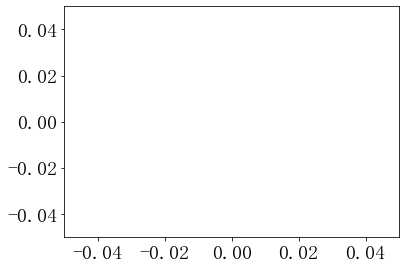

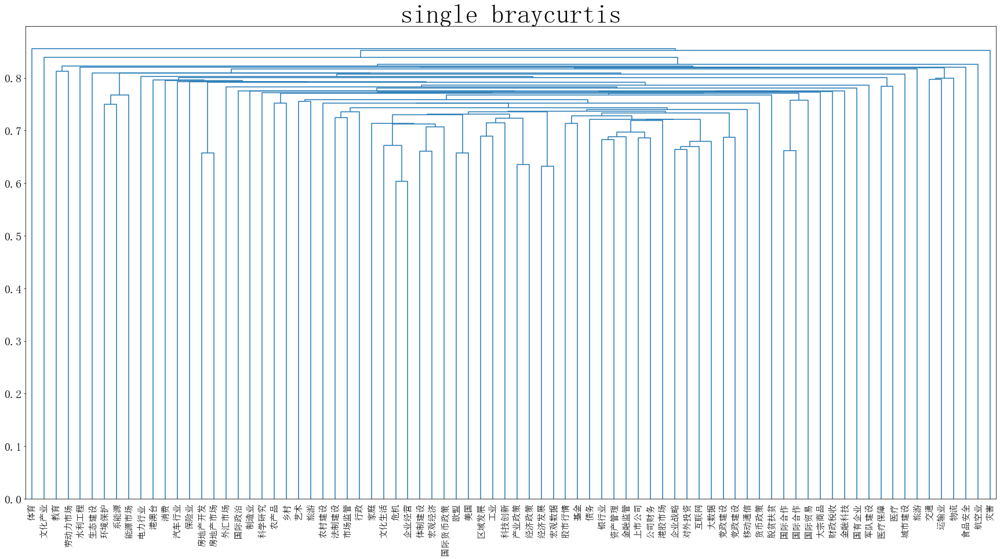

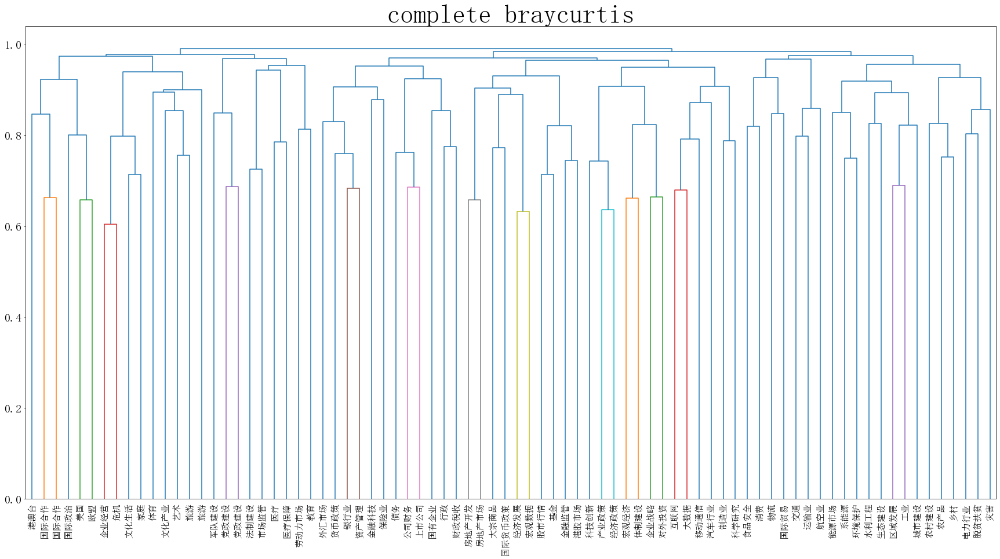

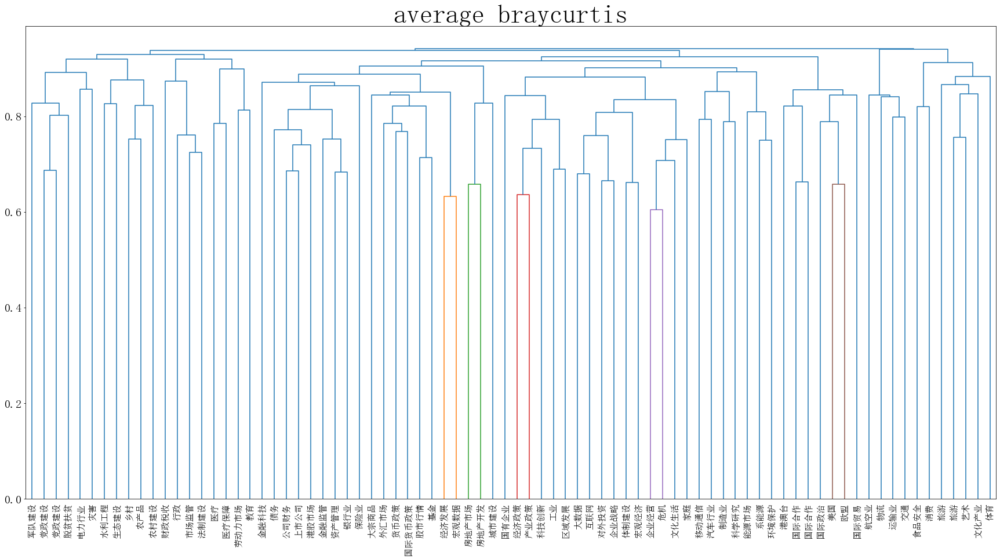

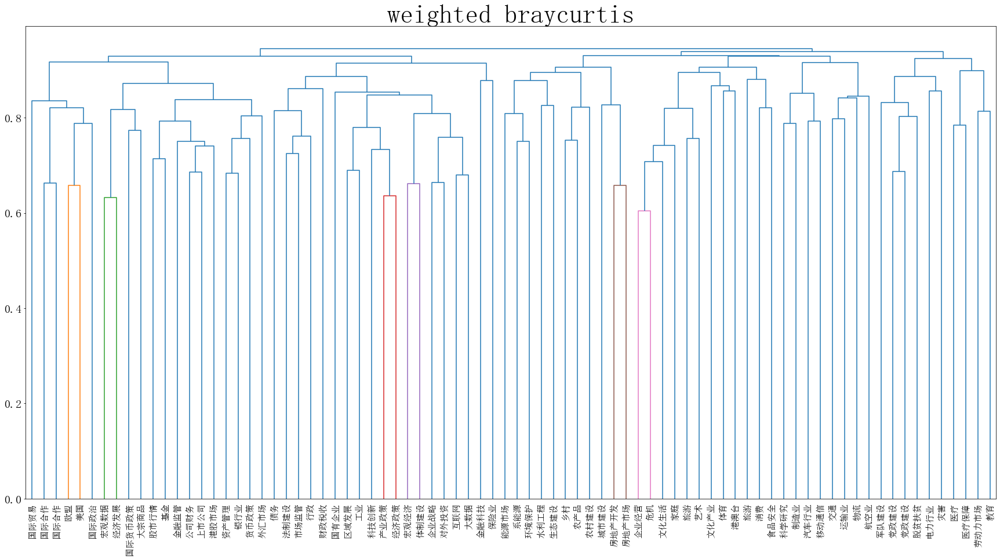

1it [00:23, 23.02s/it]

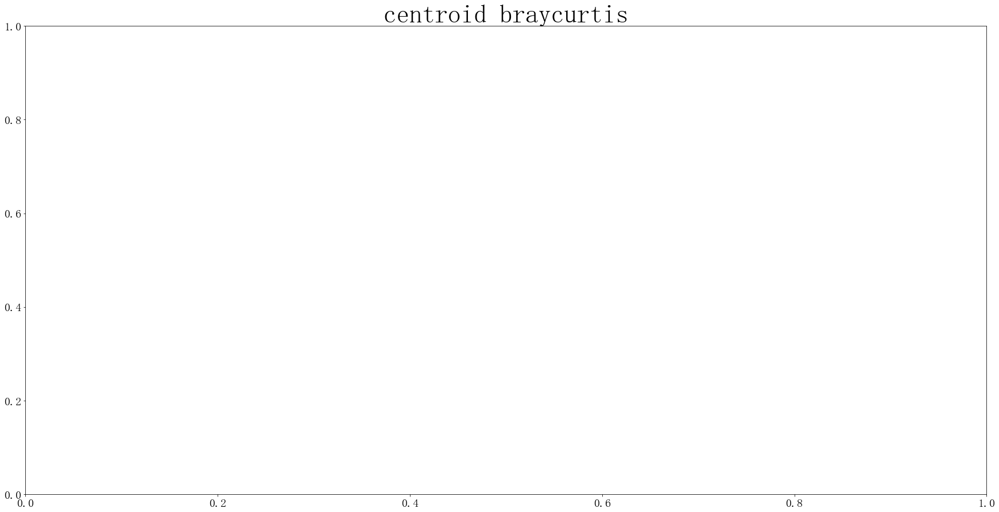

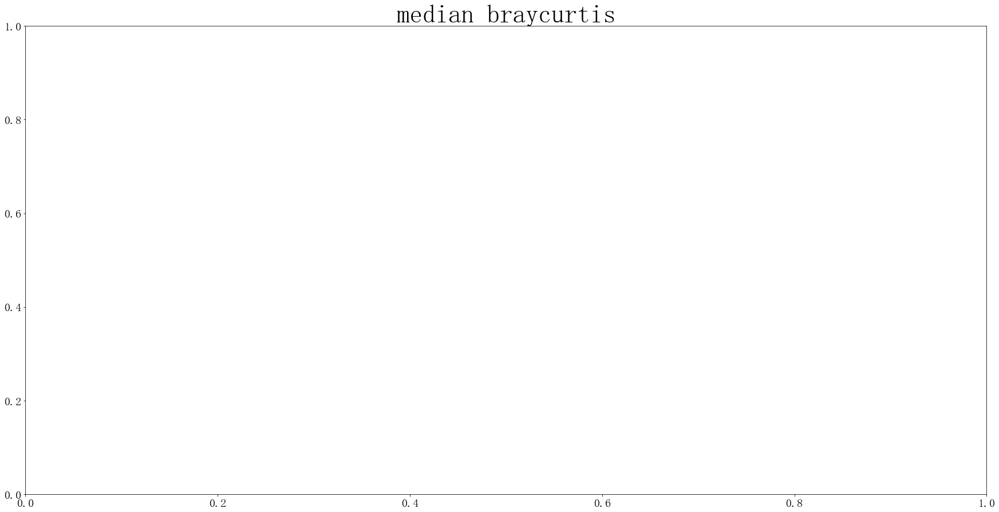

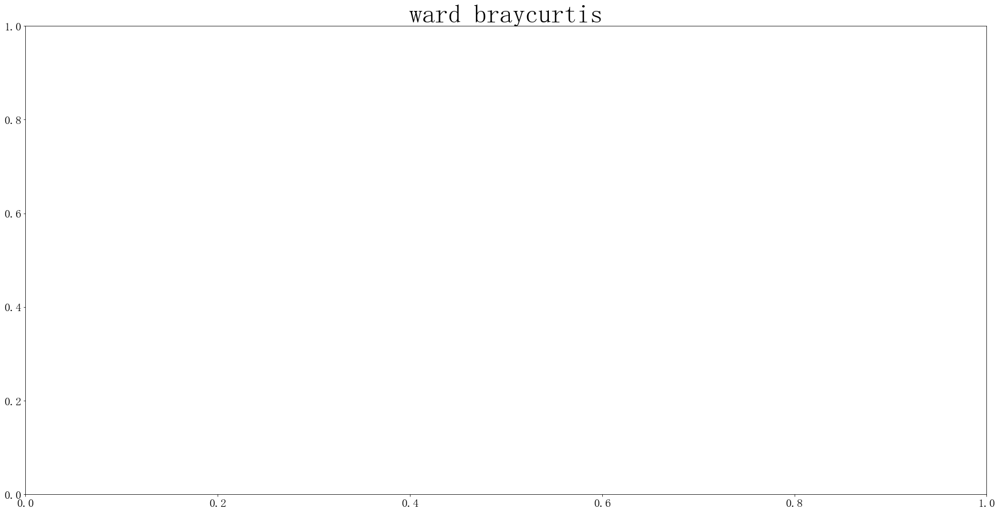

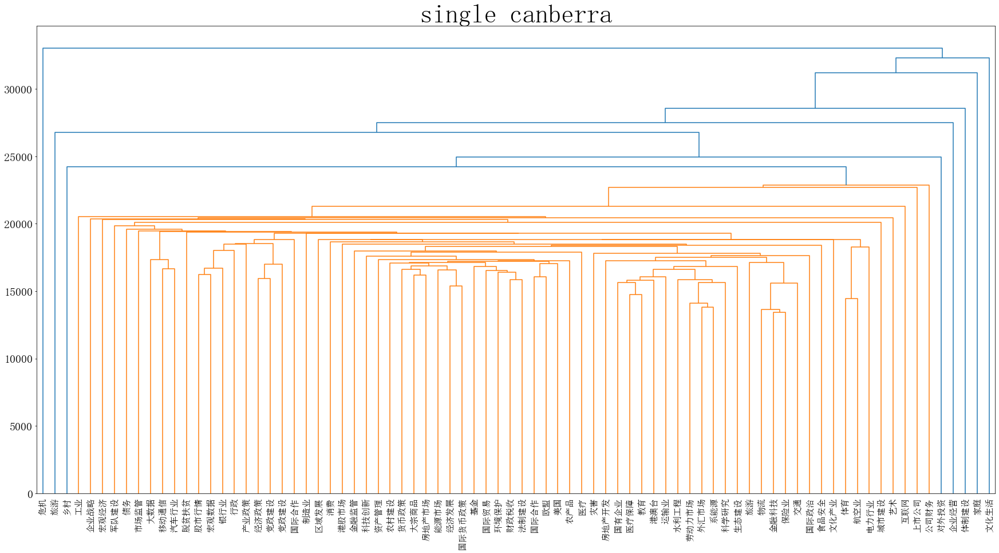

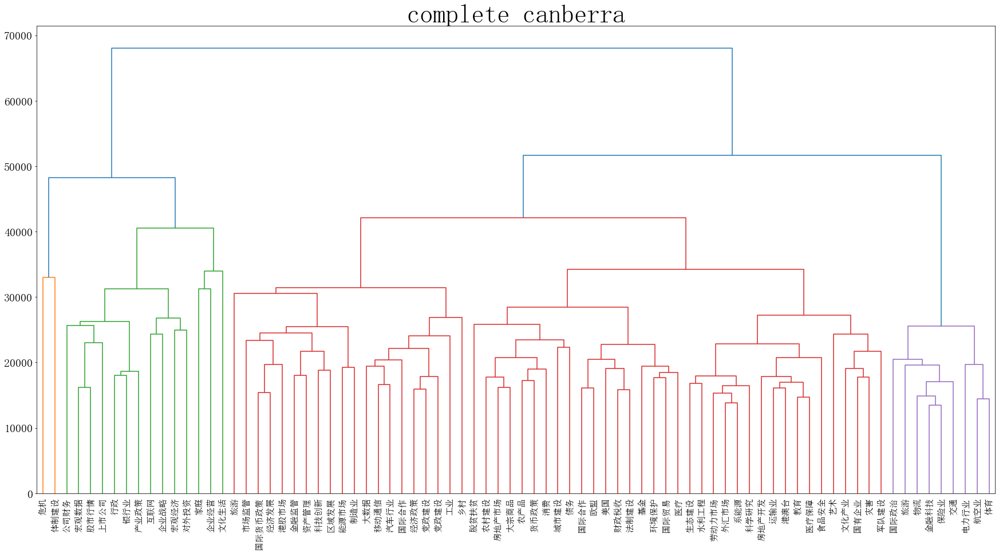

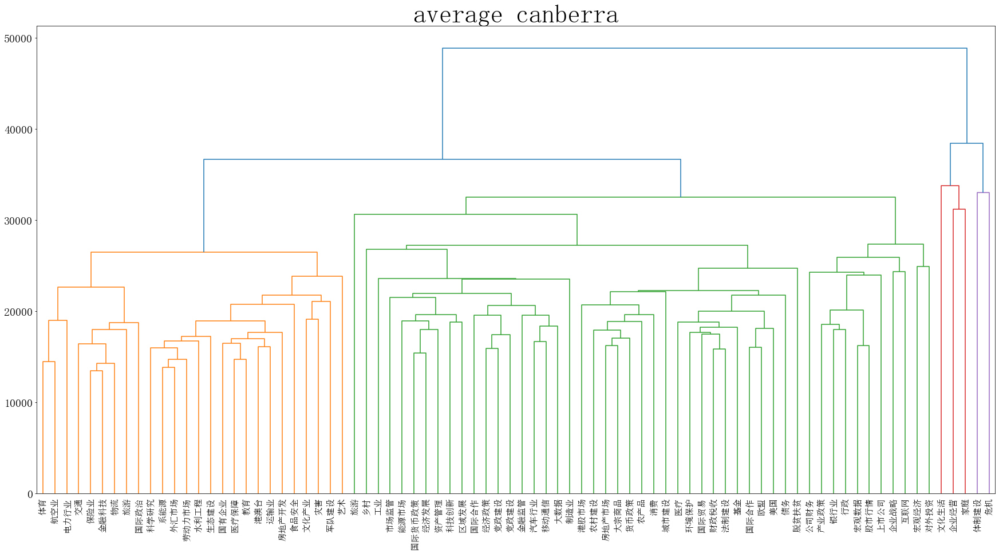

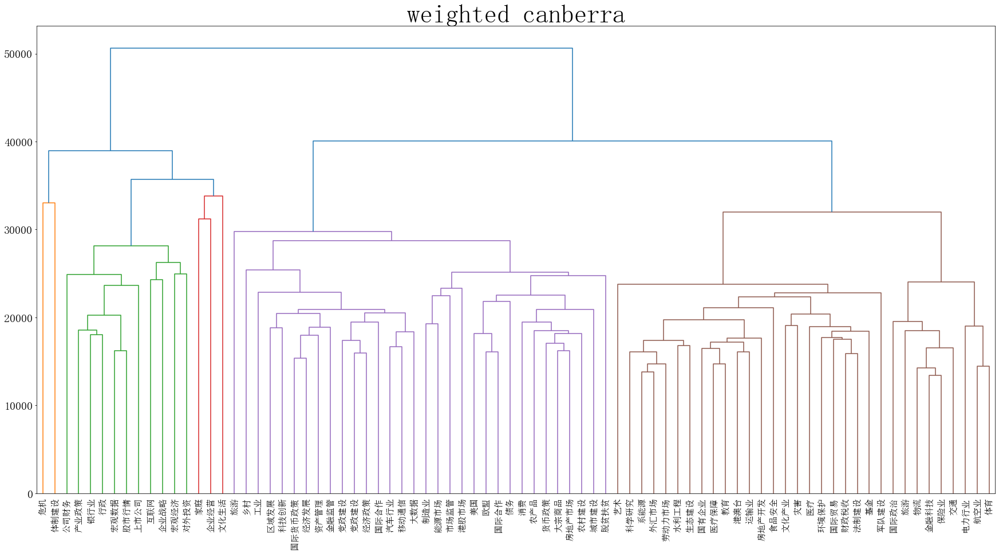

2it [00:50, 25.47s/it]

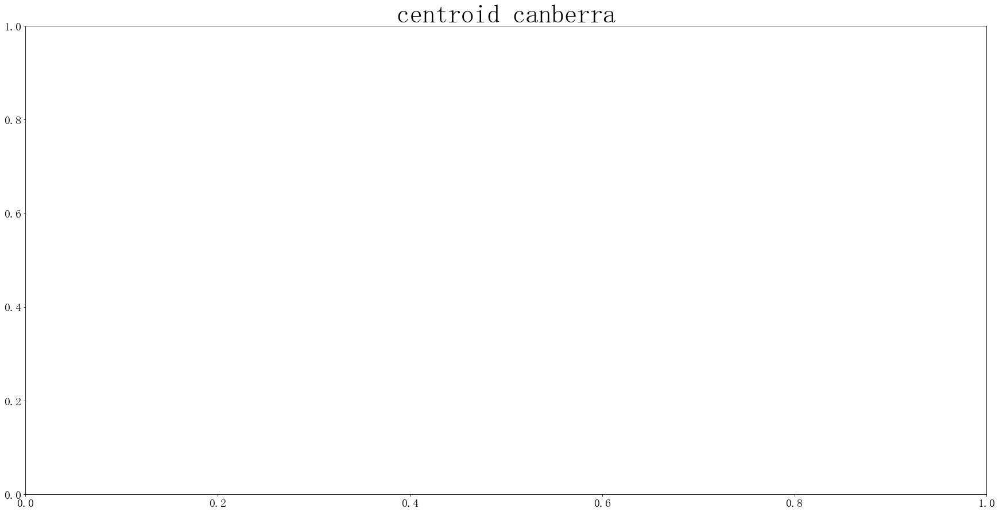

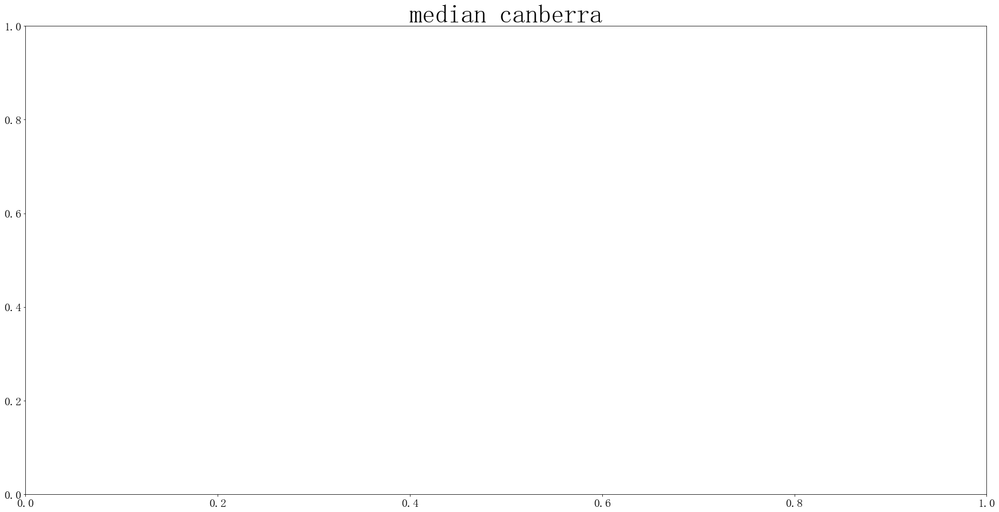

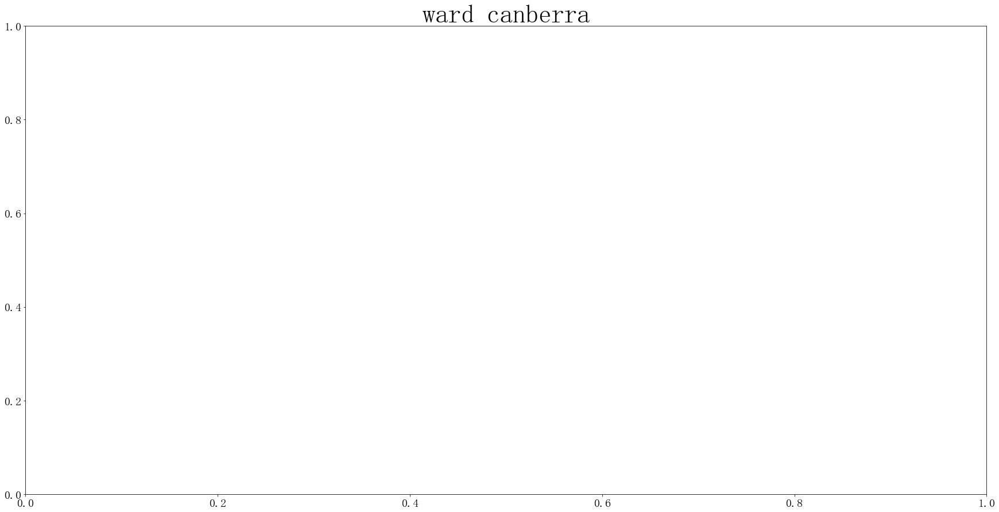

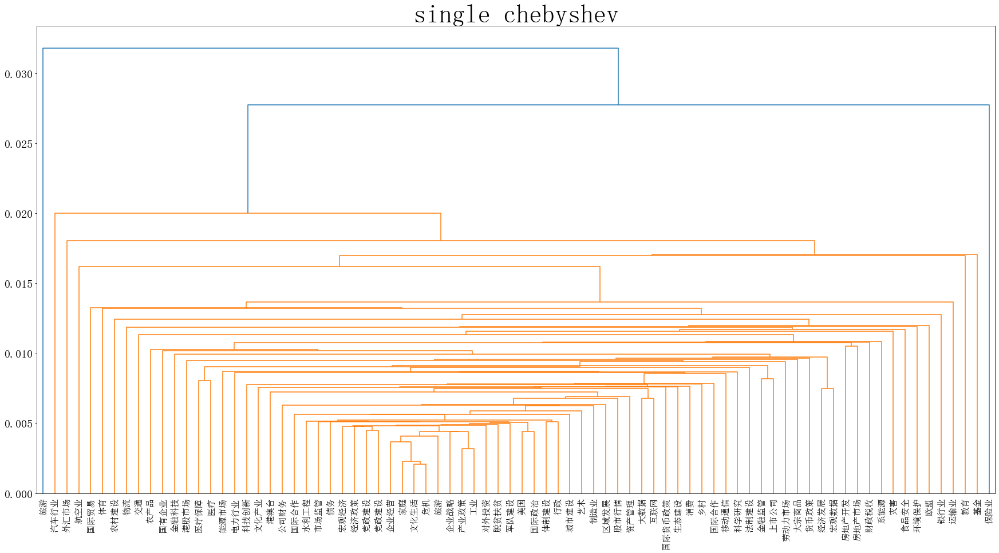

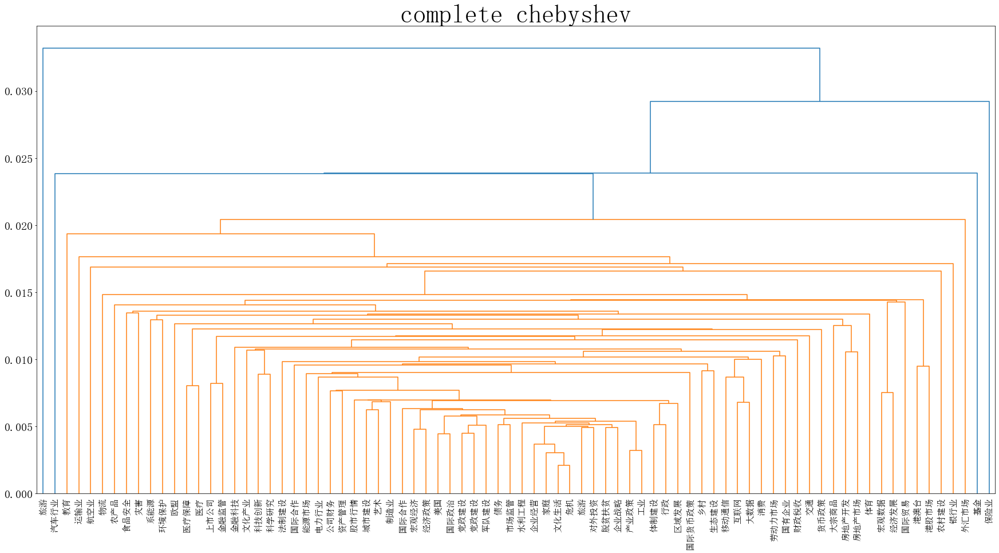

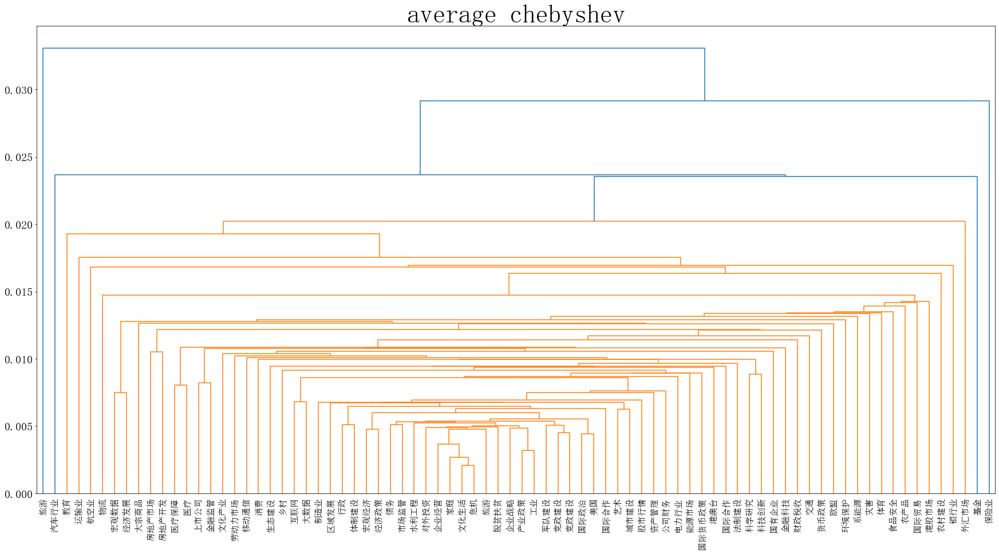

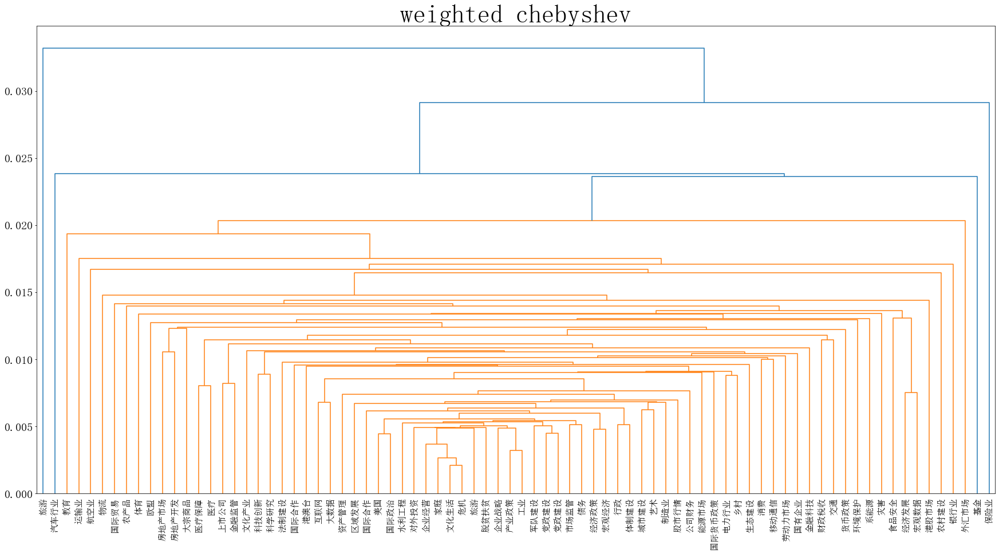

3it [01:13, 24.40s/it]

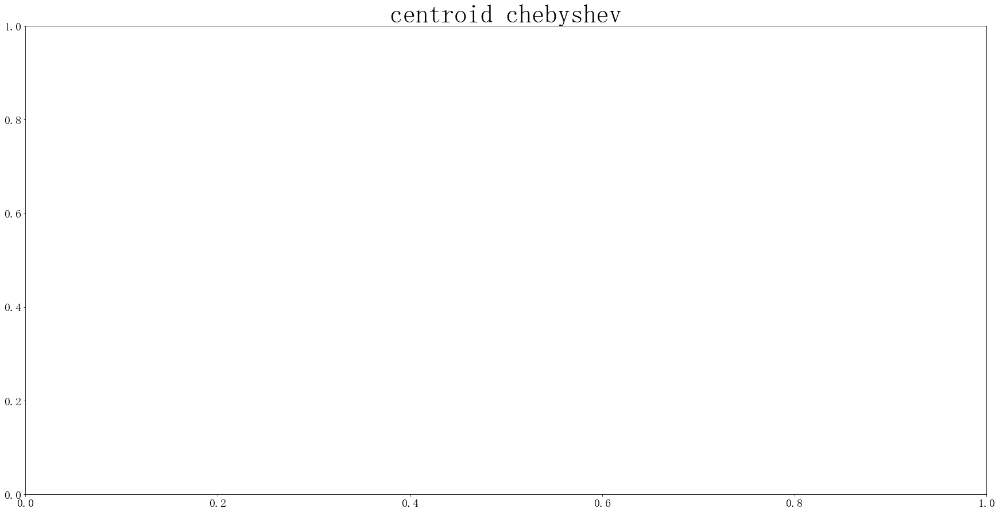

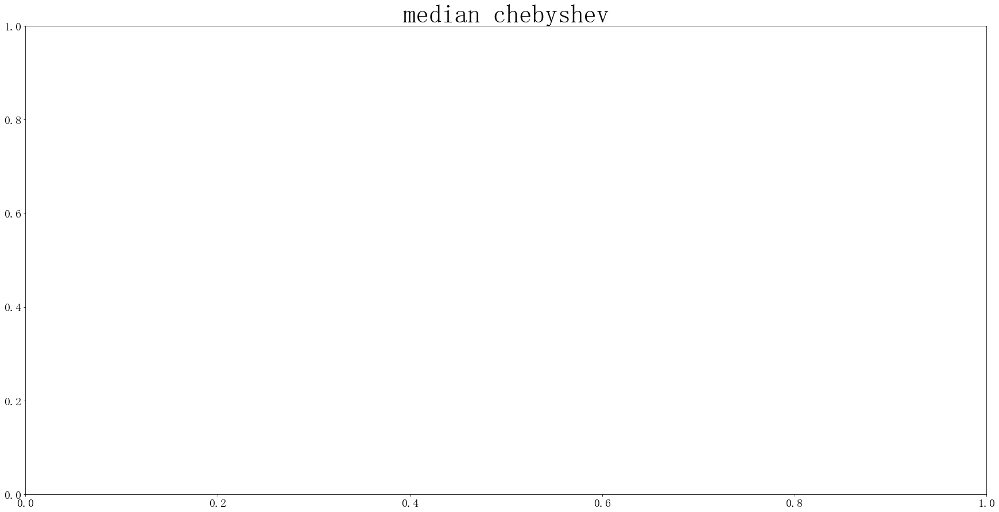

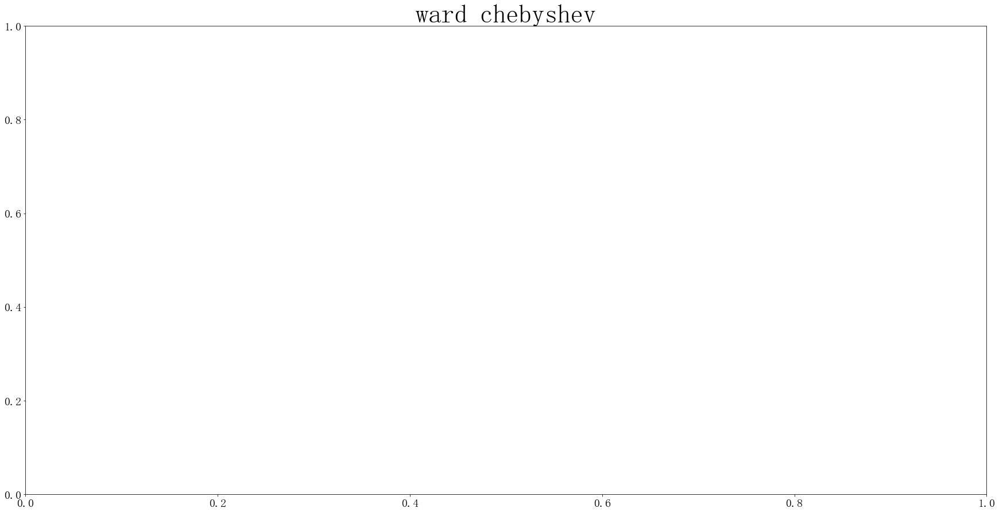

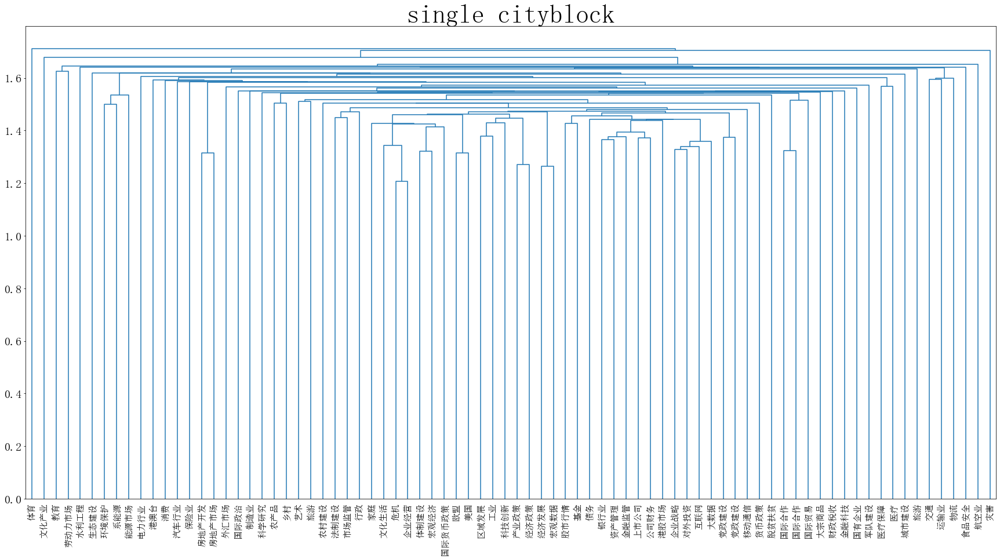

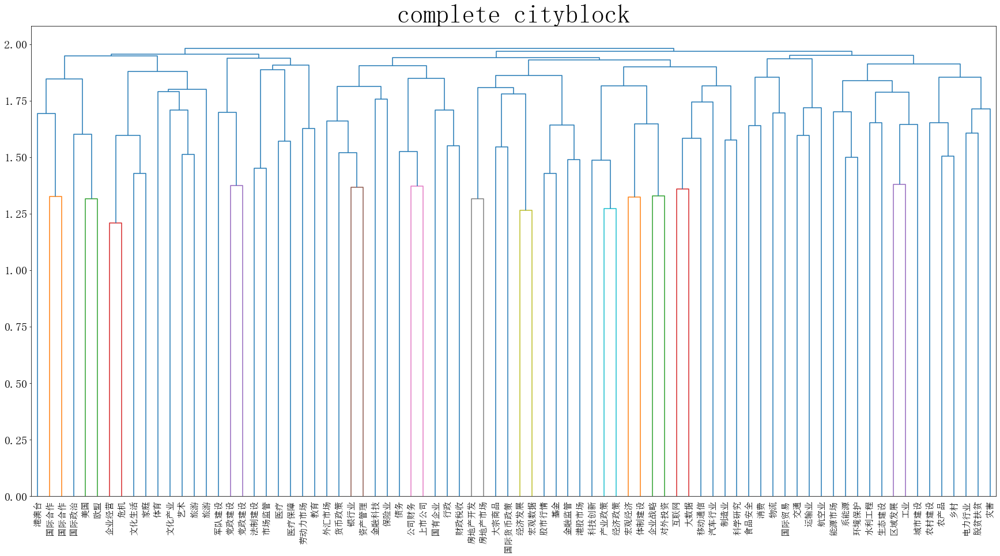

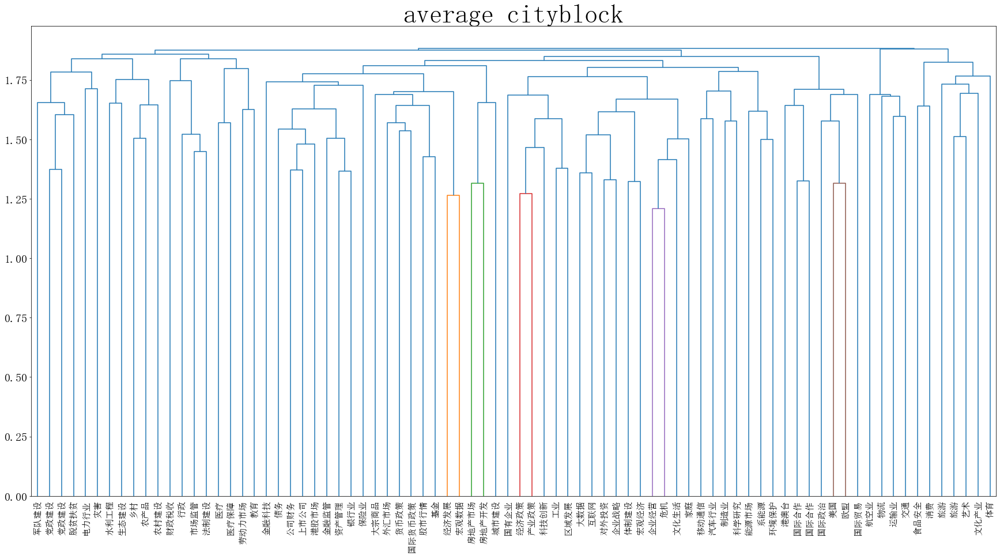

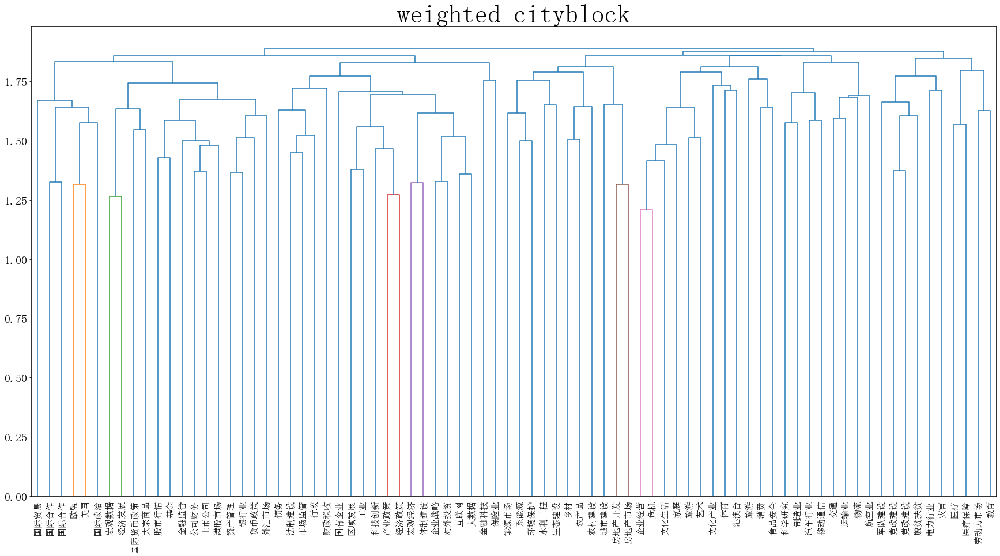

4it [01:36, 23.91s/it]

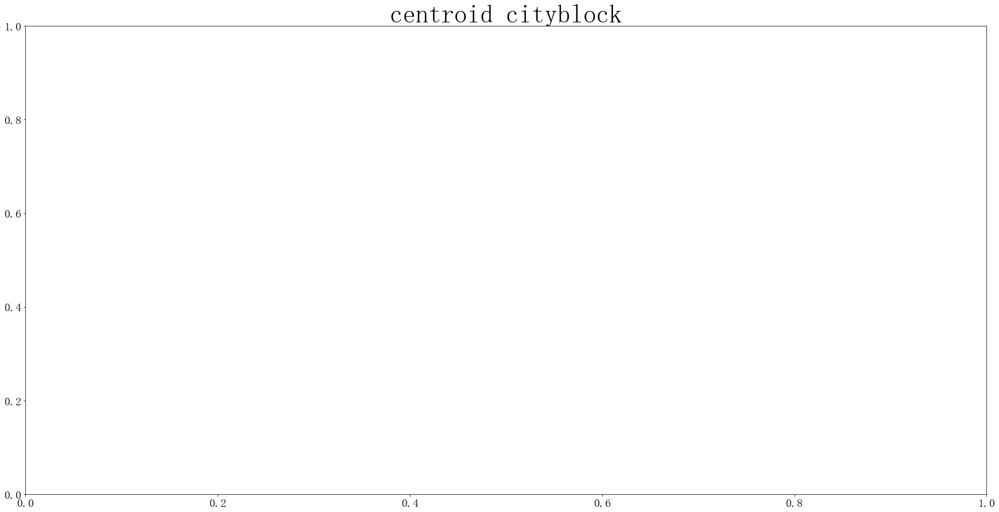

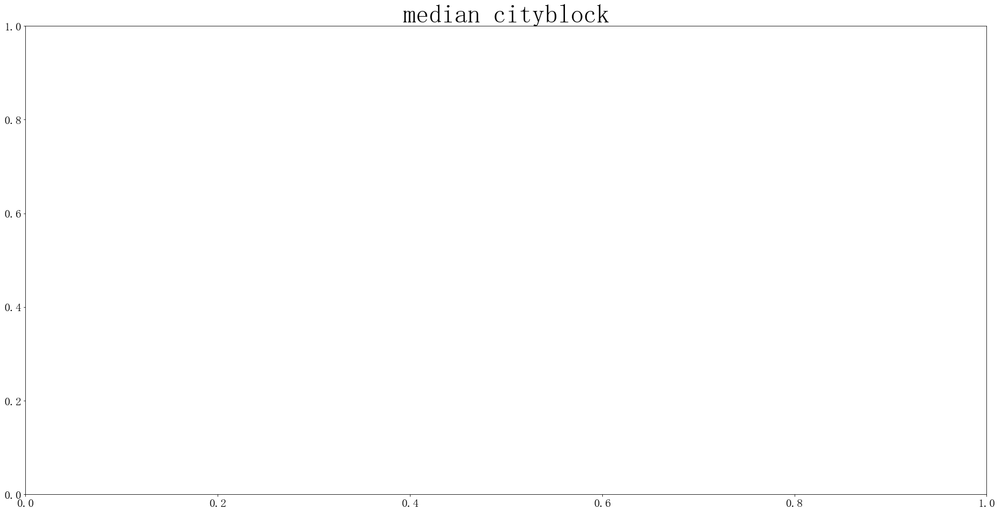

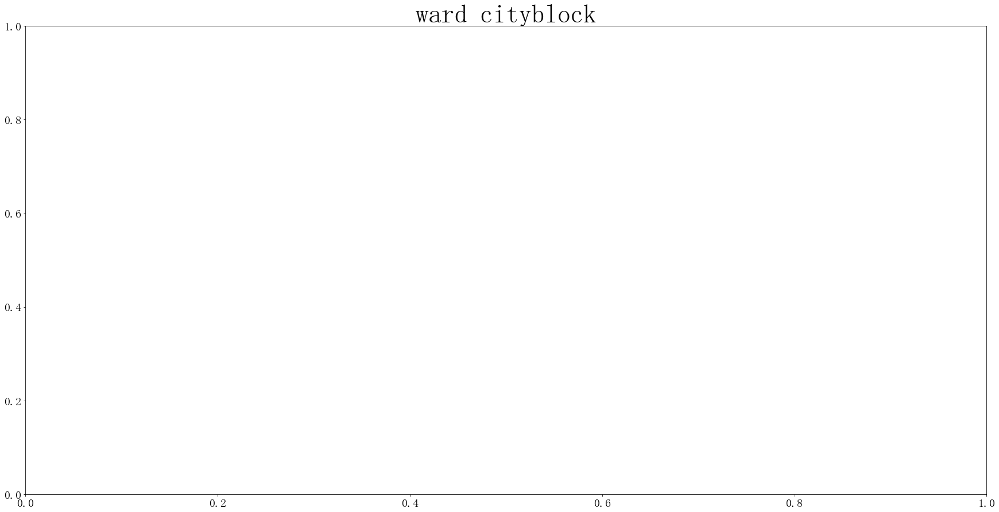

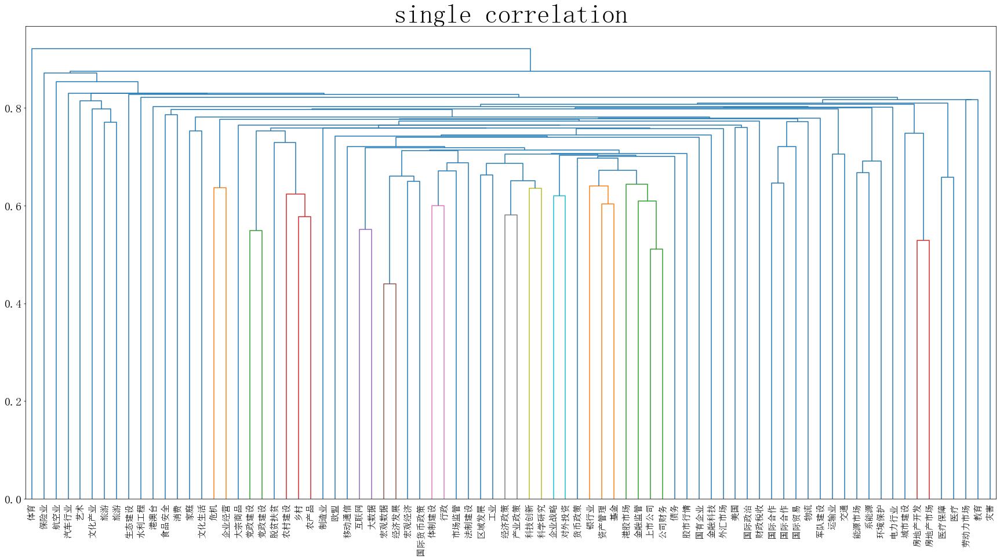

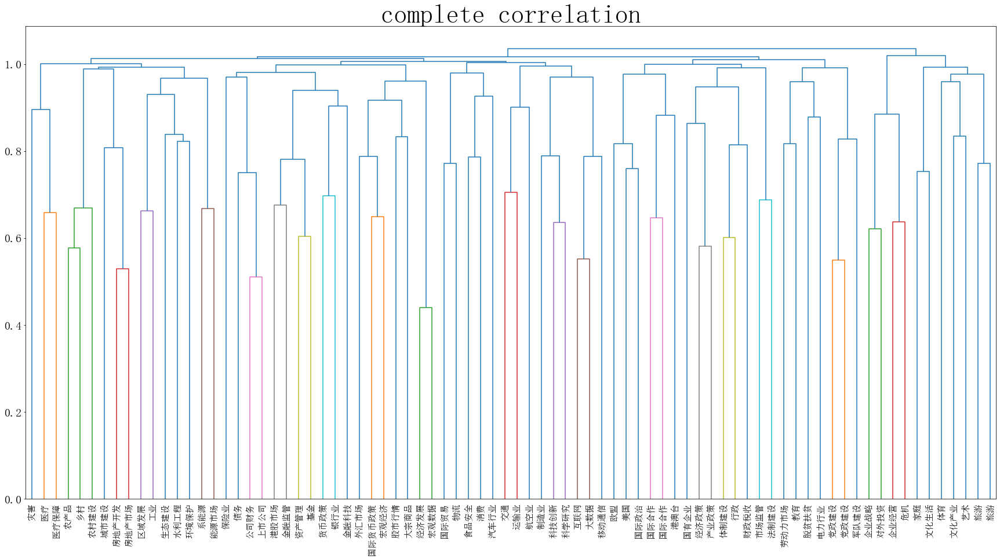

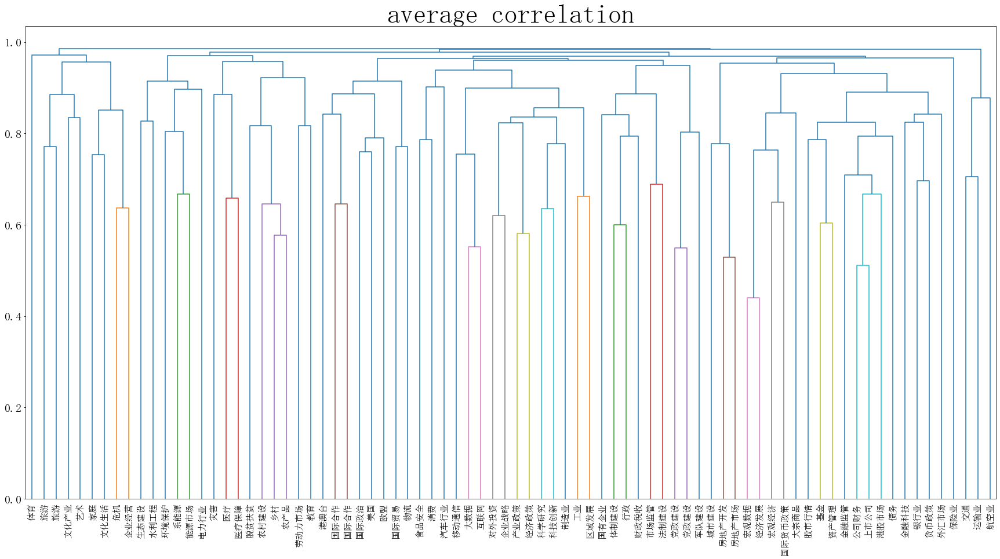

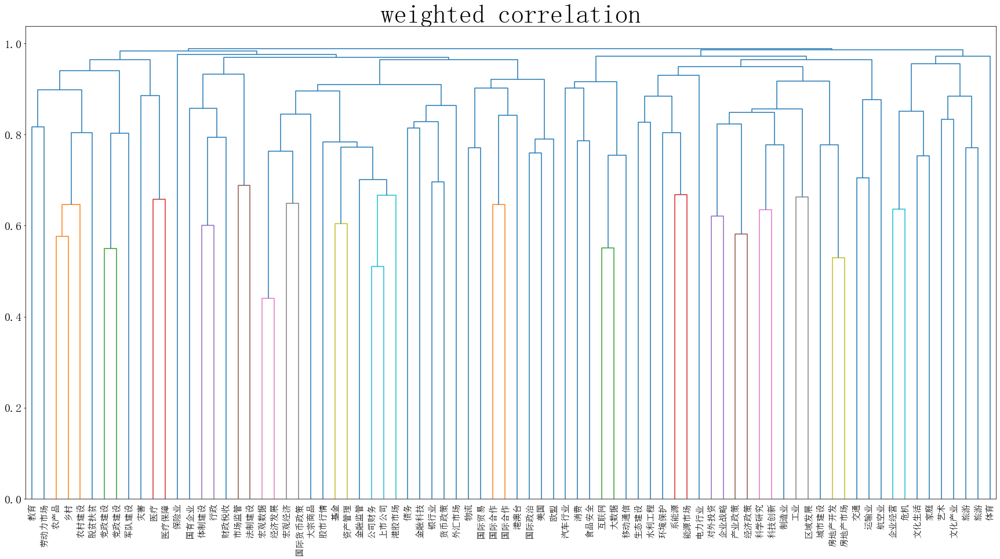

5it [01:59, 23.62s/it]

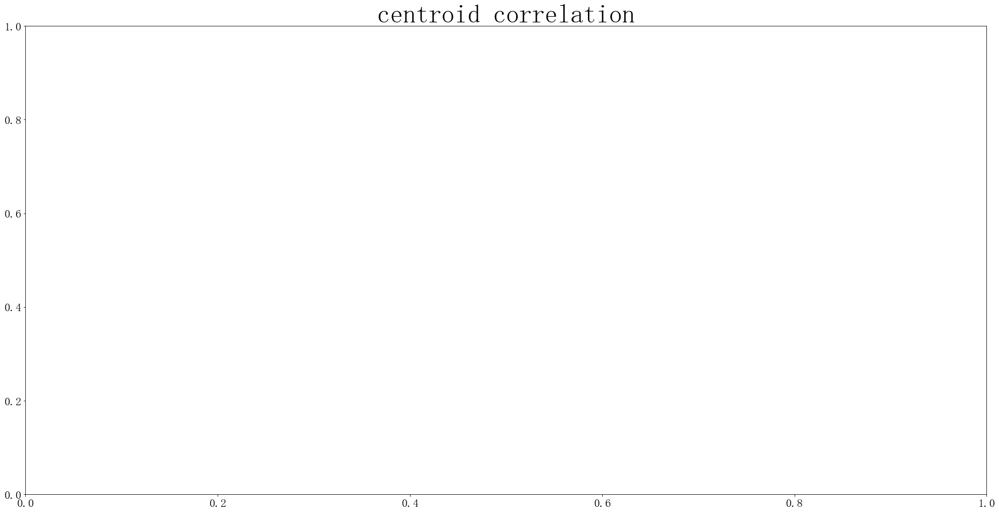

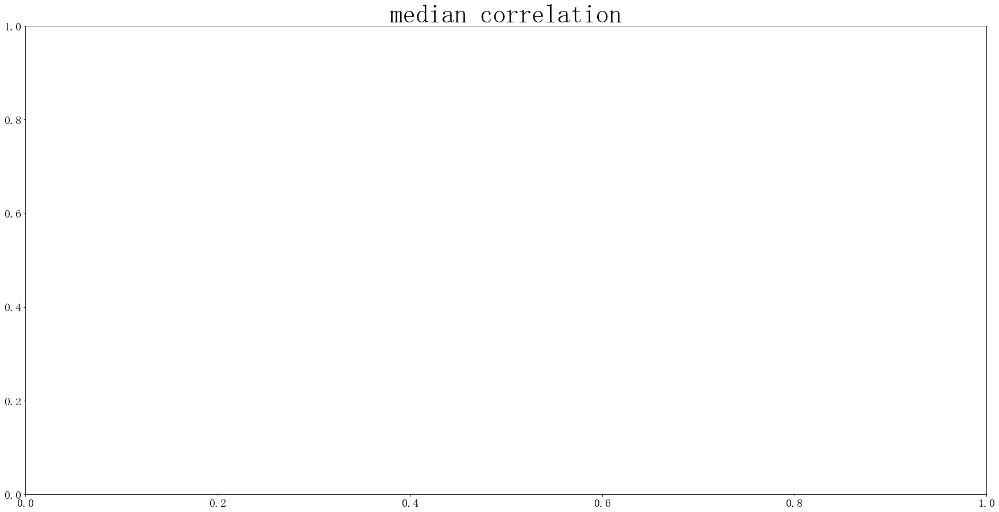

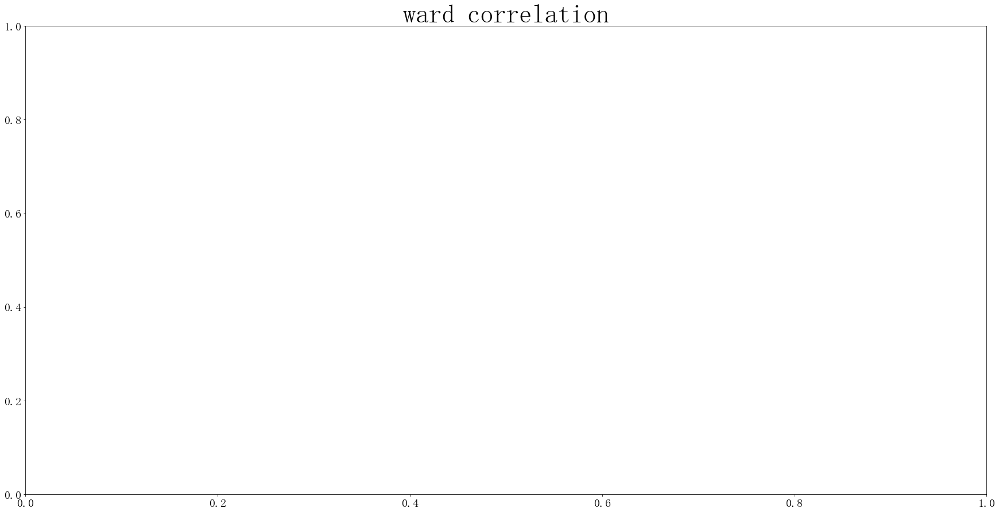

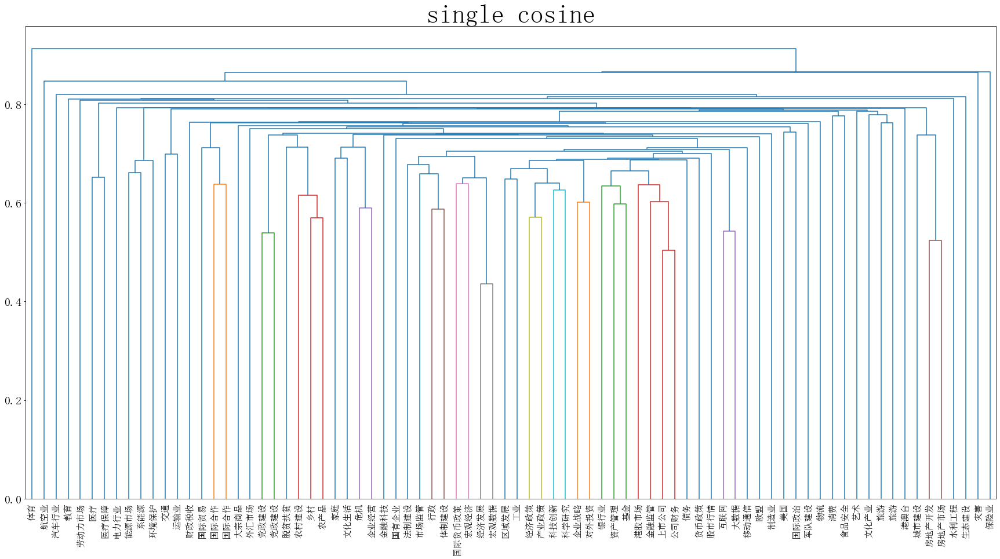

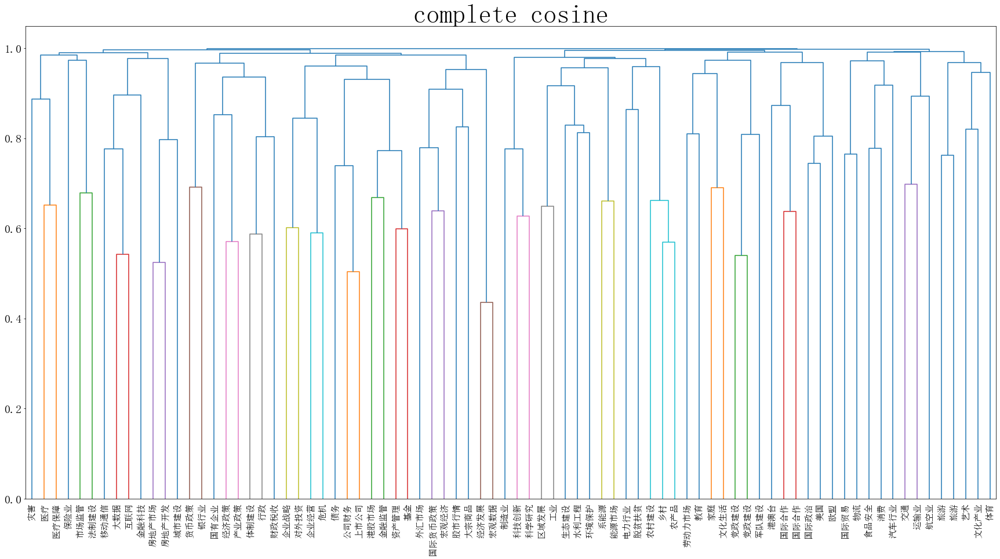

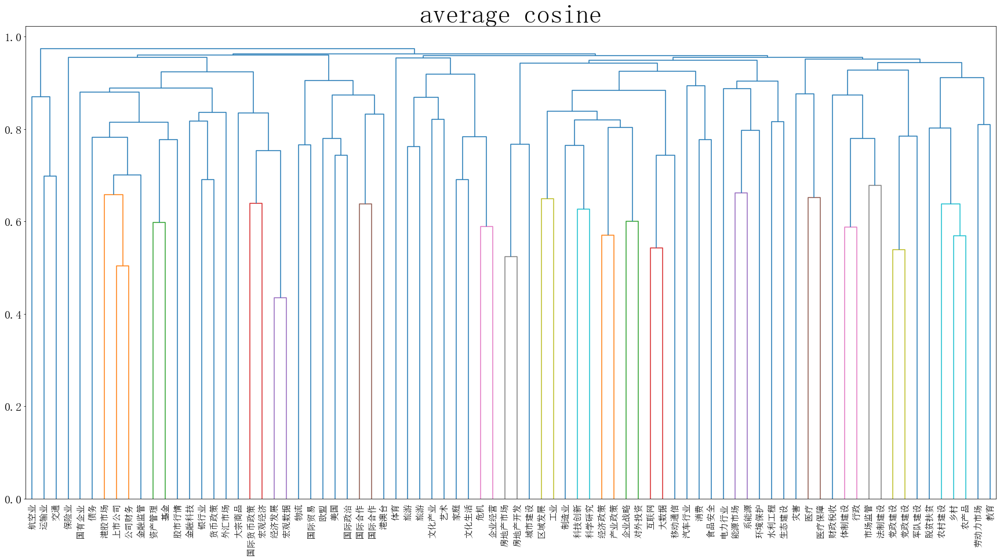

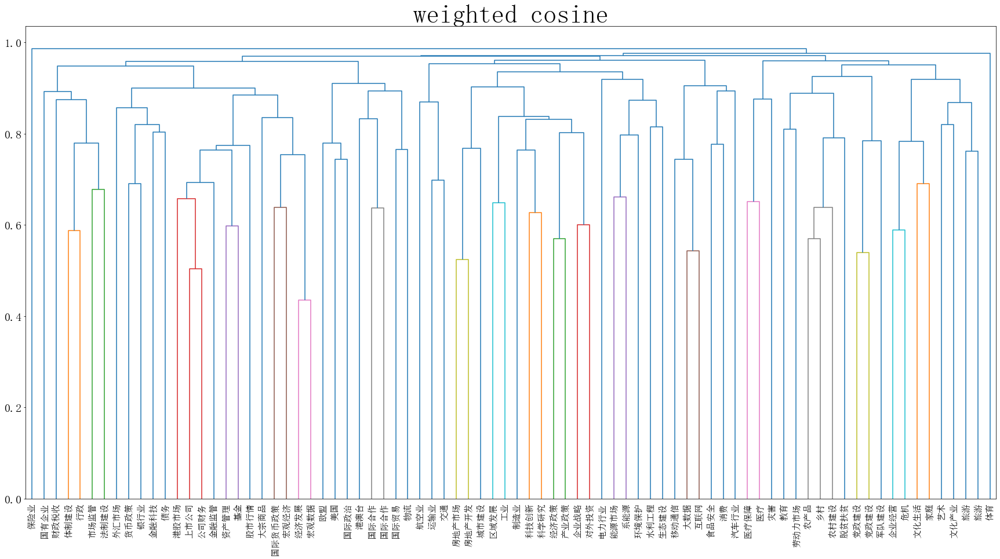

6it [02:22, 23.42s/it]C:\ProgramData\Anaconda3\lib\site-packages\scipy\cluster\hierarchy.py:2841: UserWarning: Attempting to set identical bottom == top == 0 results in singular transformations; automatically expanding.
  ax.set_ylim([0, dvw])


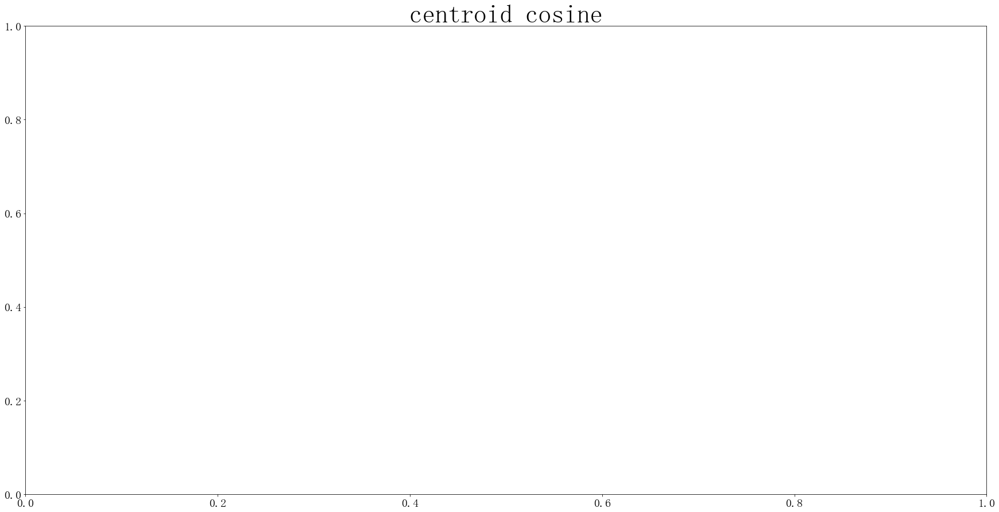

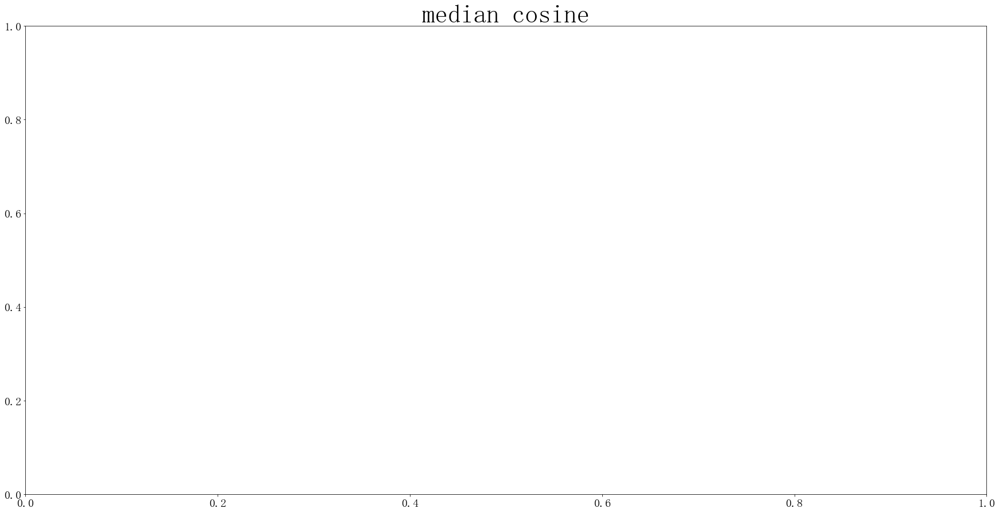

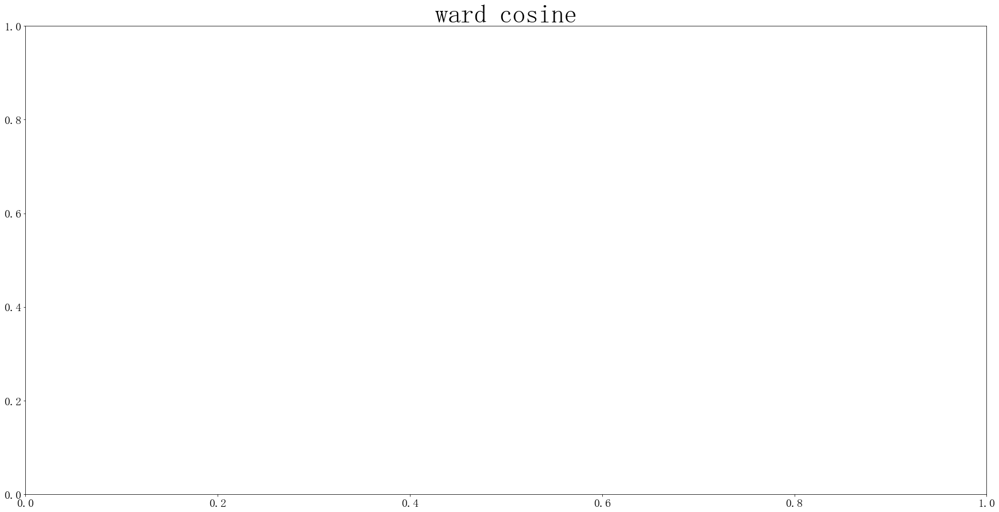

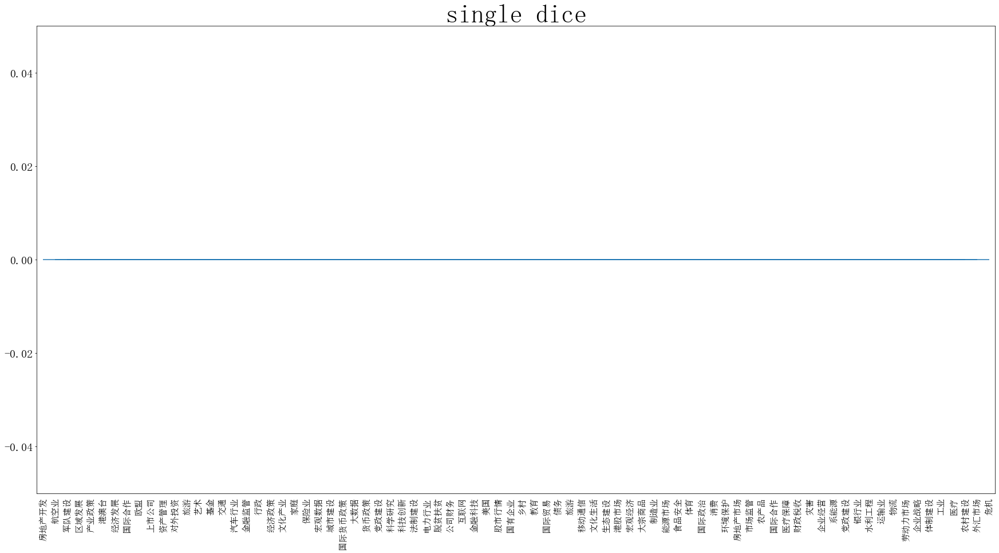

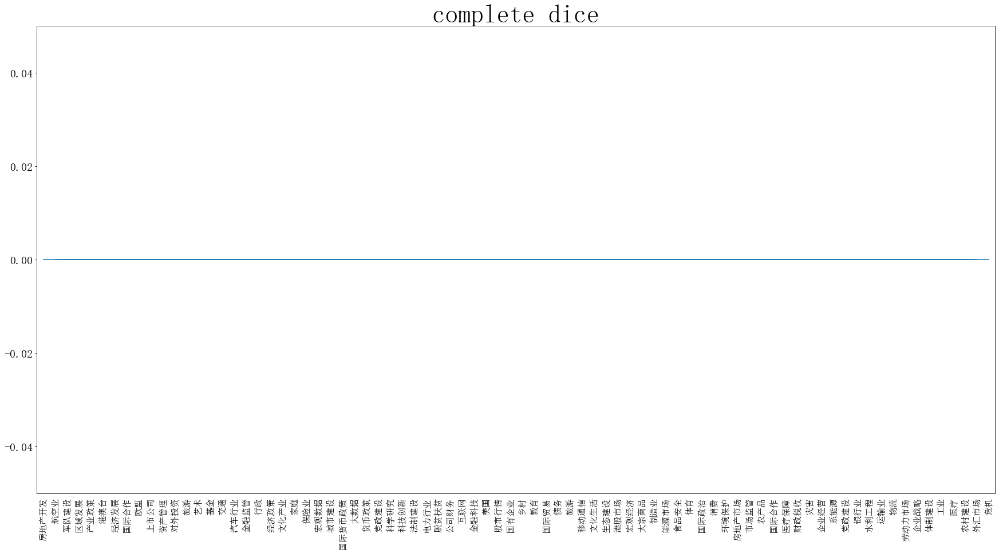

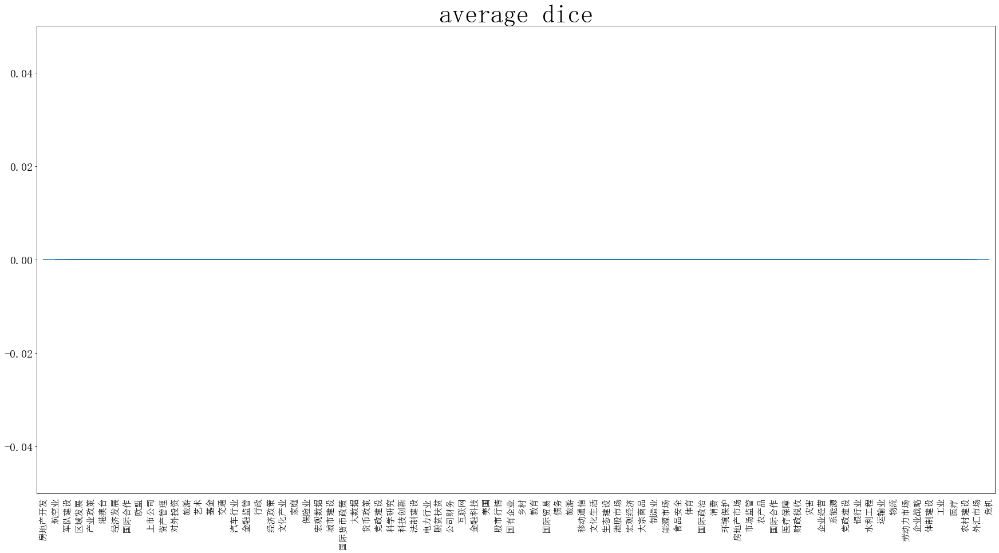

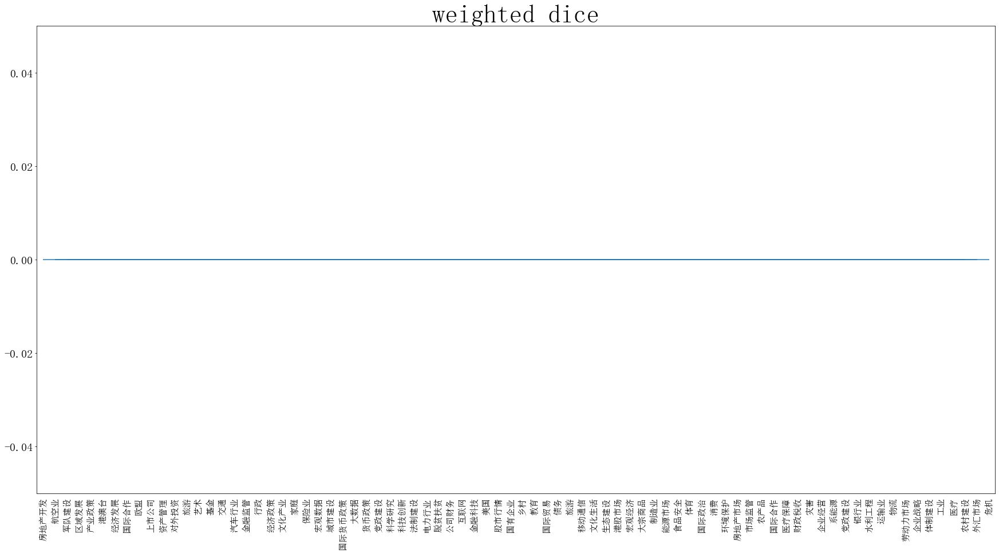

7it [02:46, 23.47s/it]

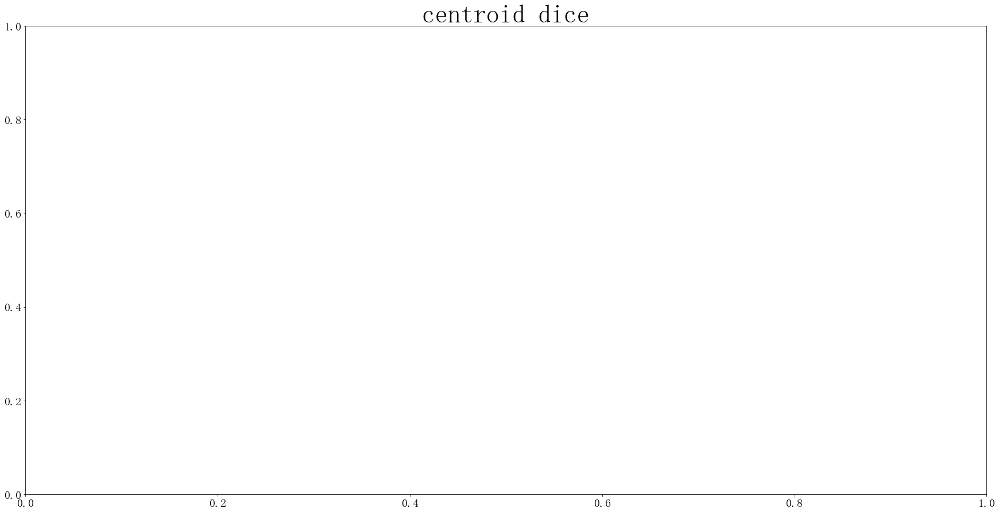

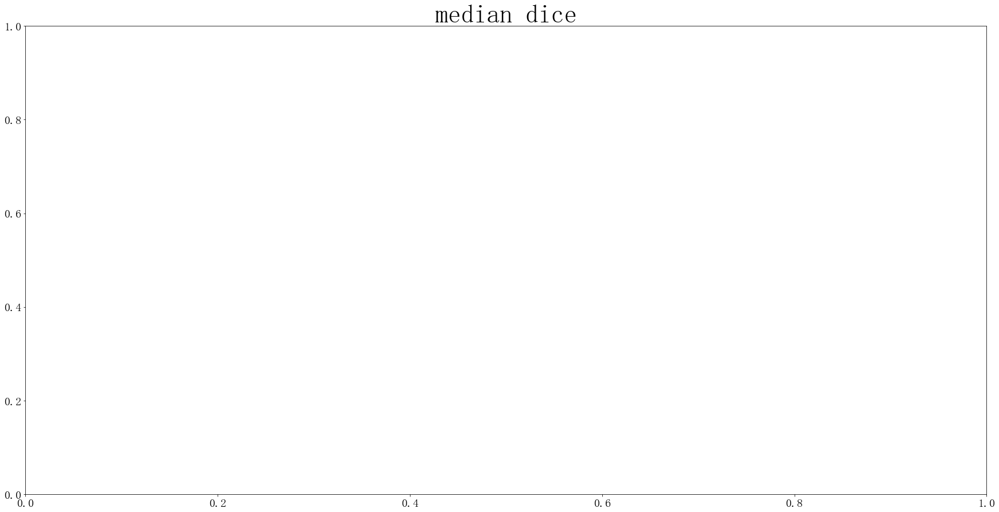

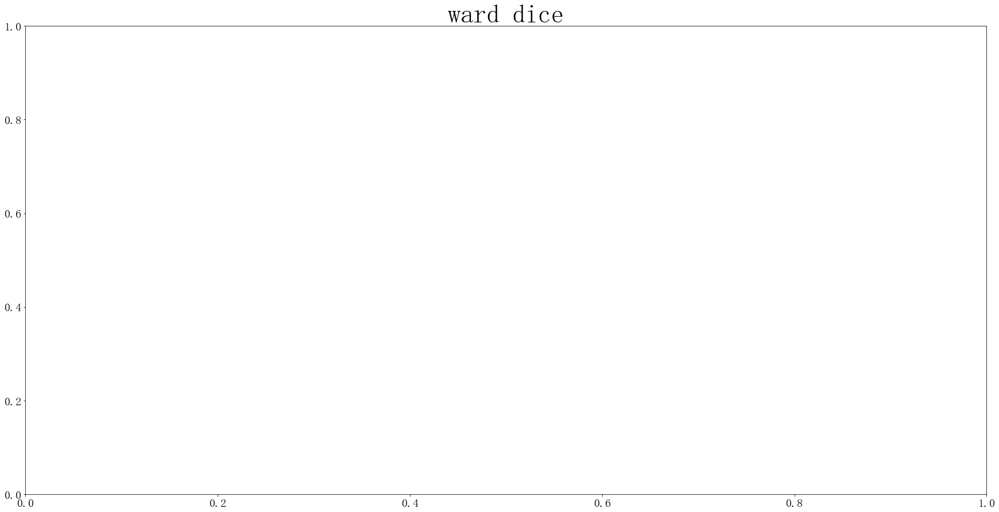

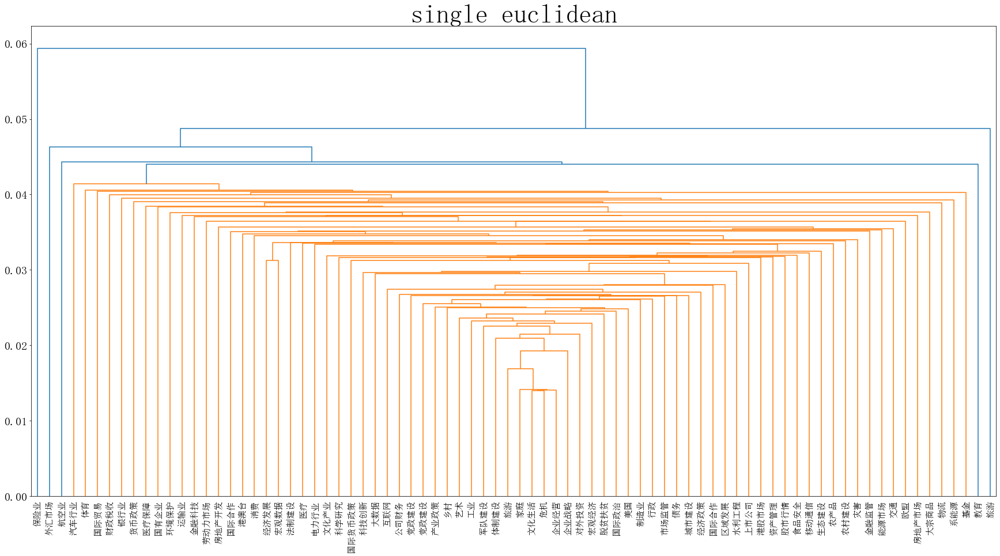

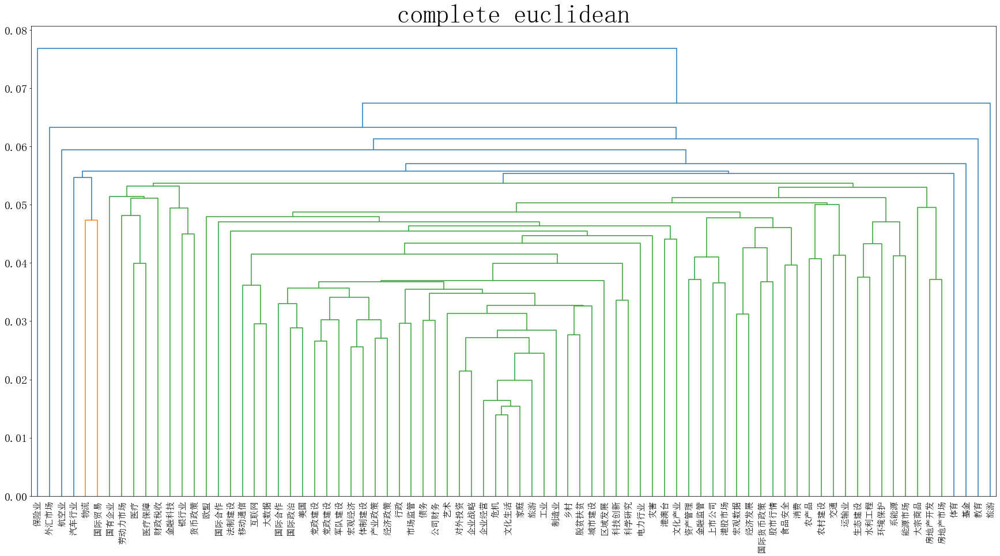

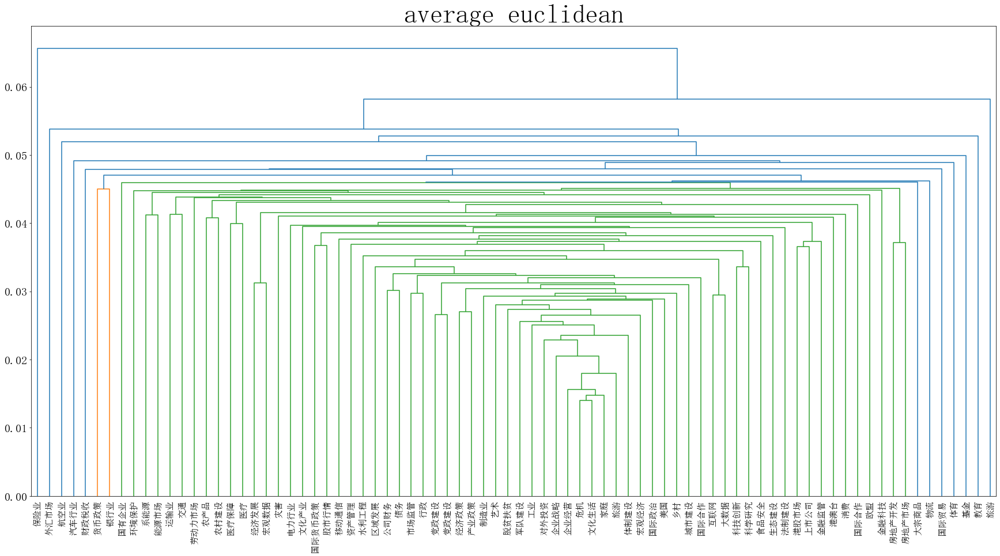

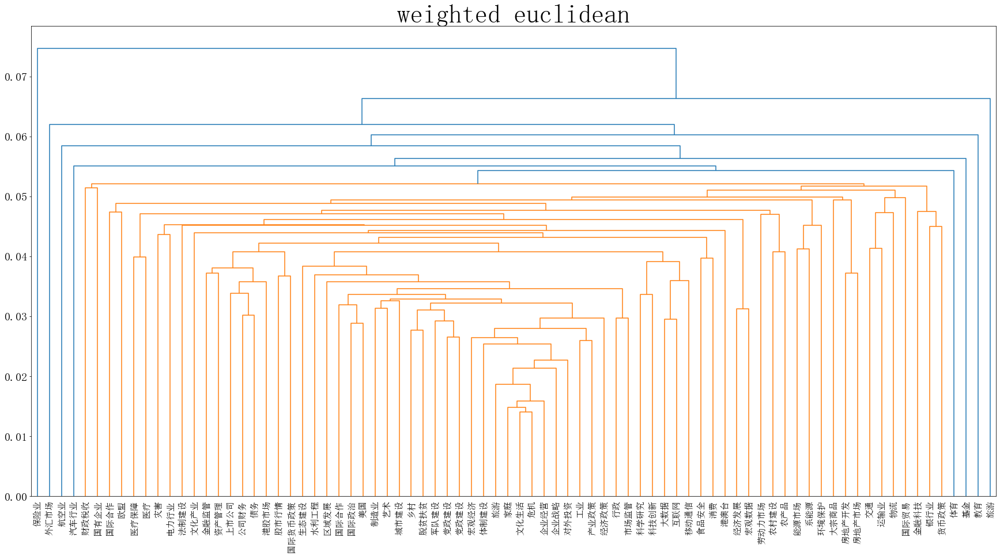

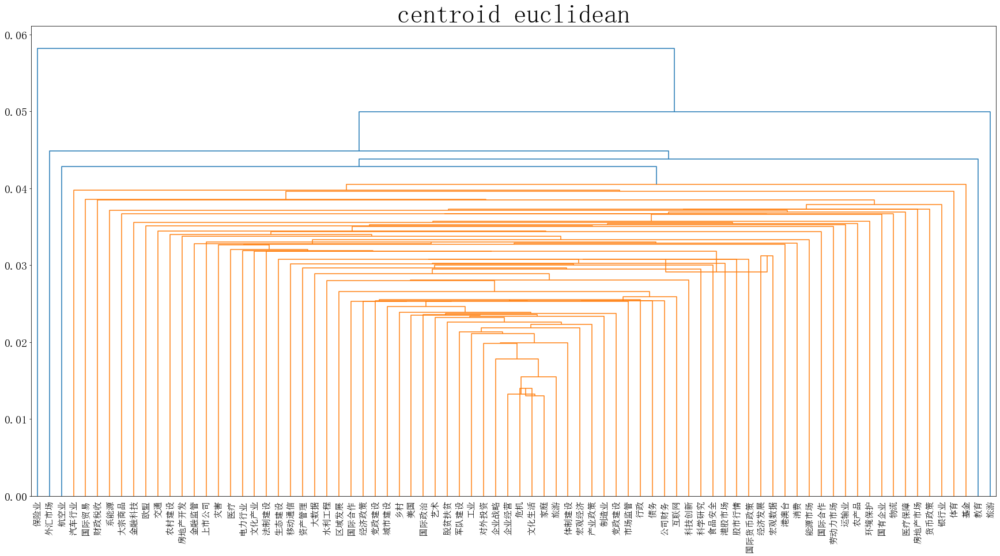

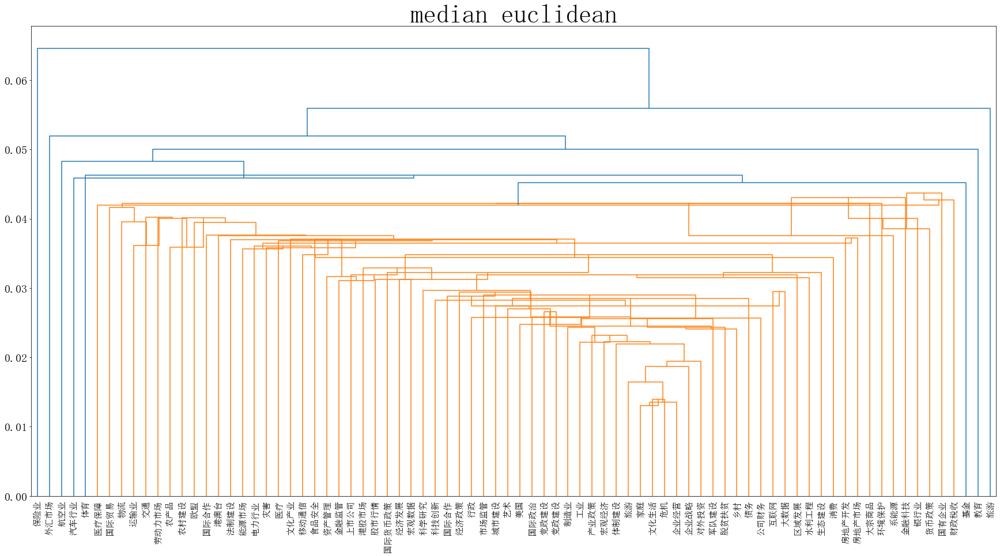

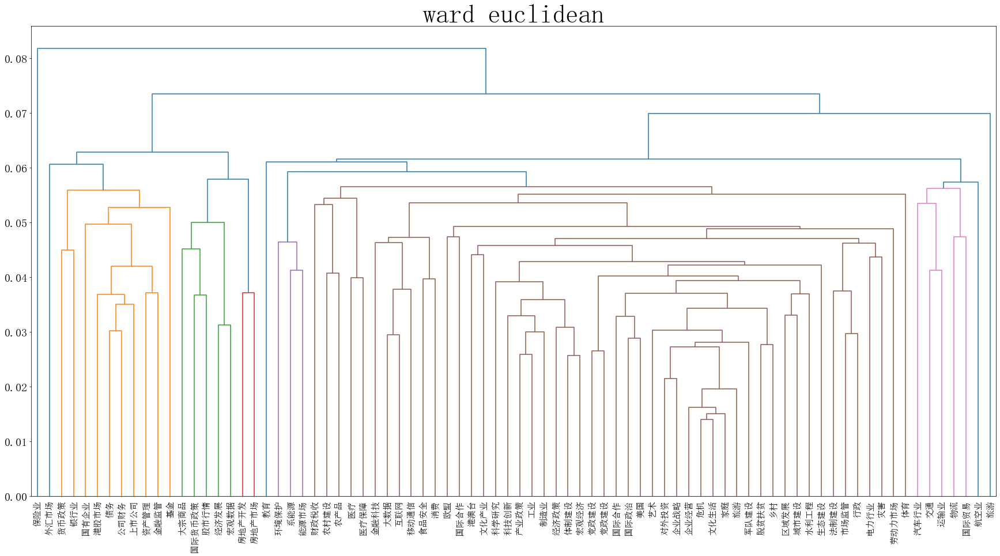

8it [03:25, 28.55s/it]

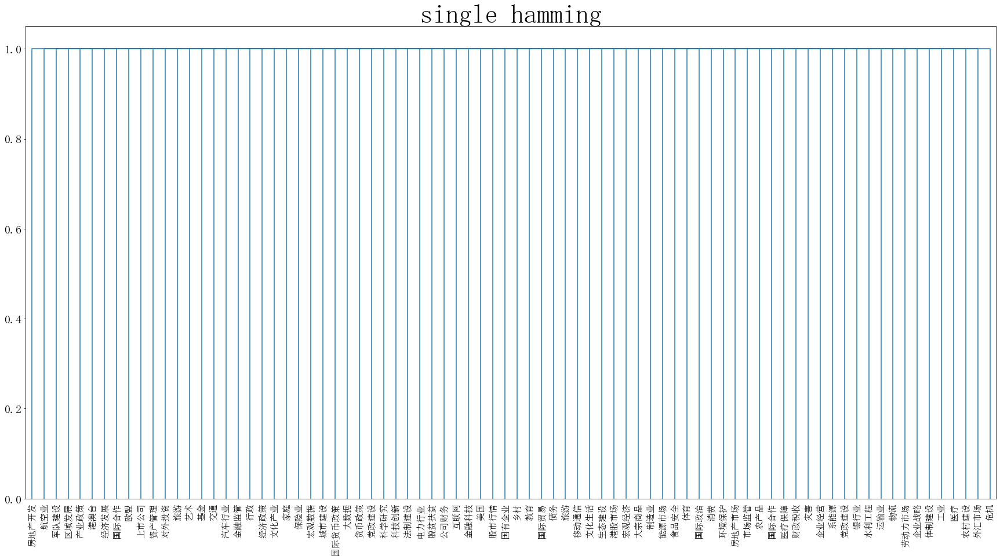

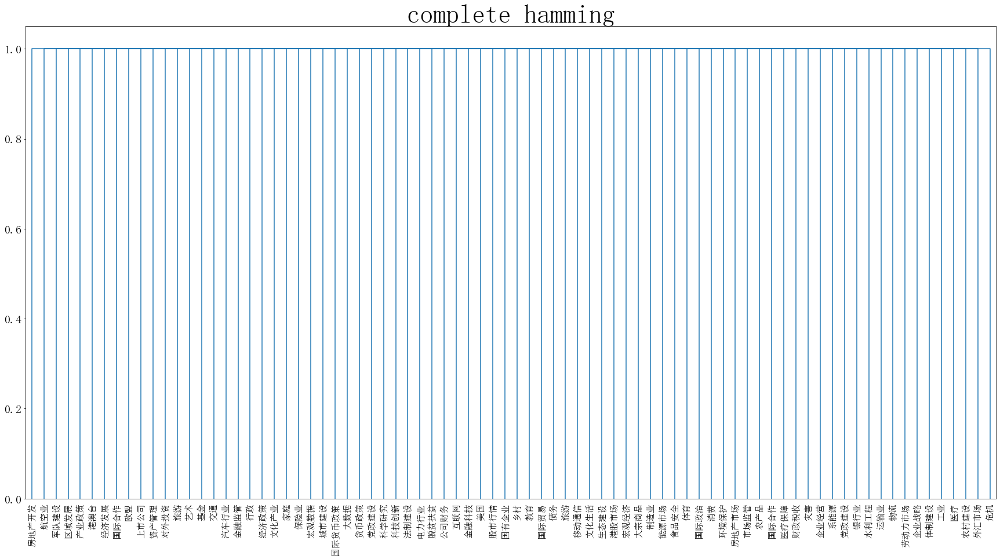

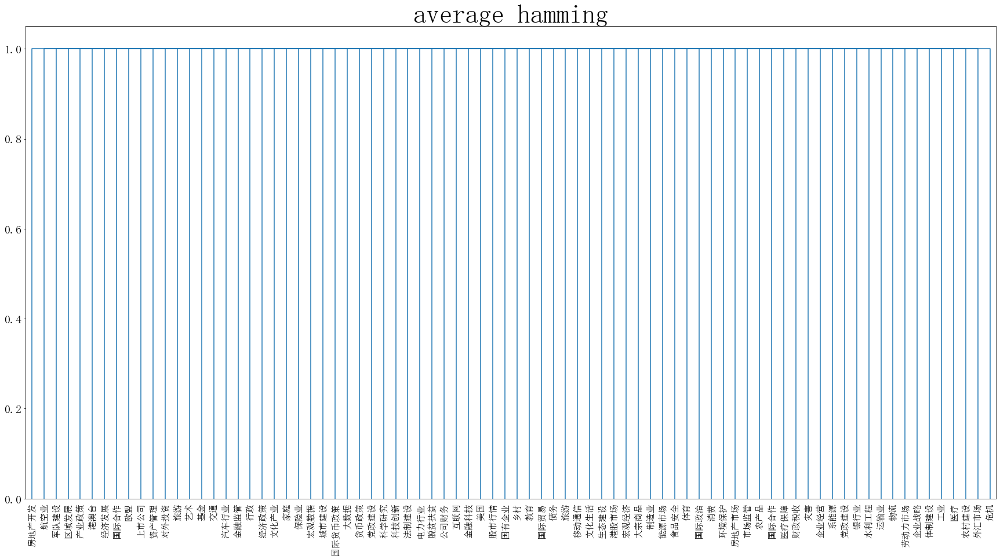

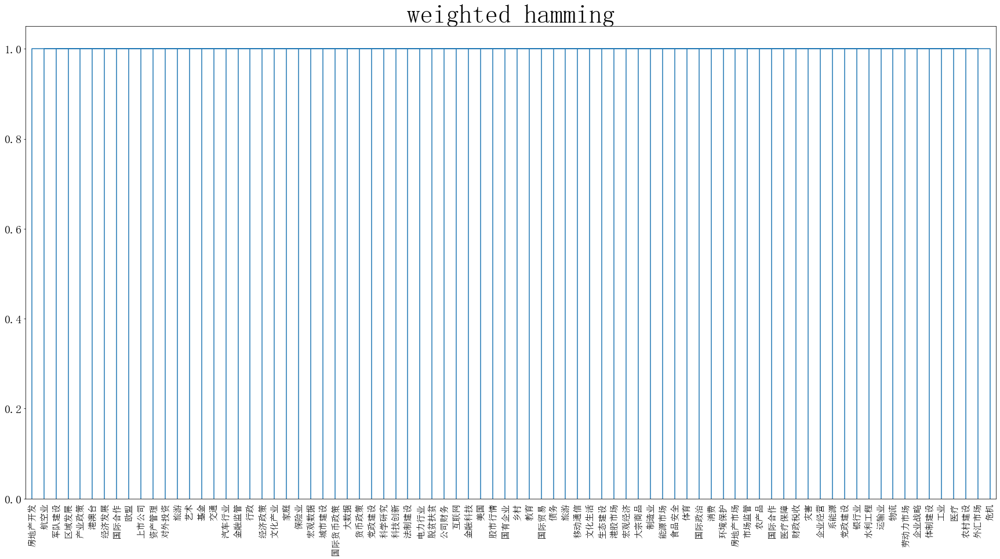

9it [03:48, 26.74s/it]

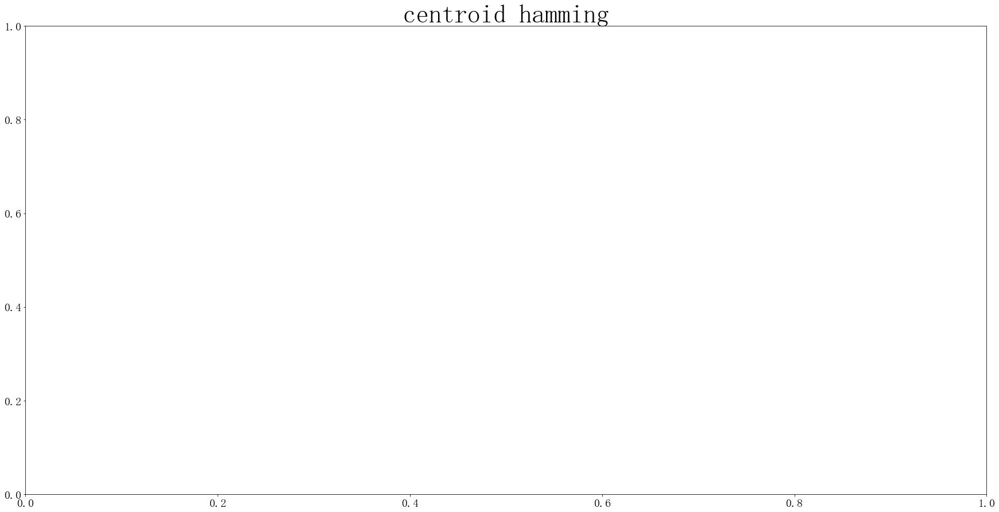

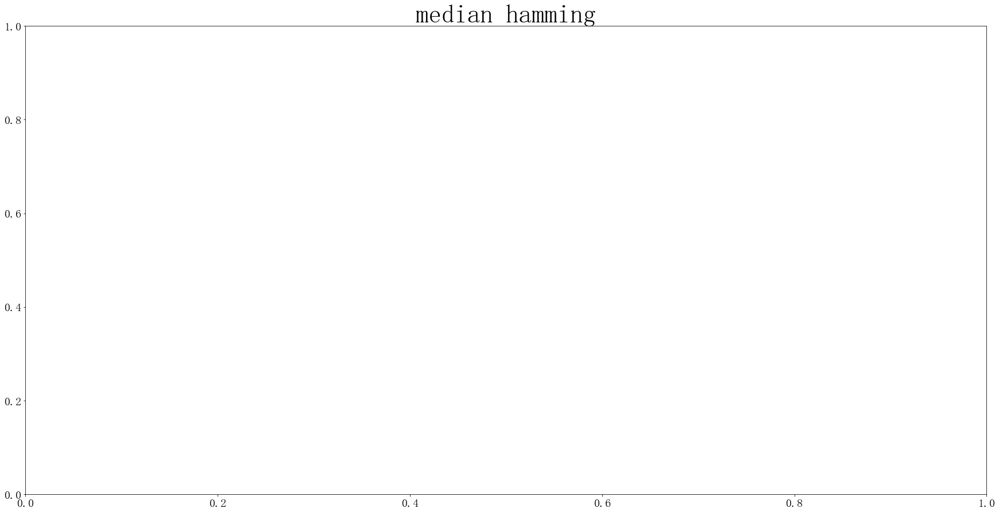

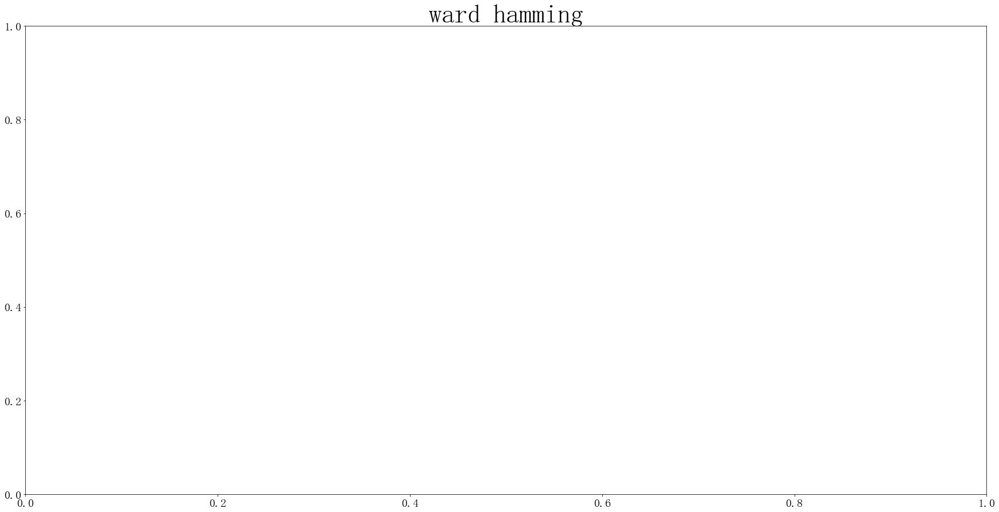

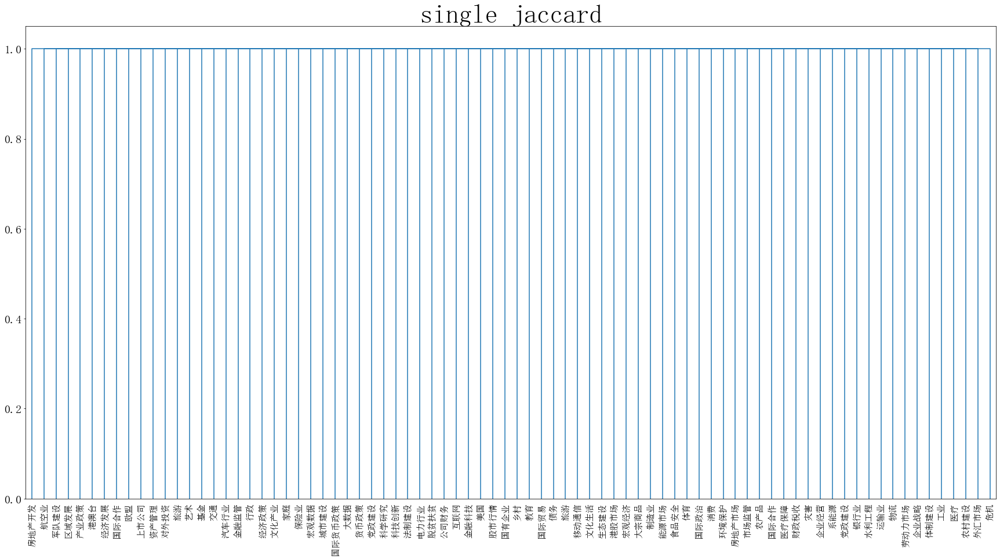

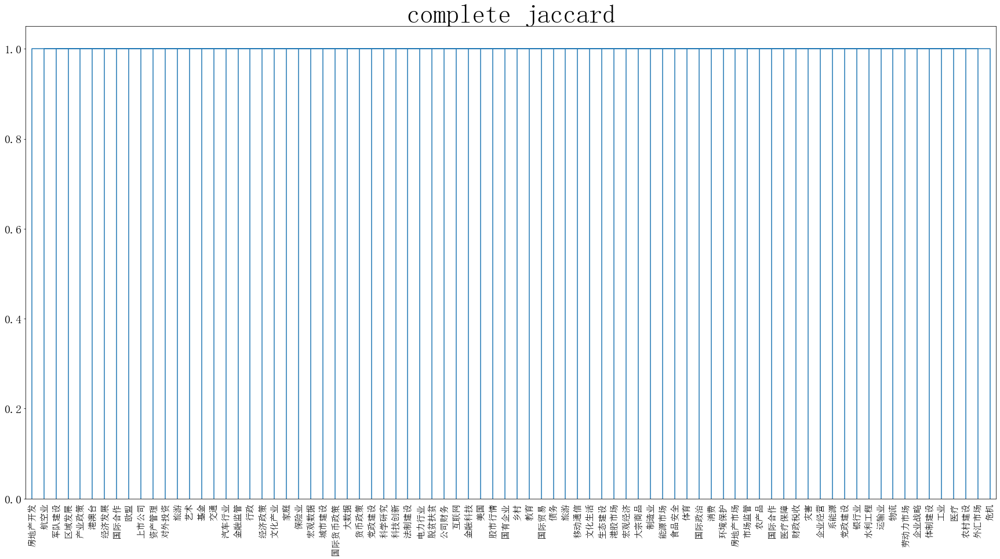

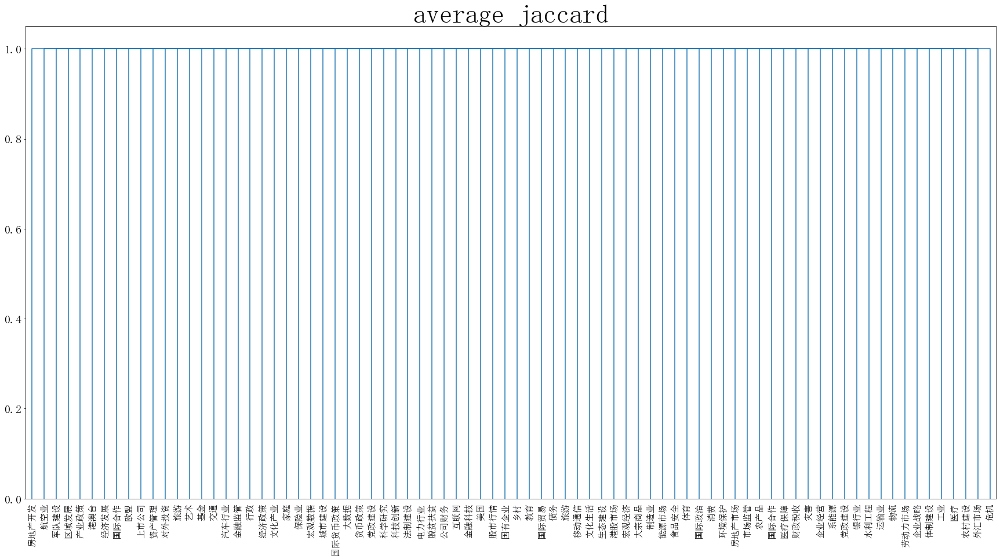

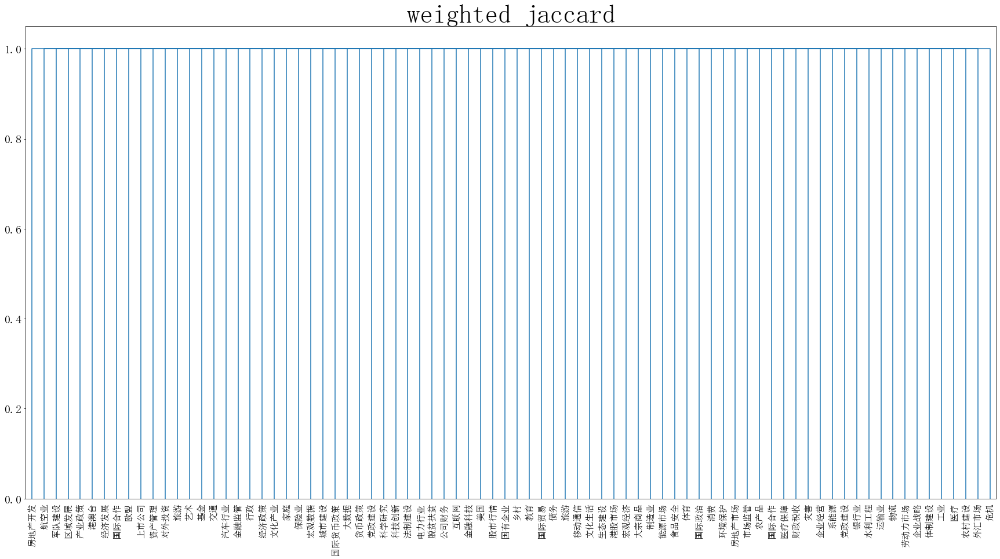

10it [04:13, 26.30s/it]

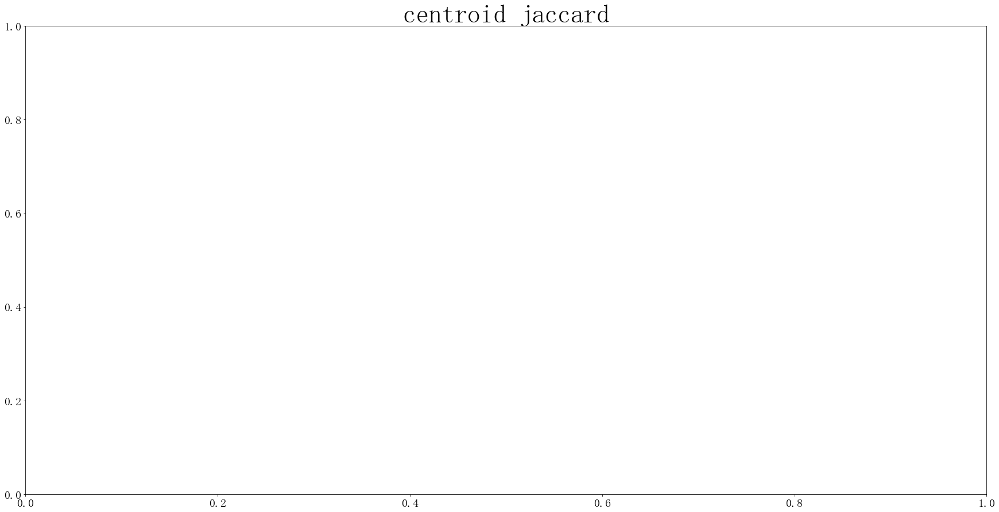

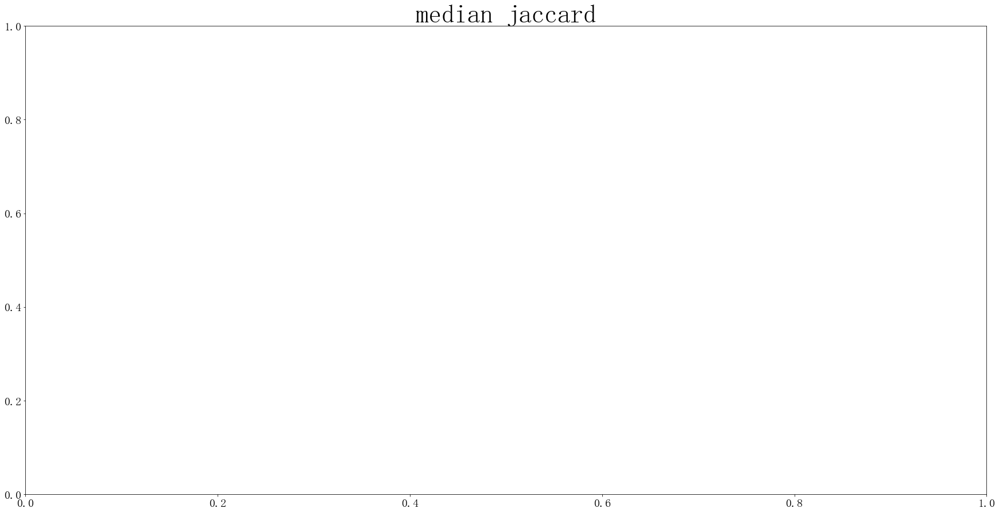

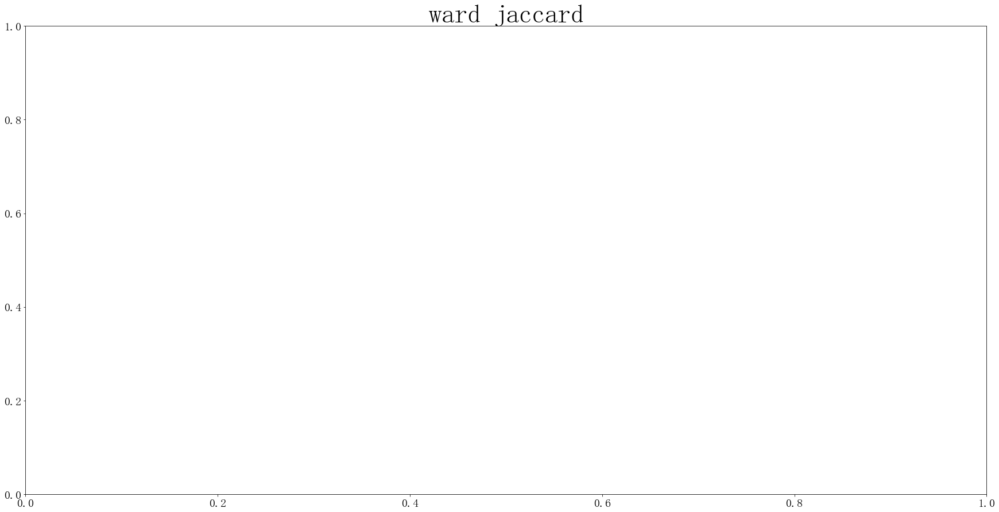

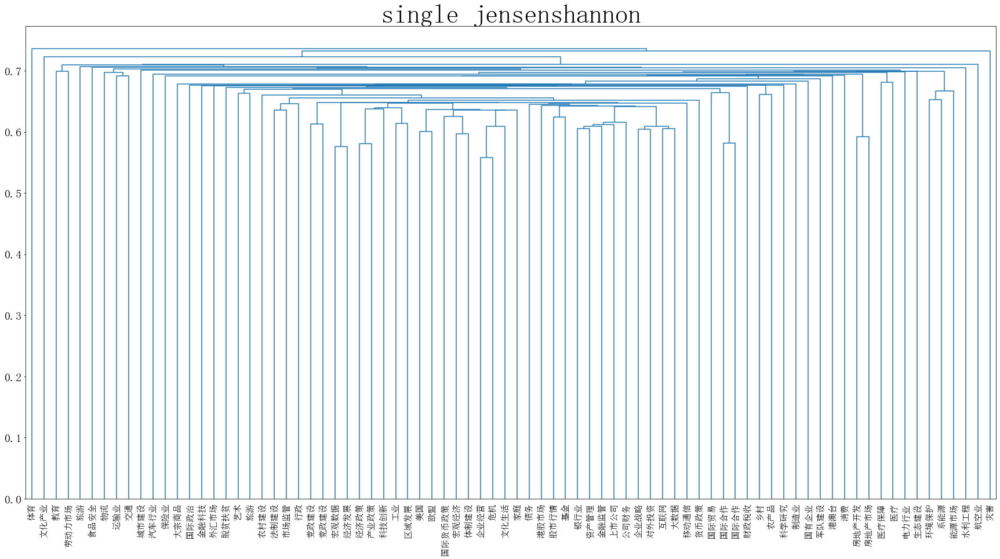

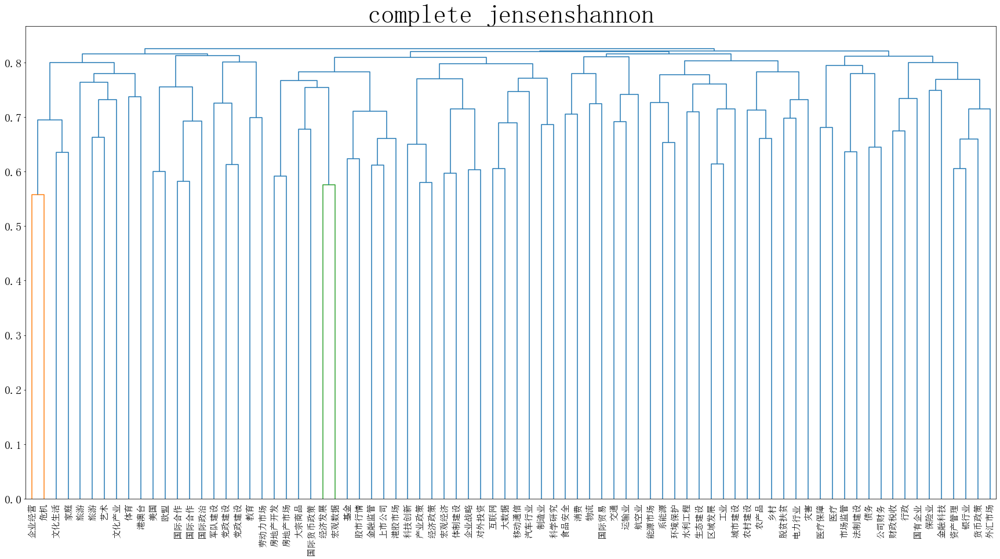

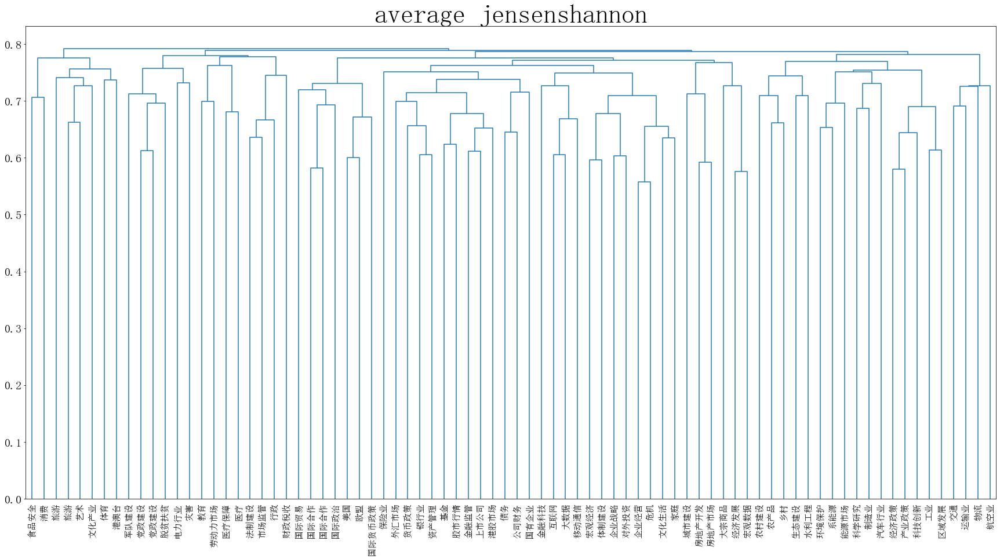

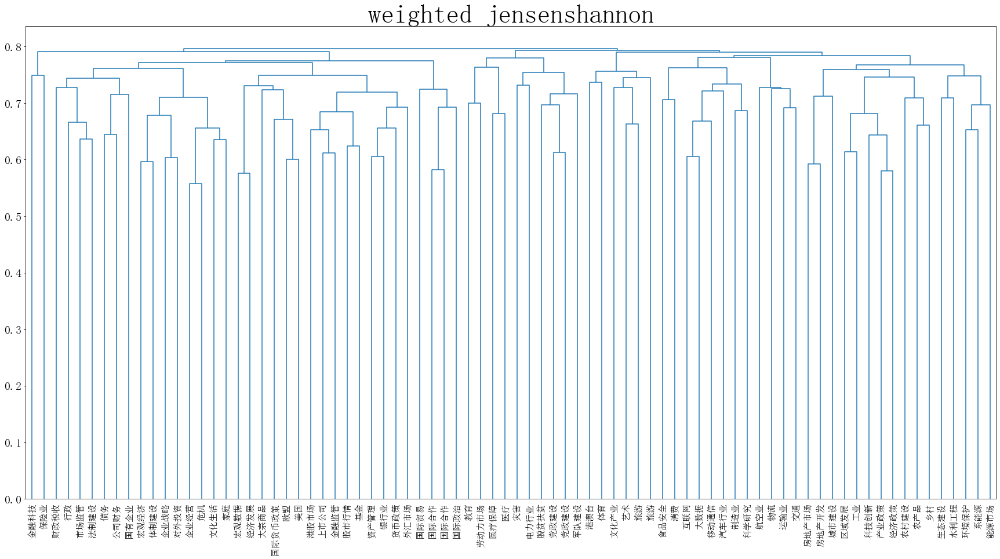

11it [05:11, 36.09s/it]

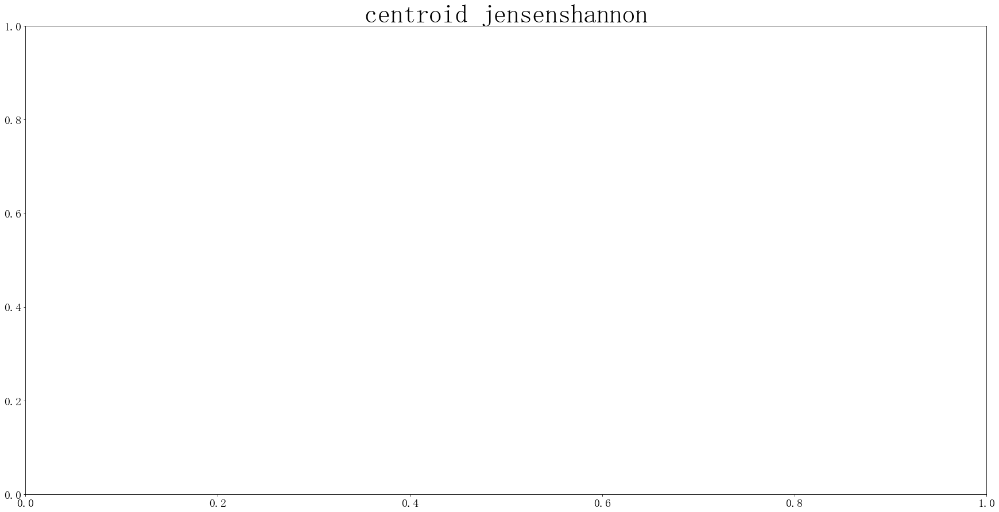

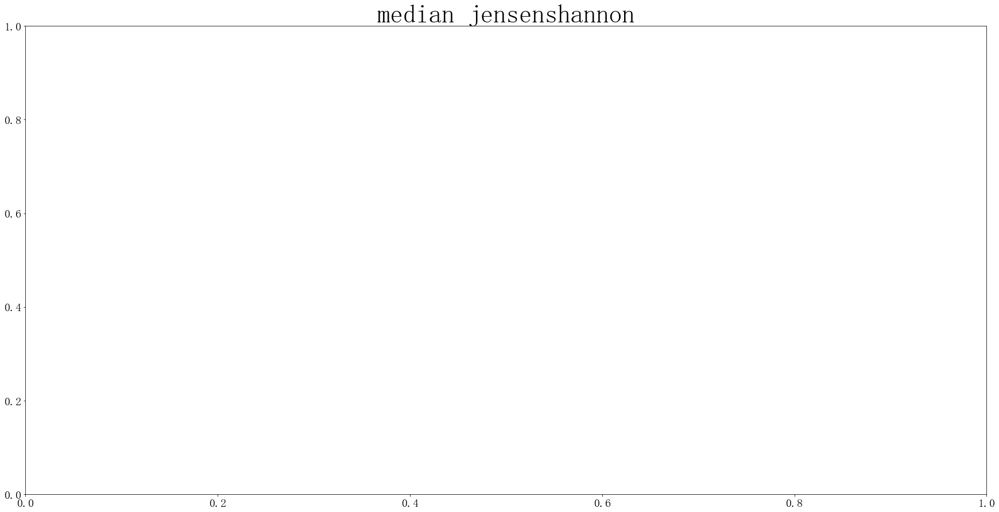

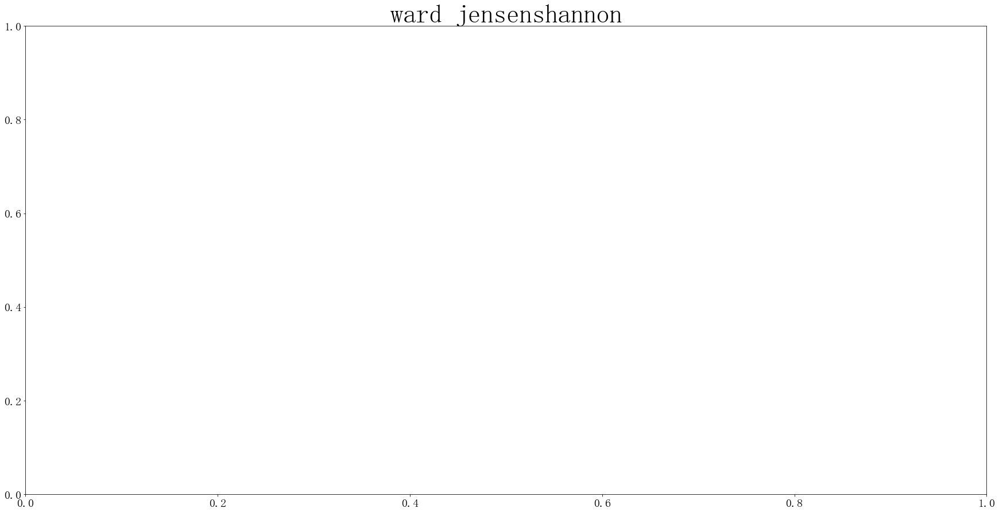

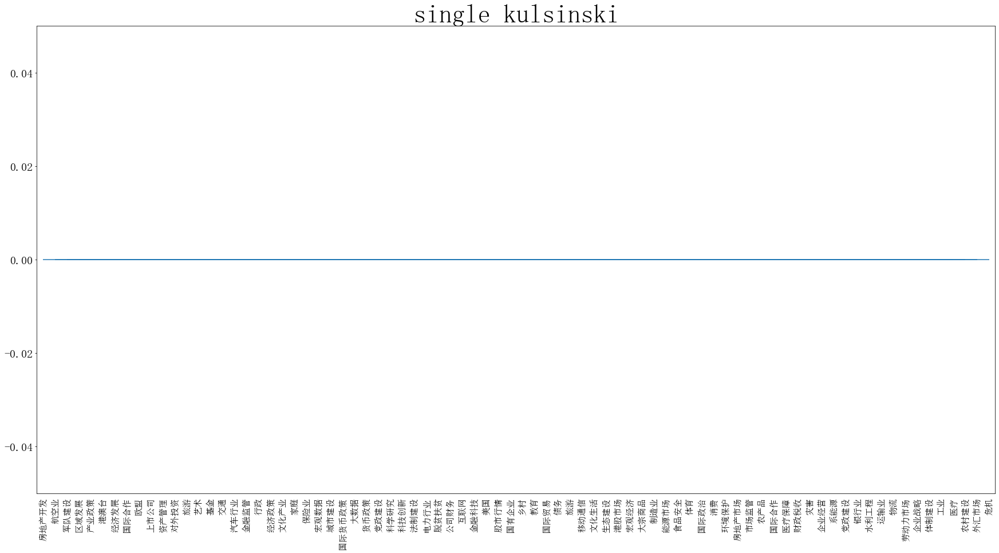

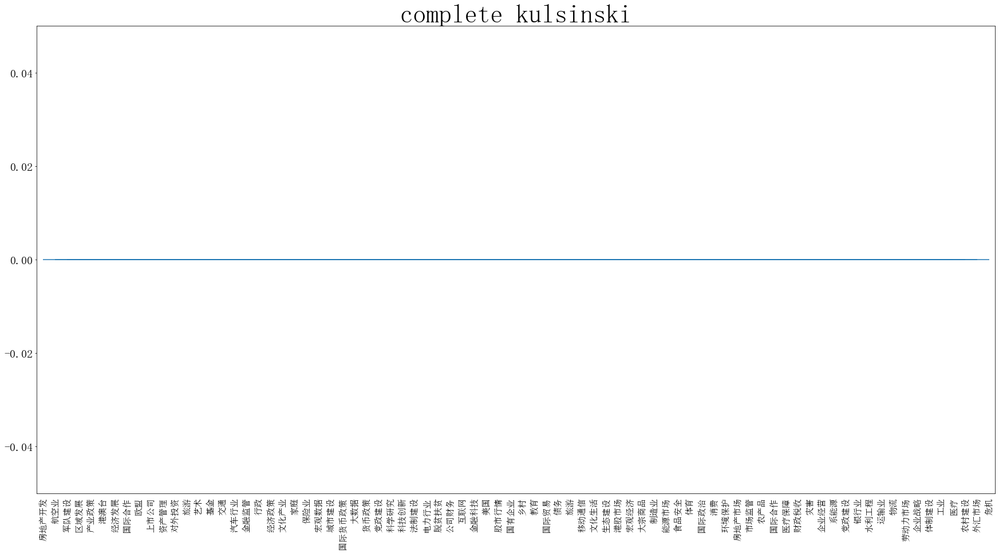

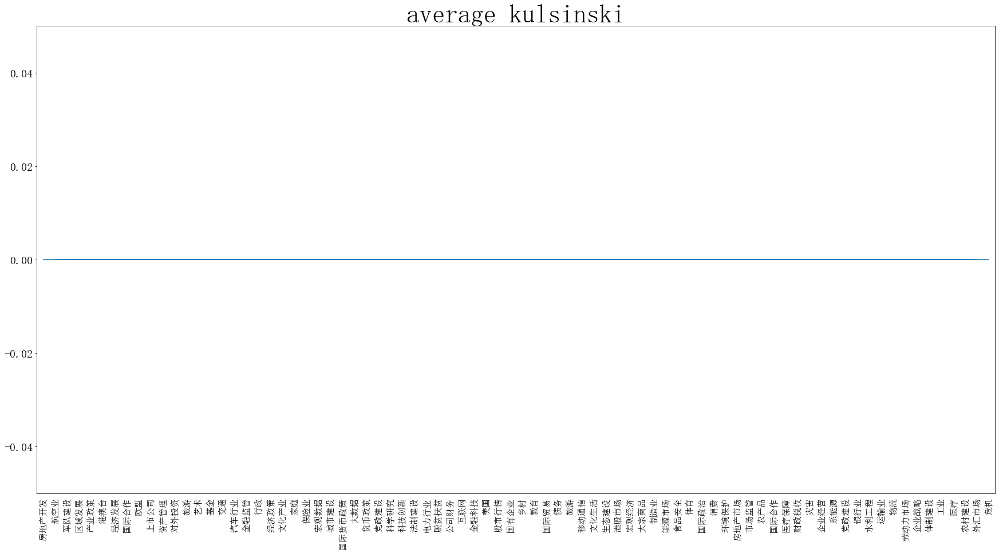

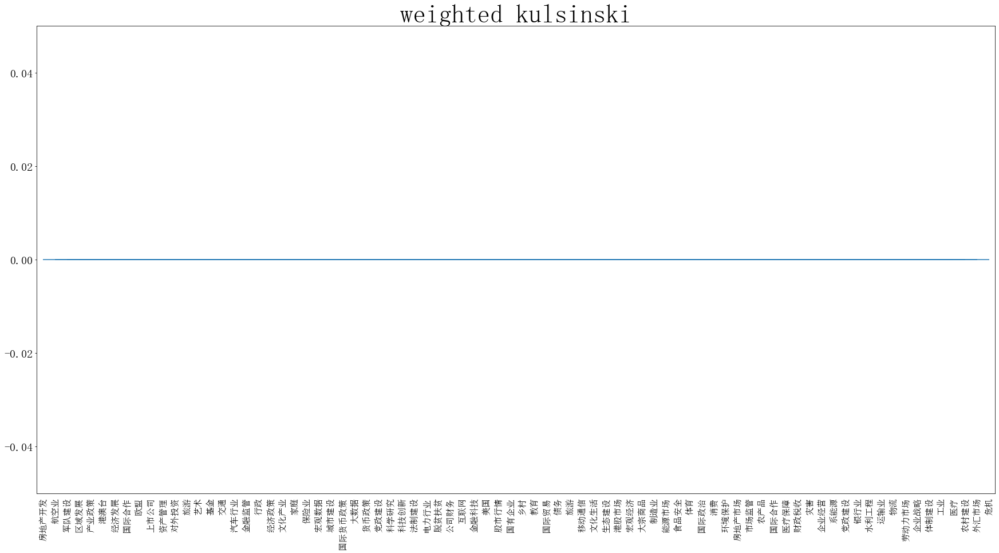

13it [05:35, 22.64s/it]

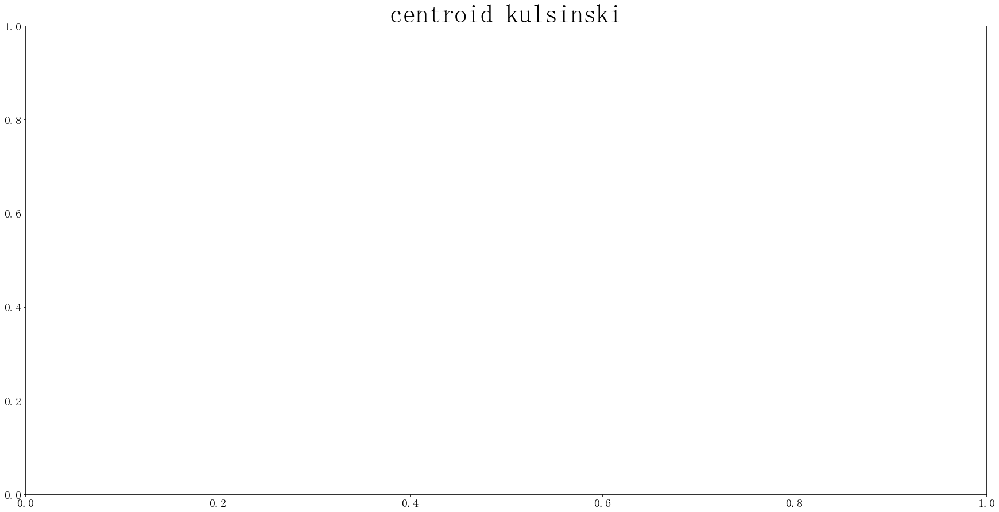

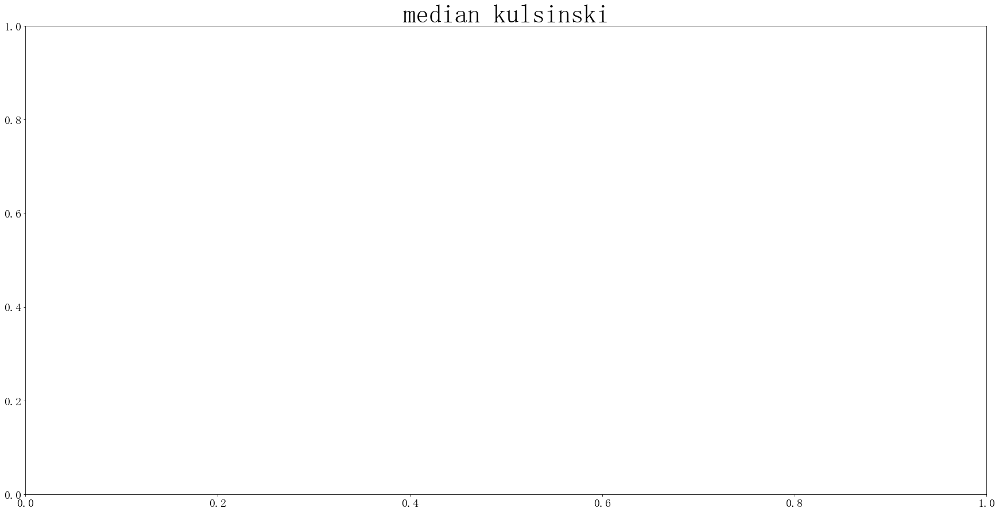

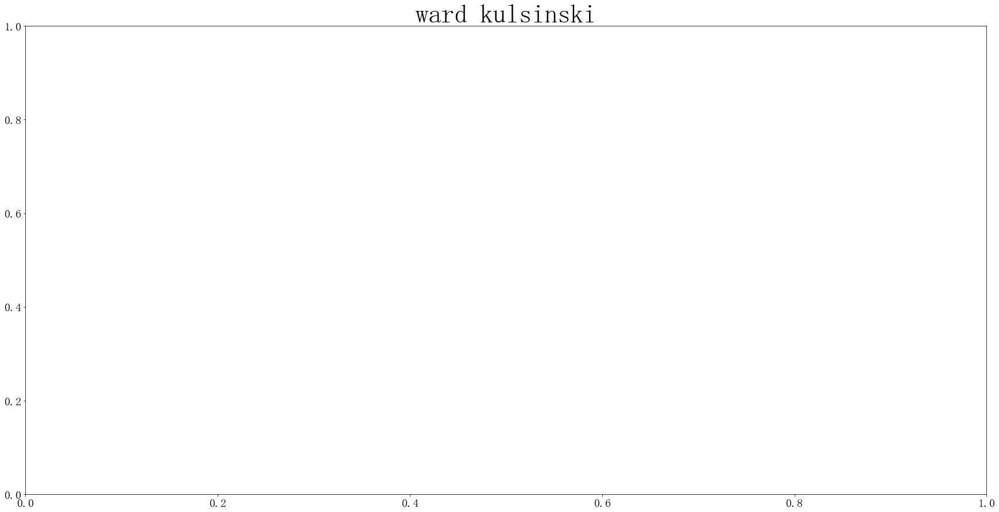

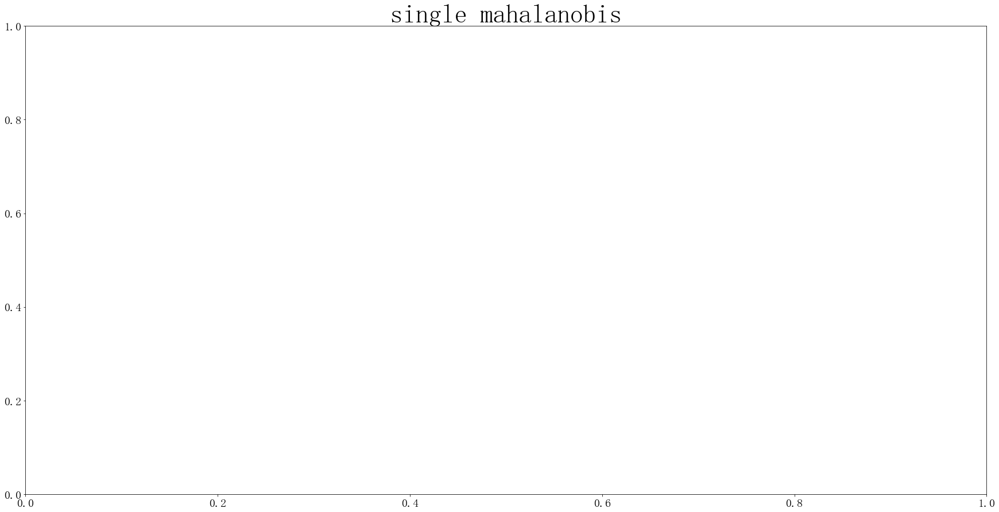

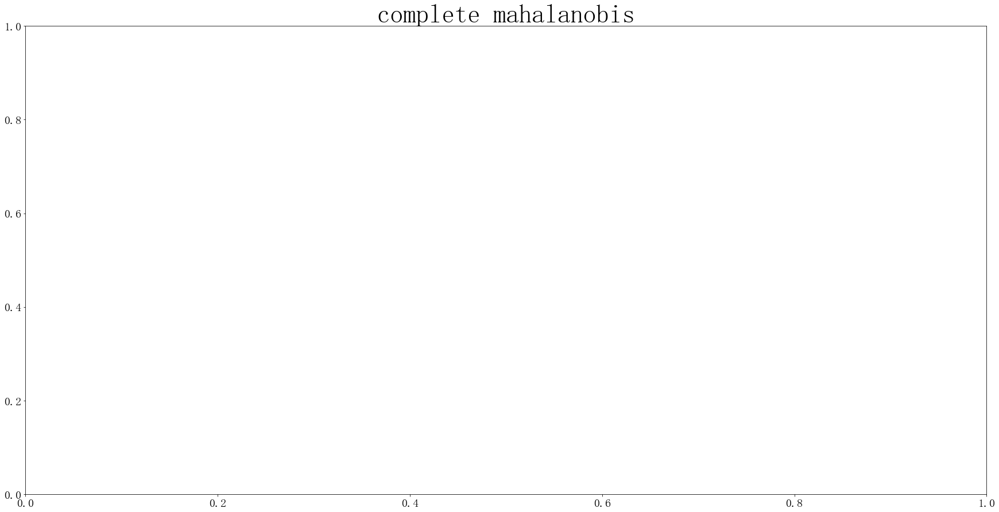

...

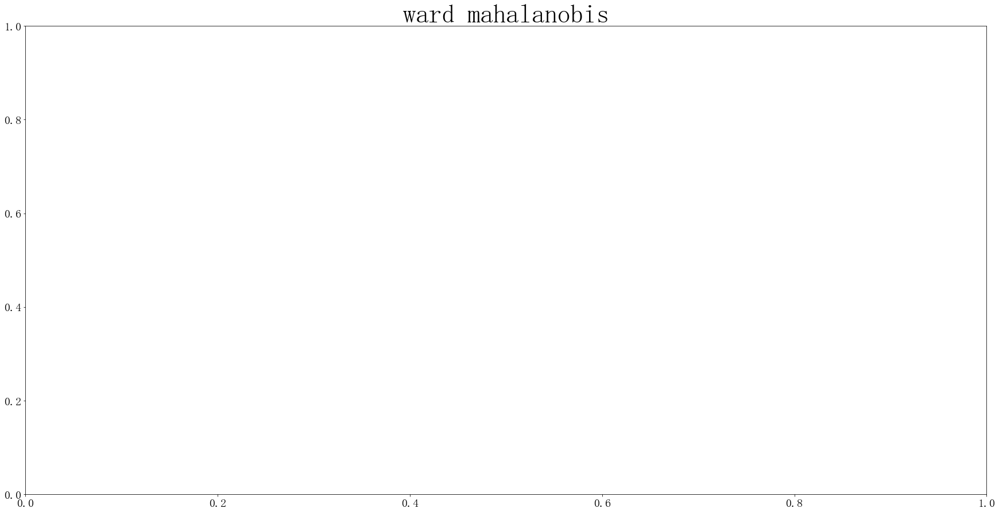

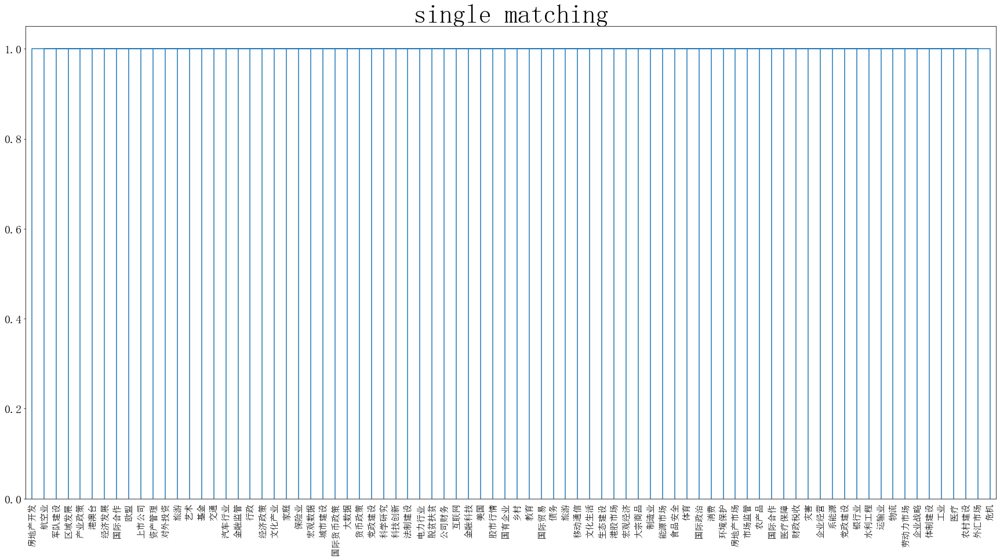

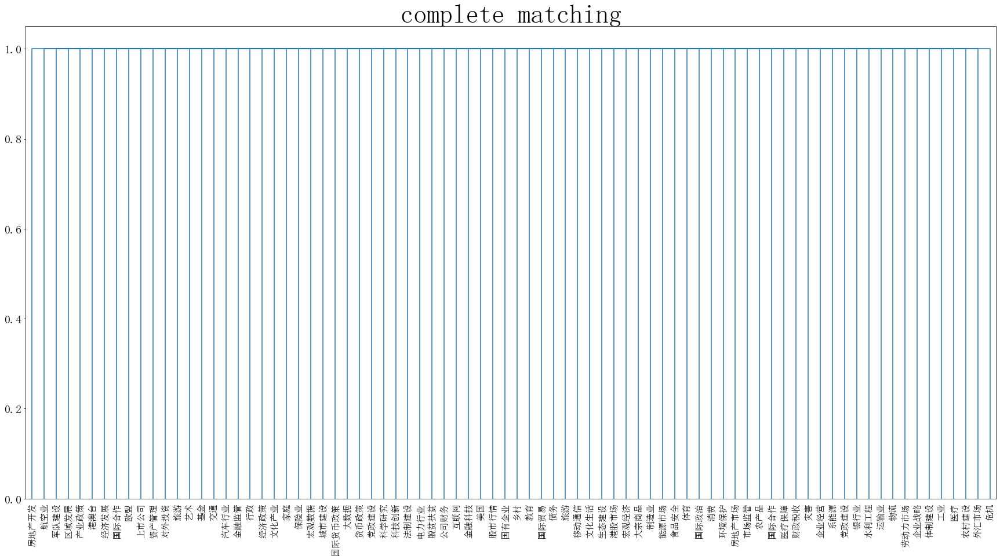

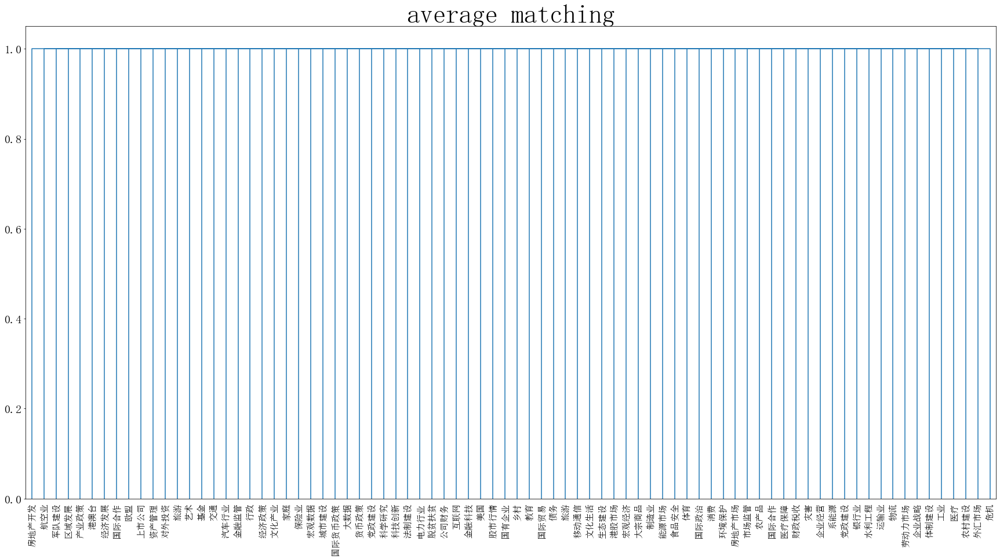

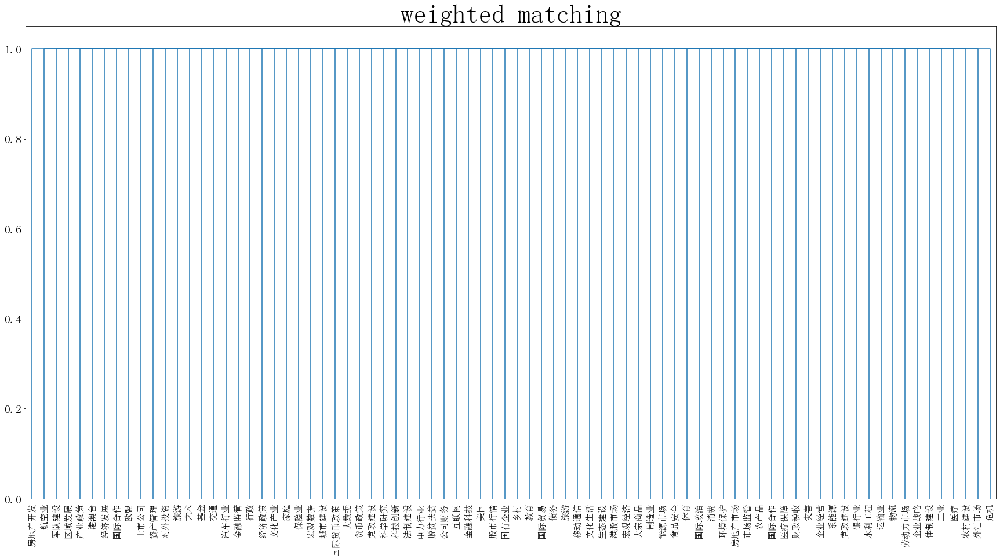

14it [06:00, 23.23s/it]

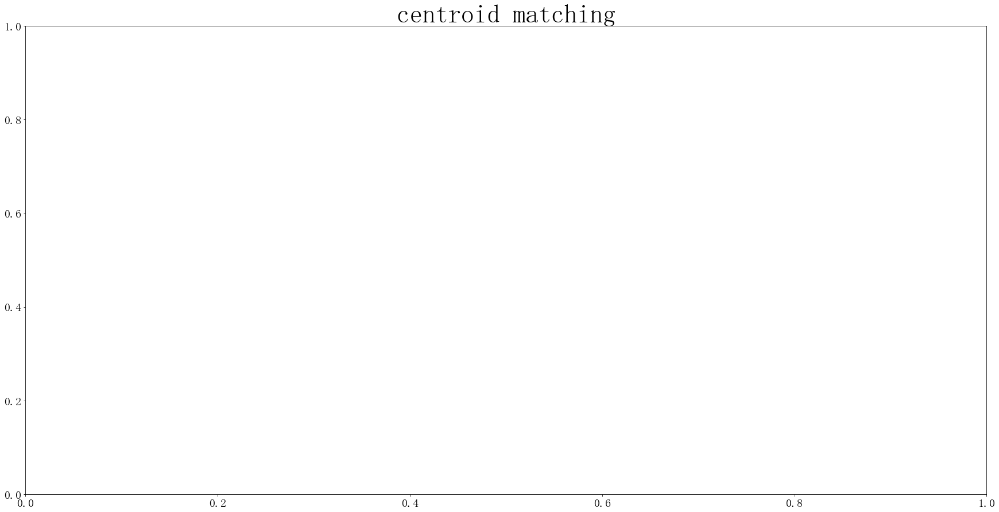

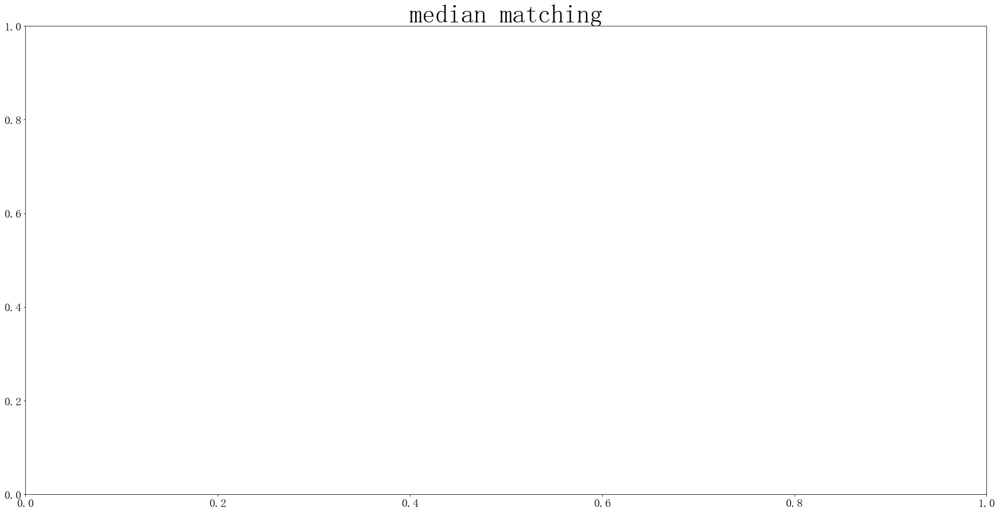

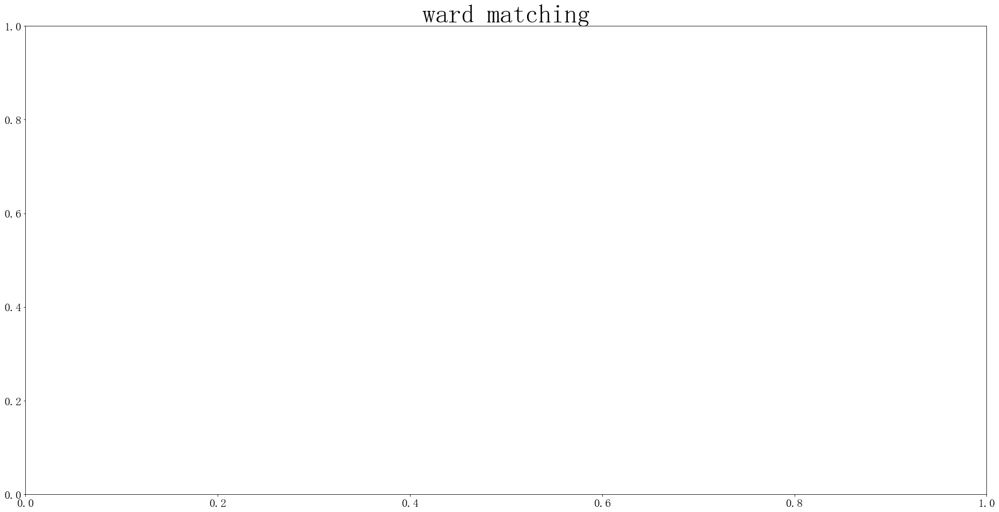

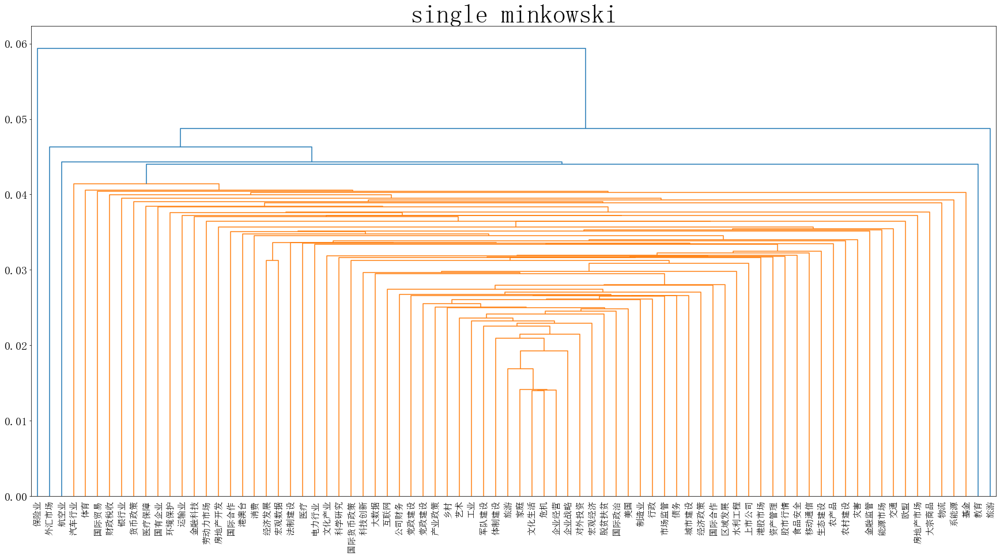

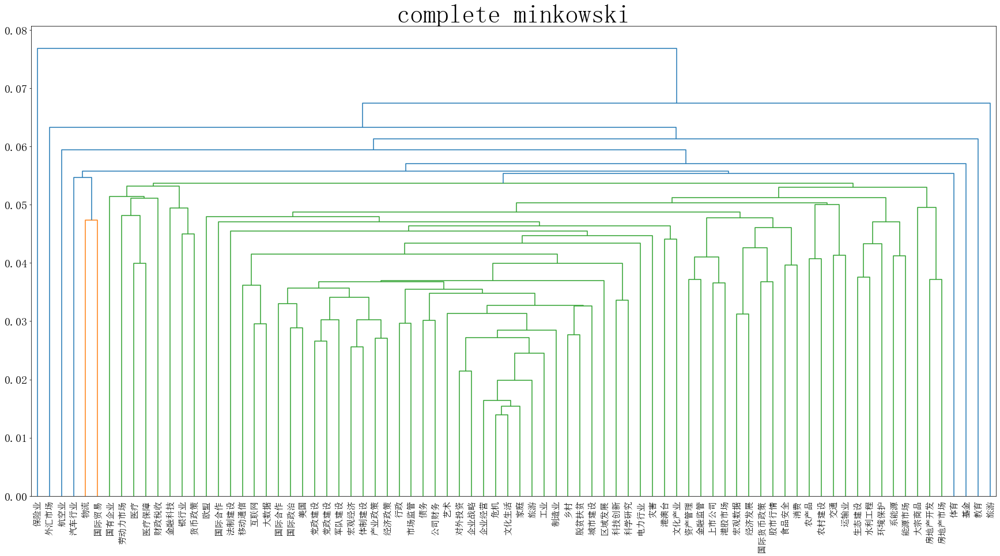

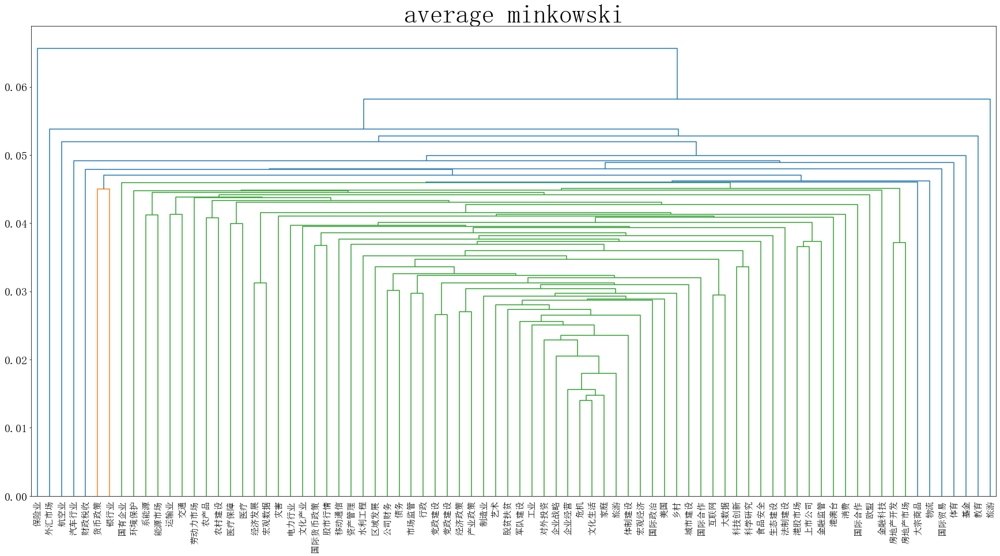

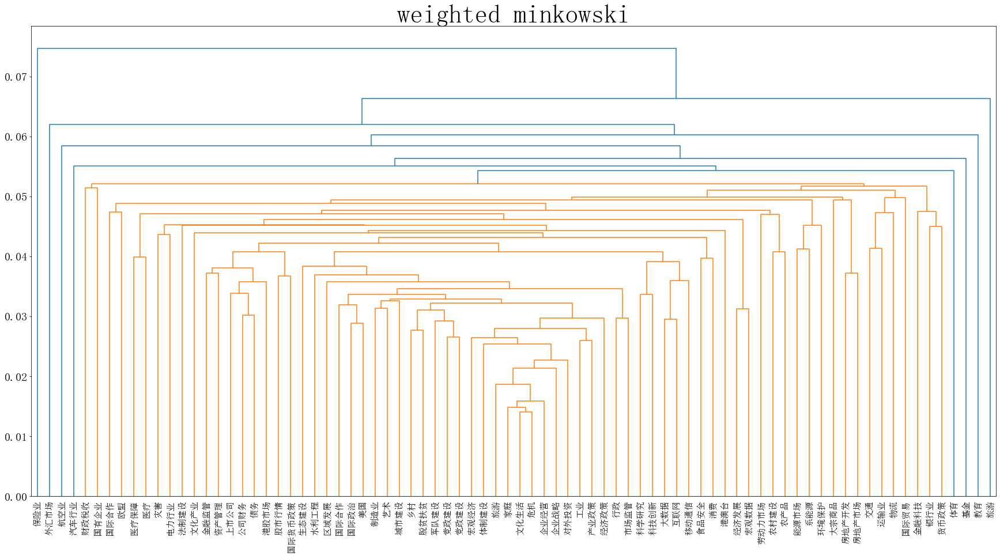

15it [06:23, 23.12s/it]

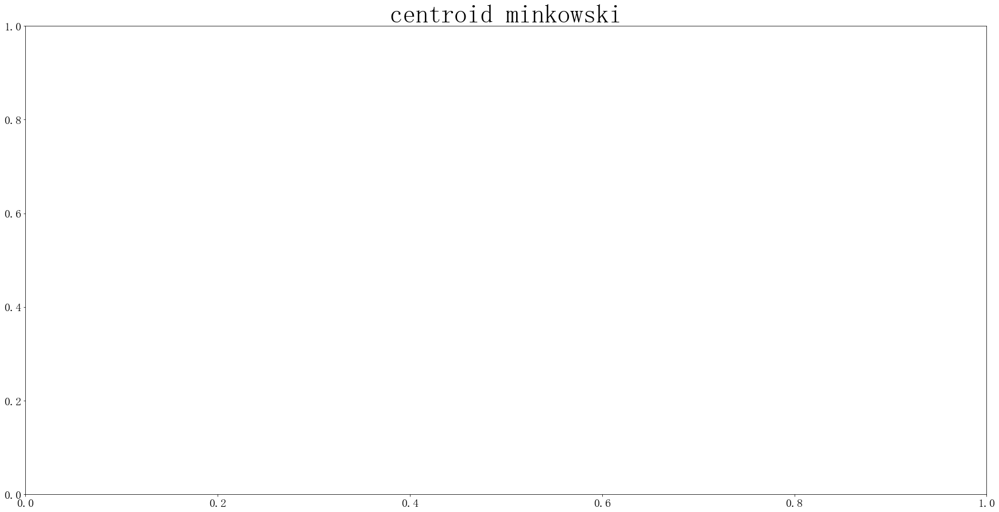

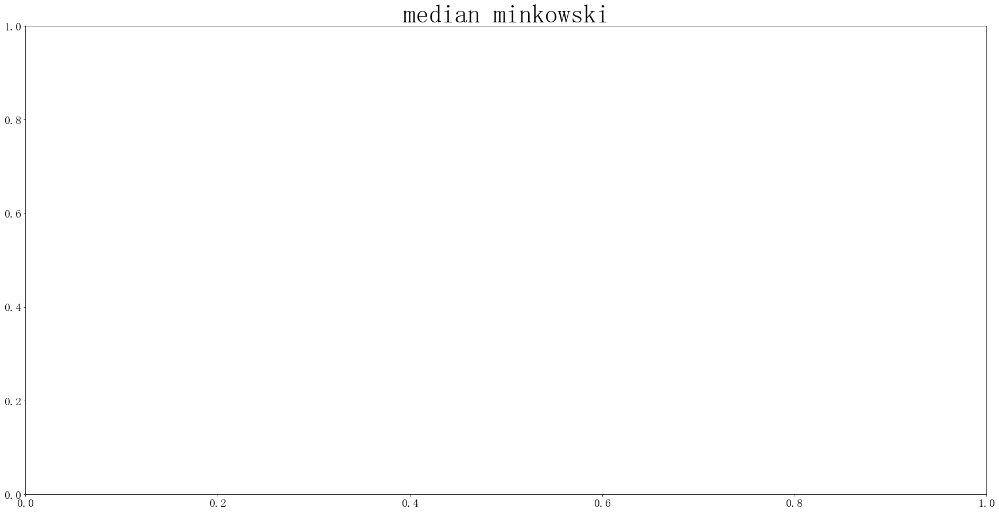

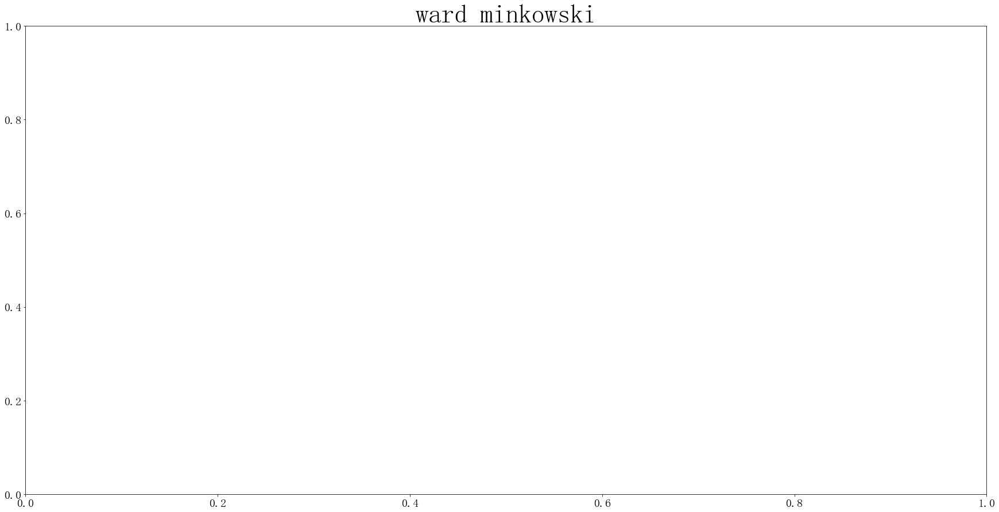

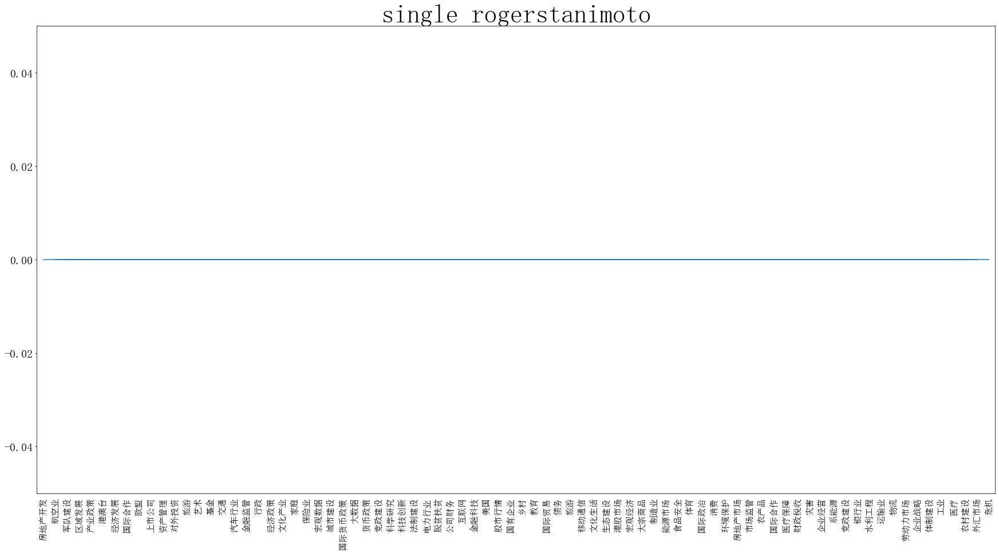

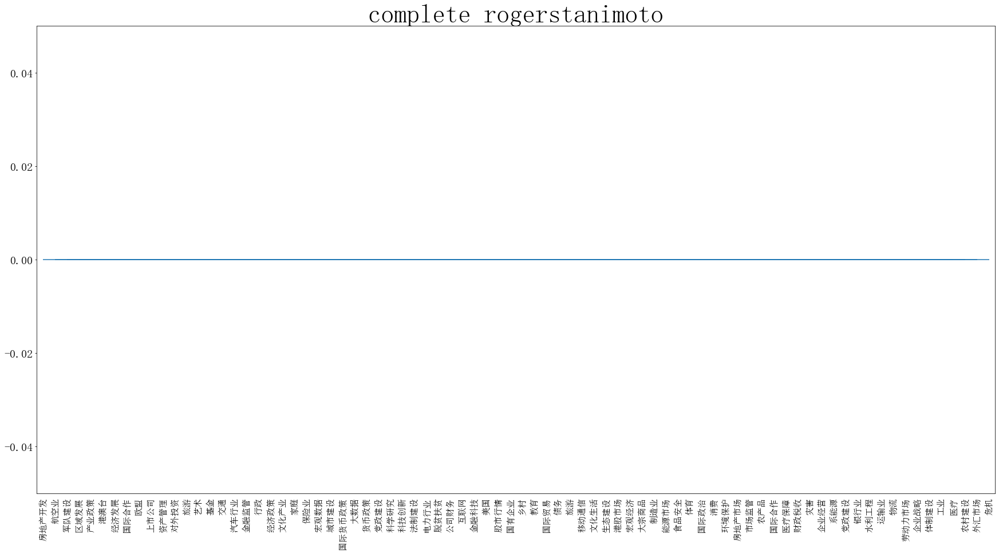

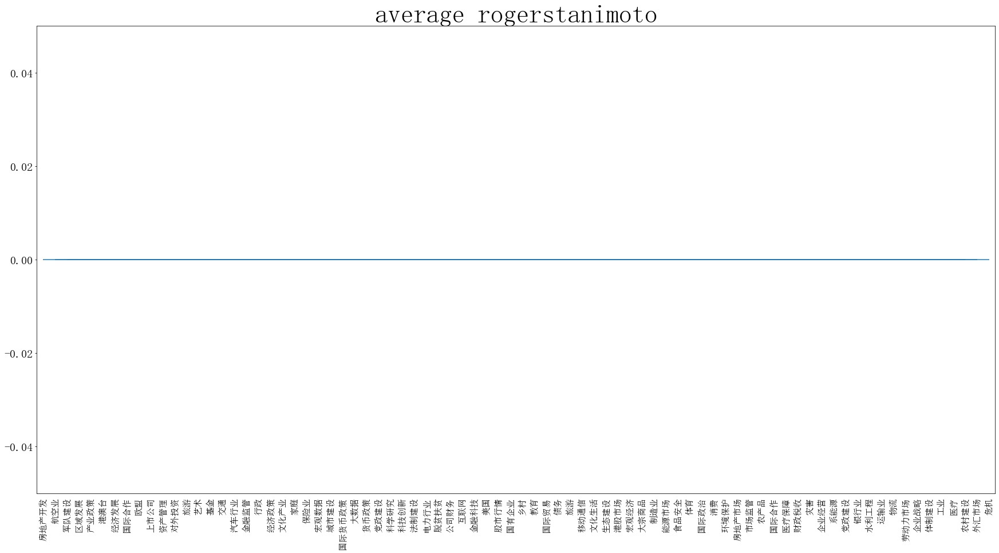

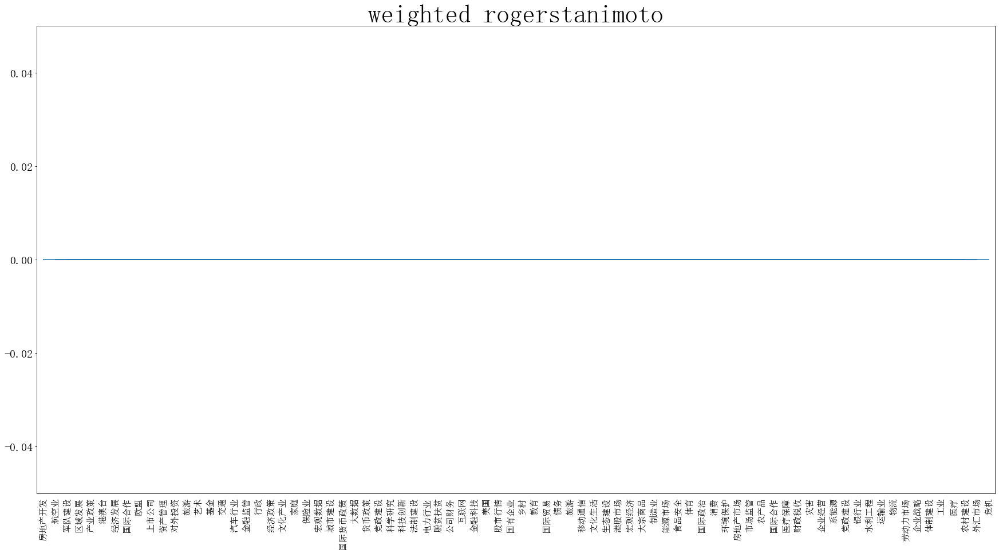

16it [06:47, 23.35s/it]

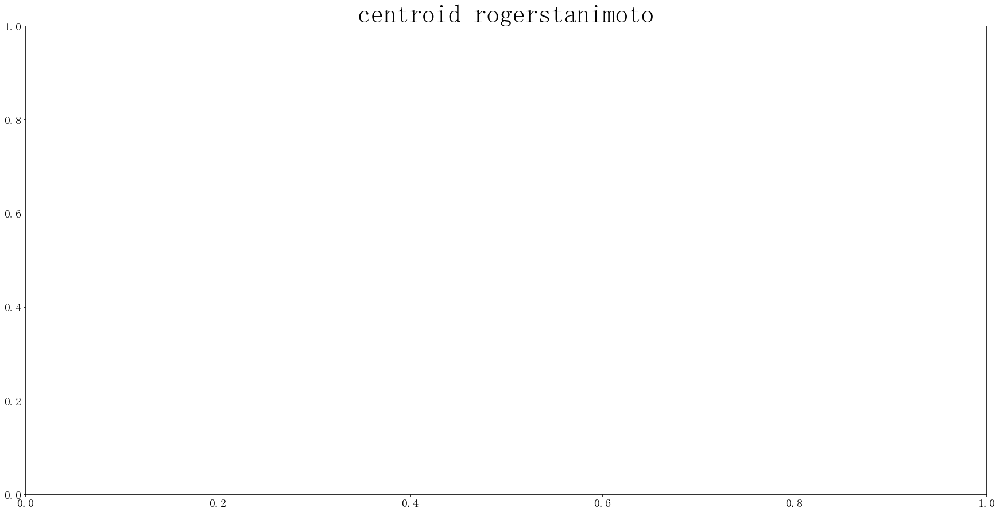

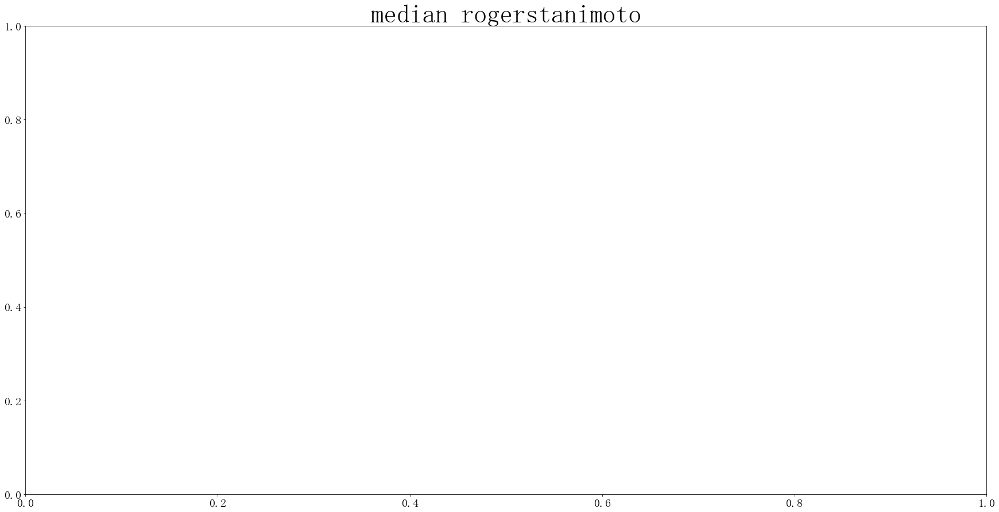

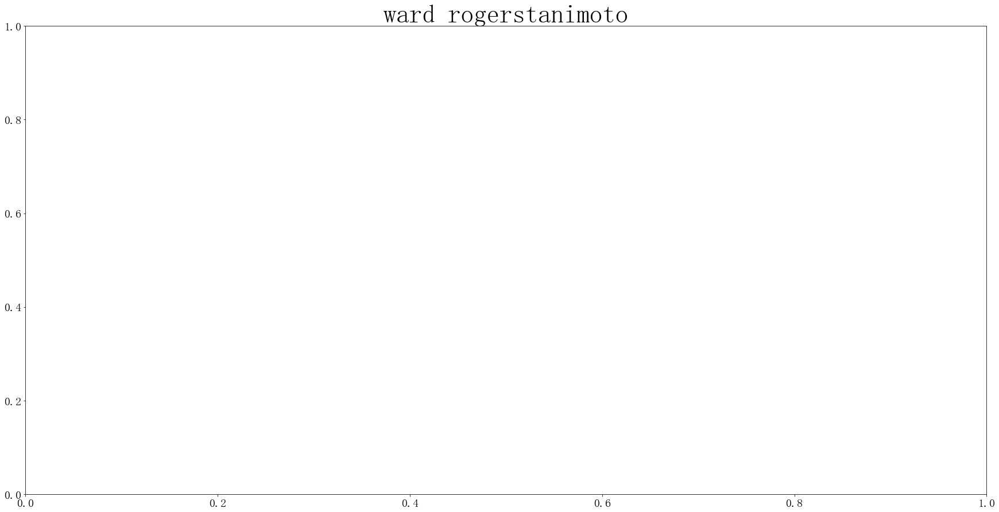

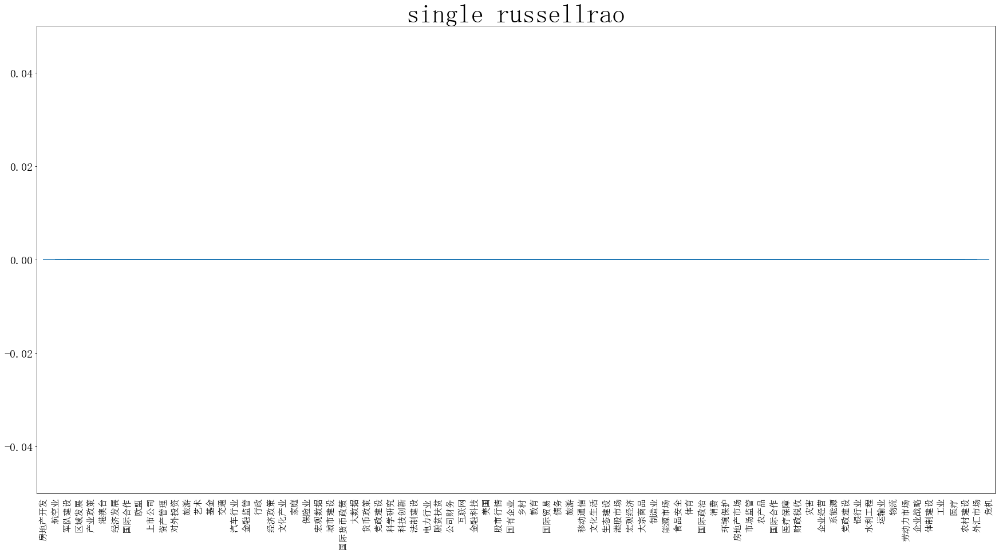

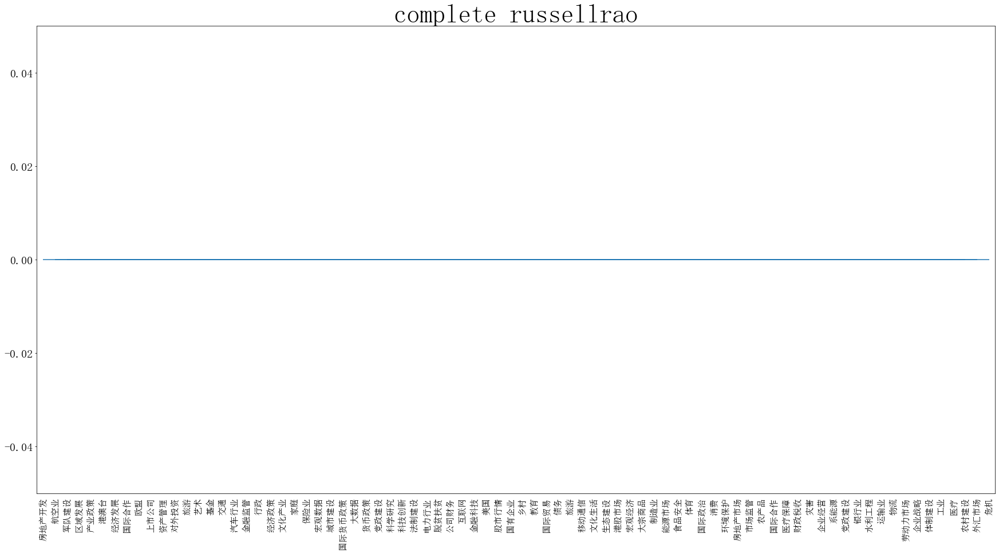

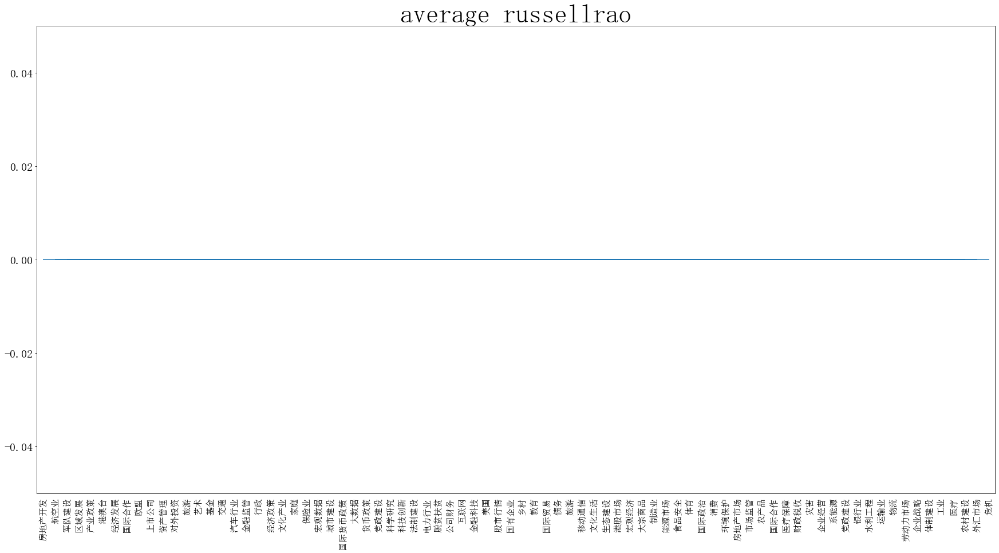

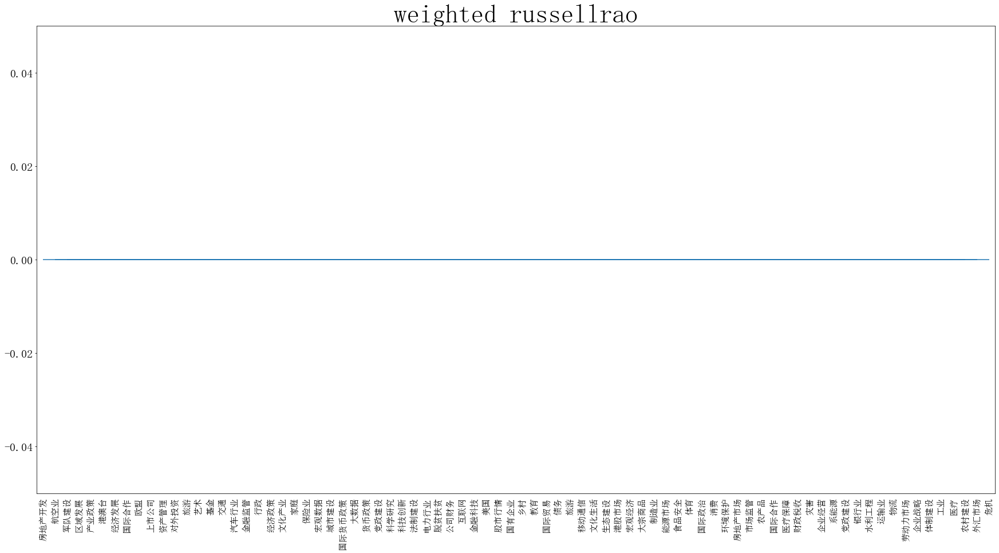

17it [07:10, 23.26s/it]

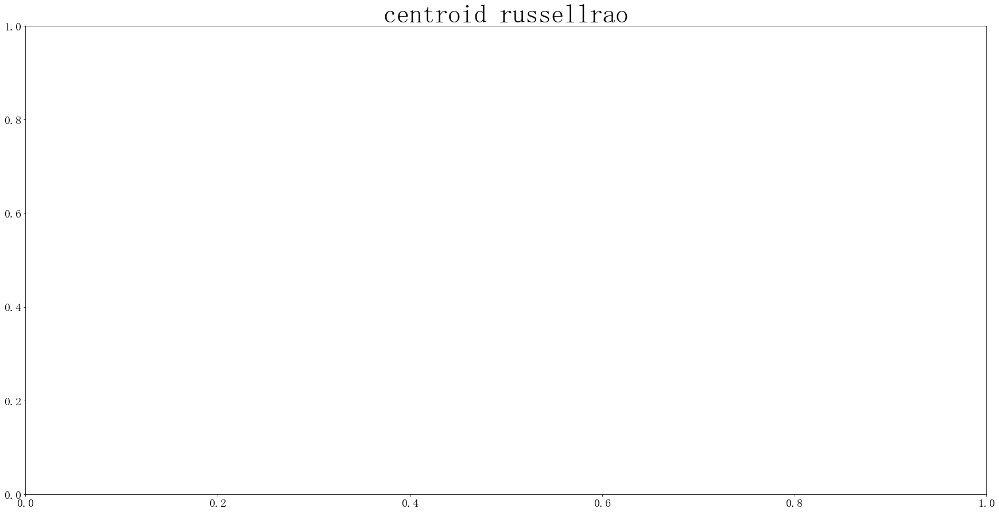

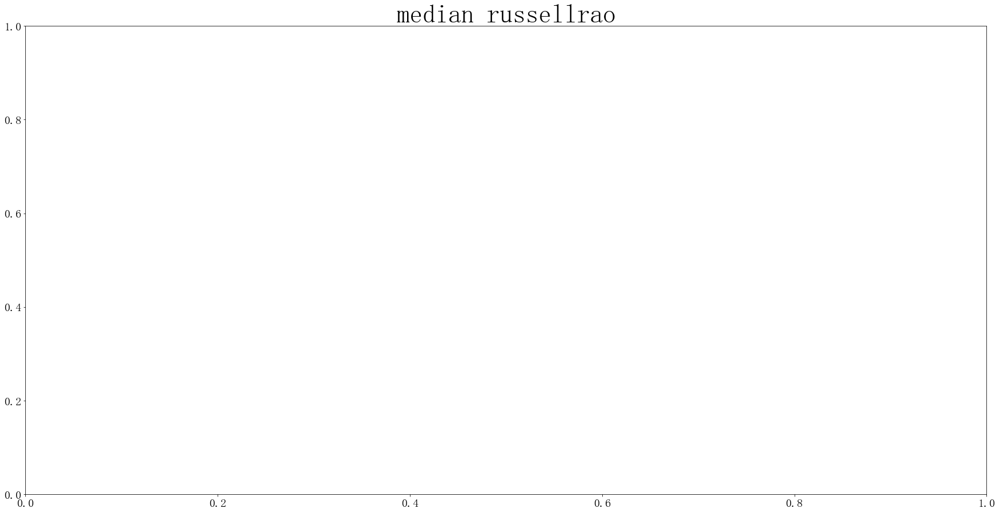

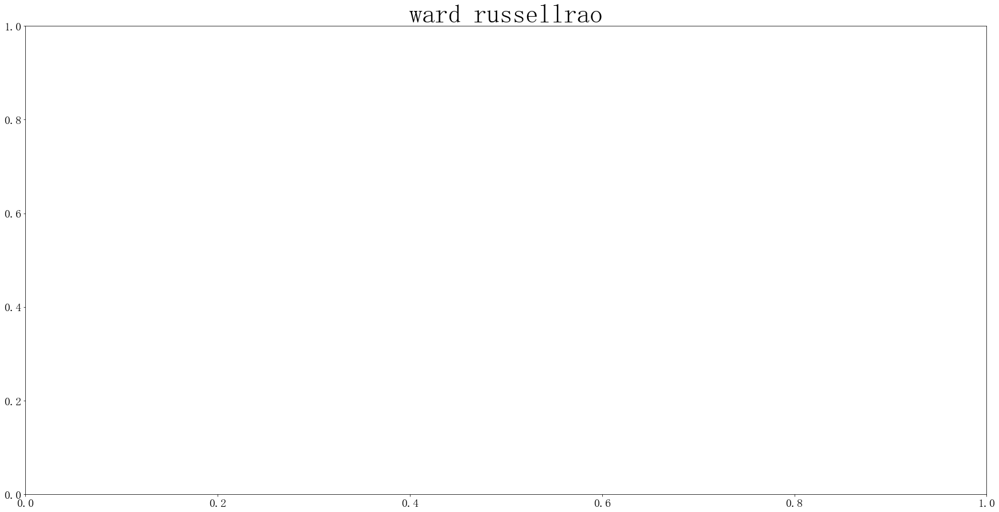

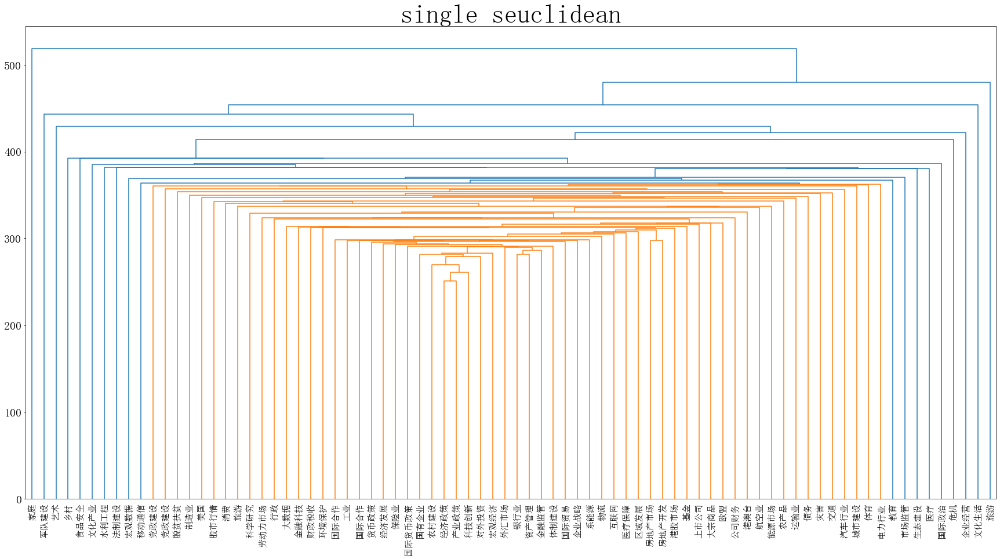

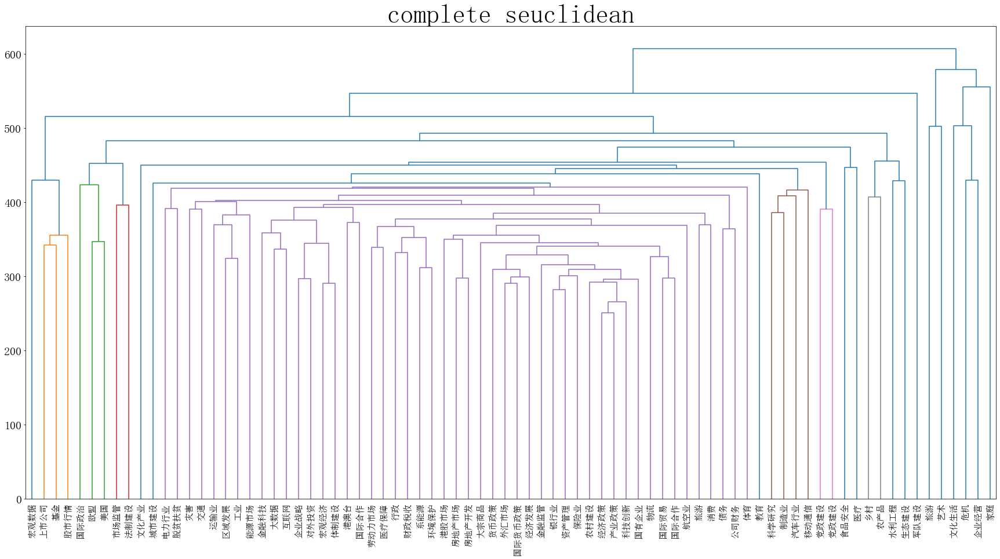

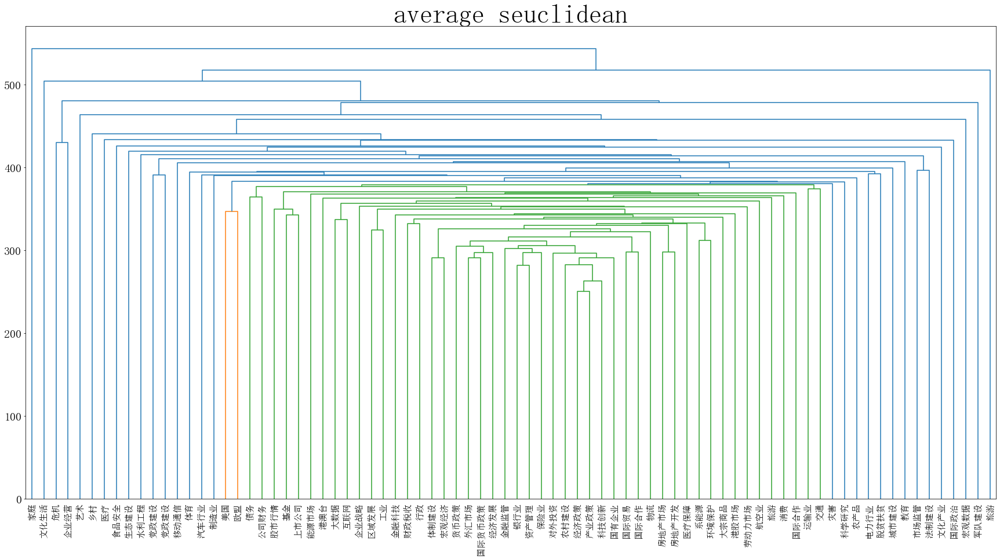

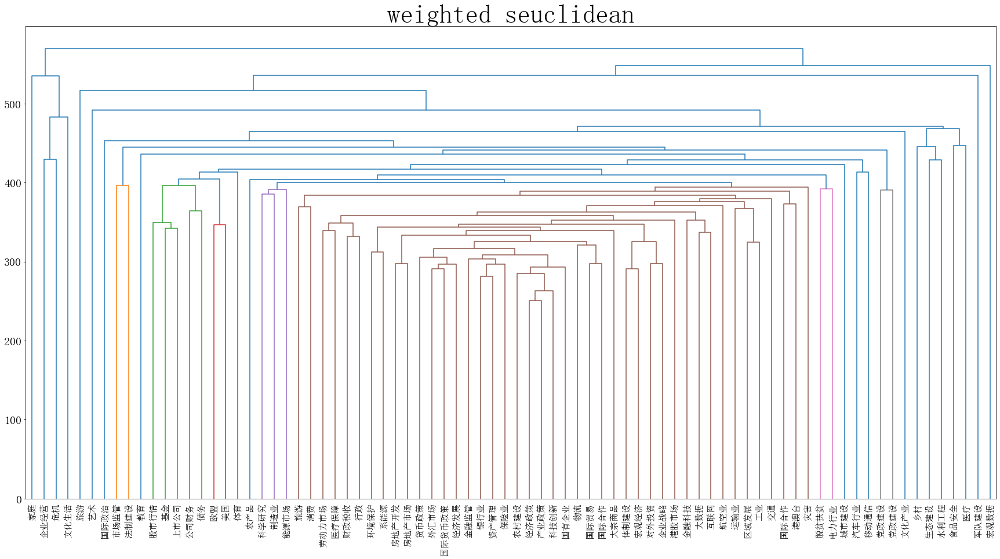

18it [07:40, 25.37s/it]

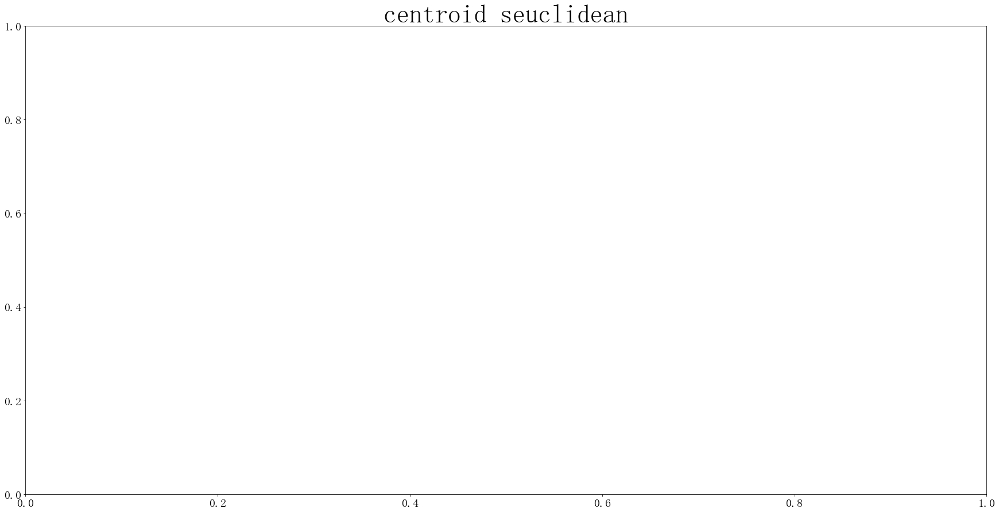

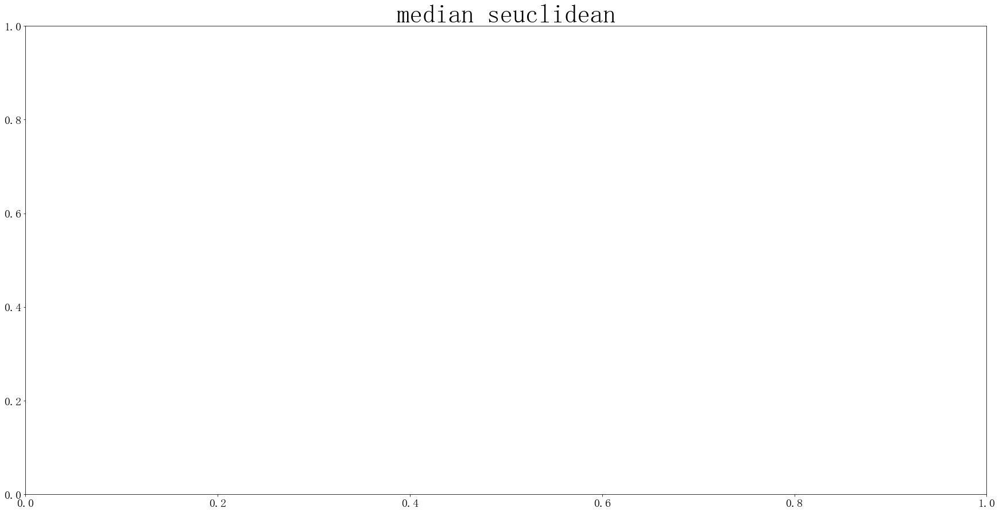

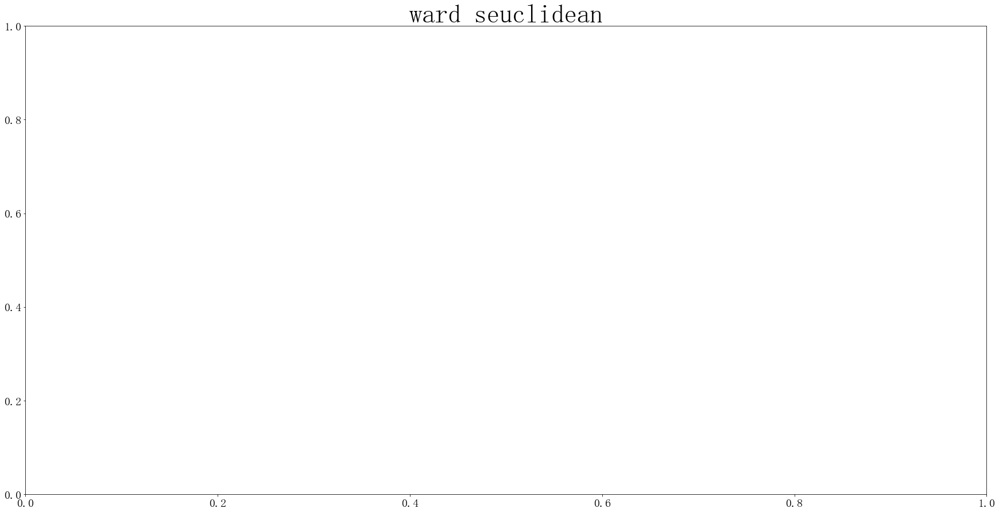

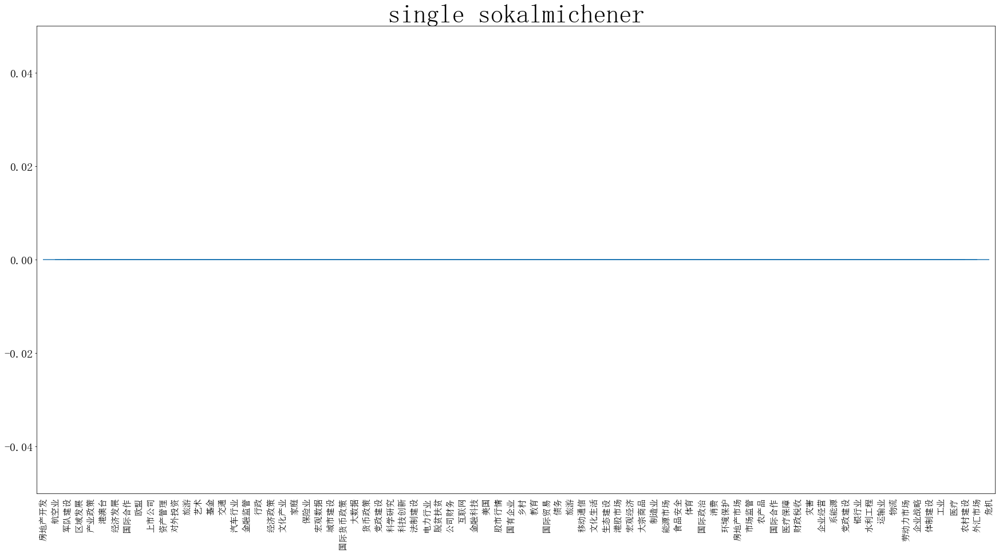

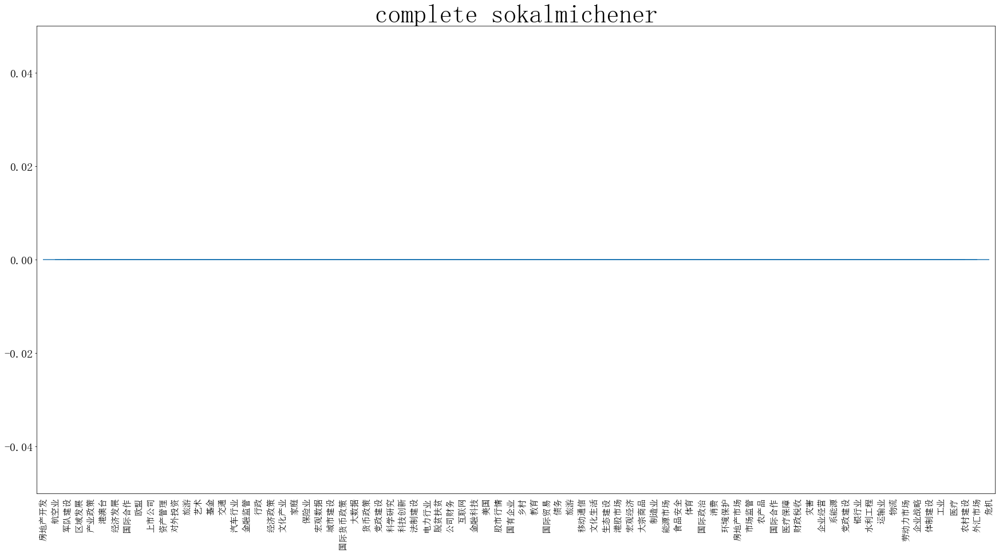

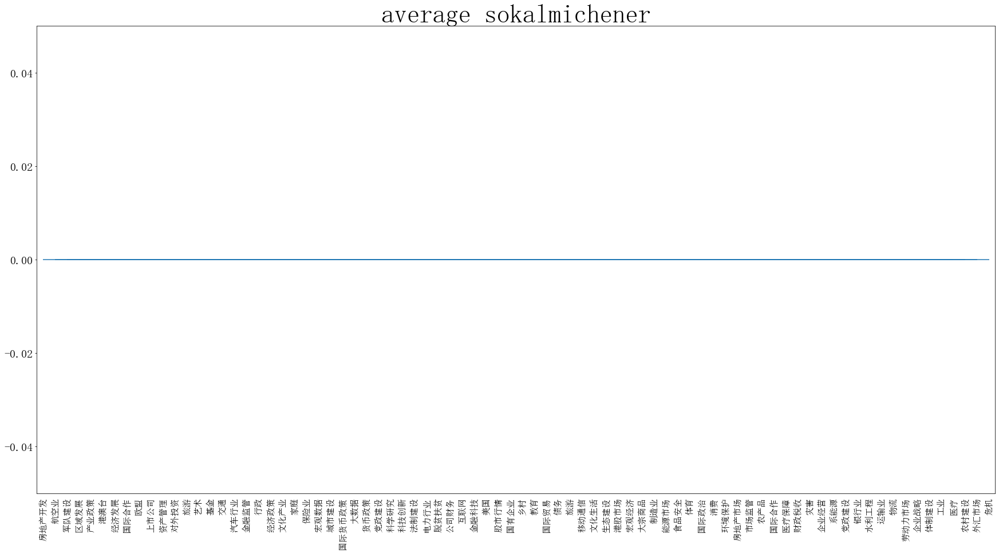

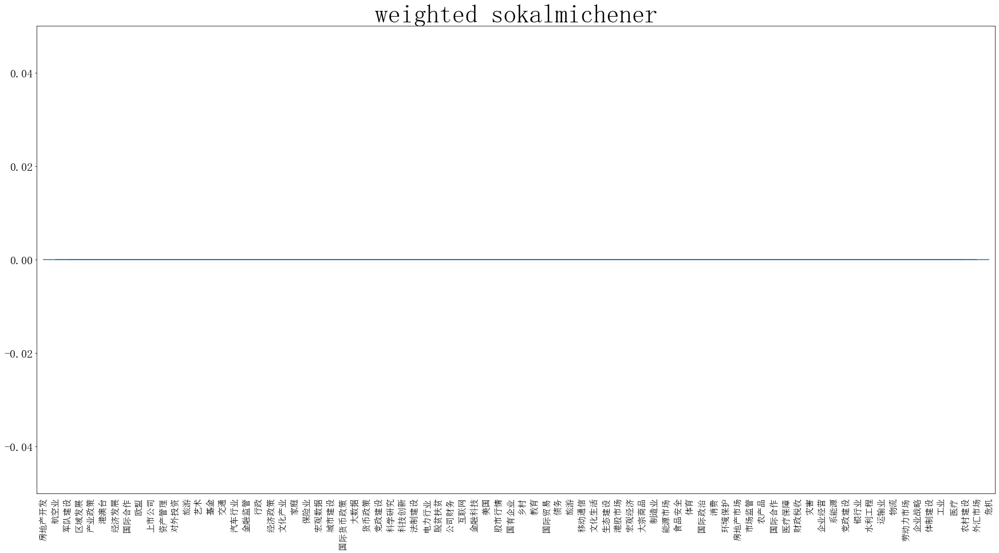

19it [08:03, 24.63s/it]

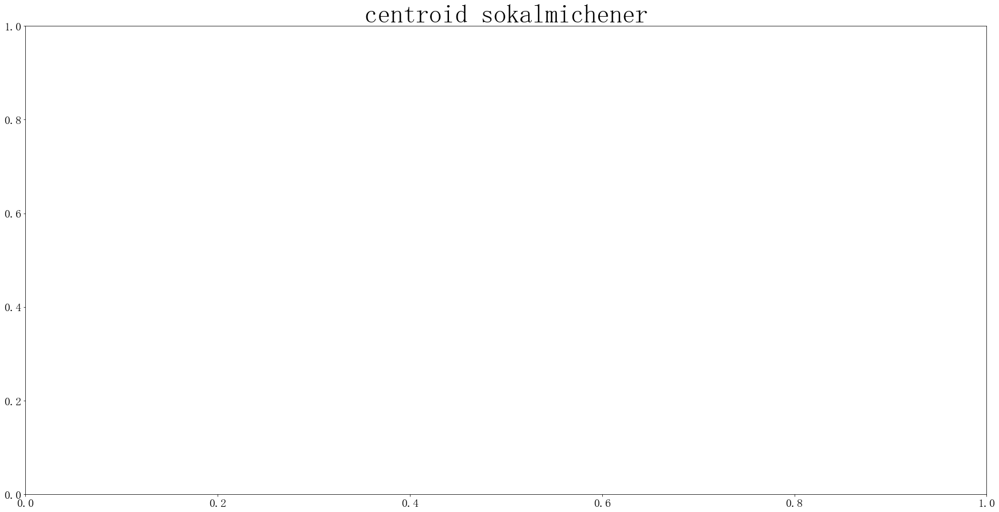

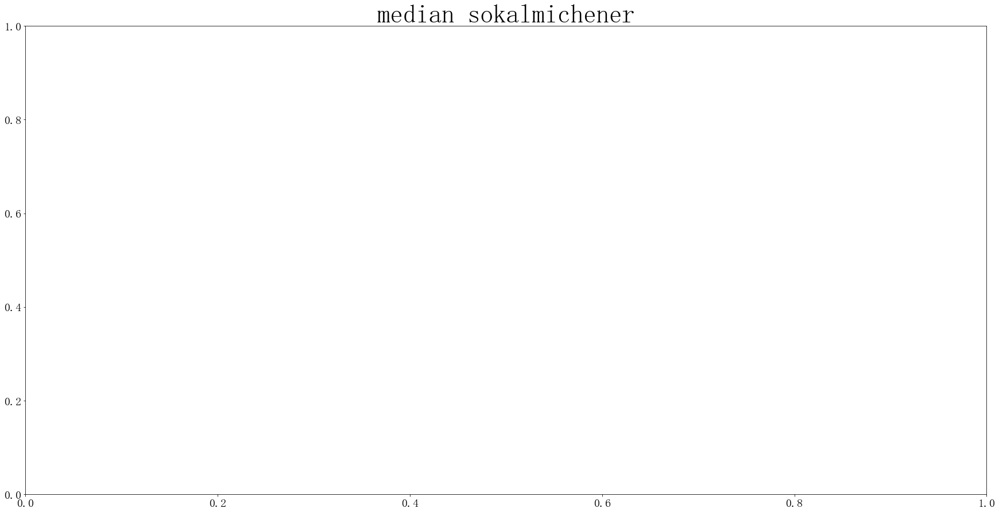

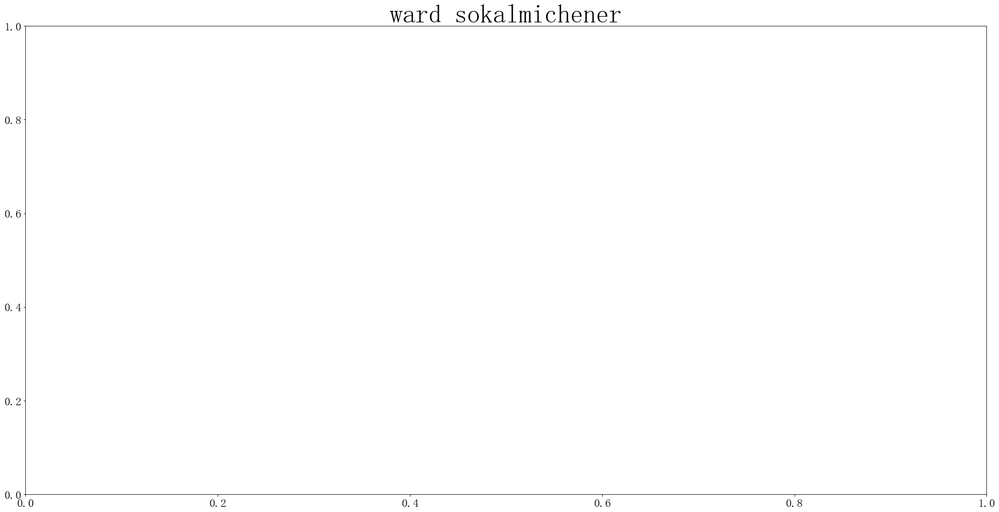

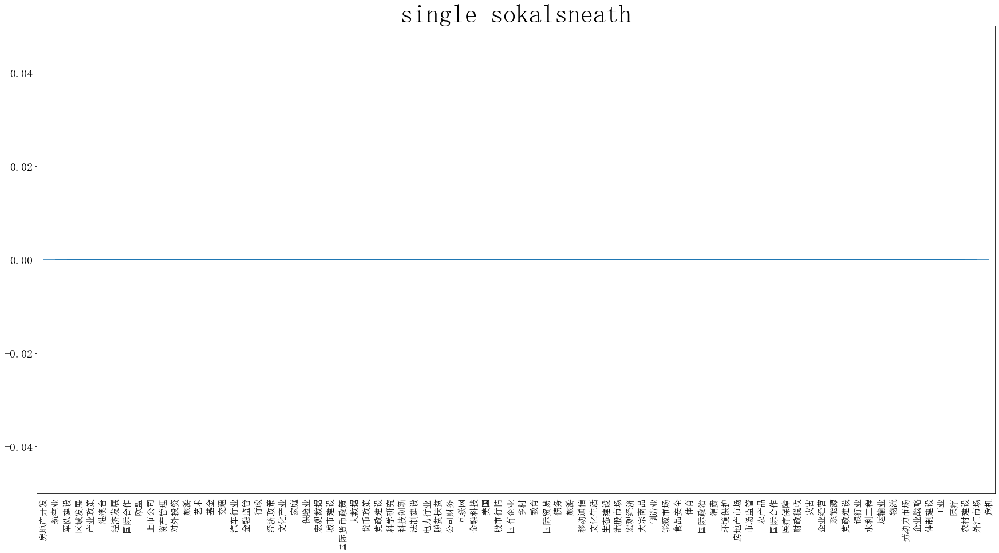

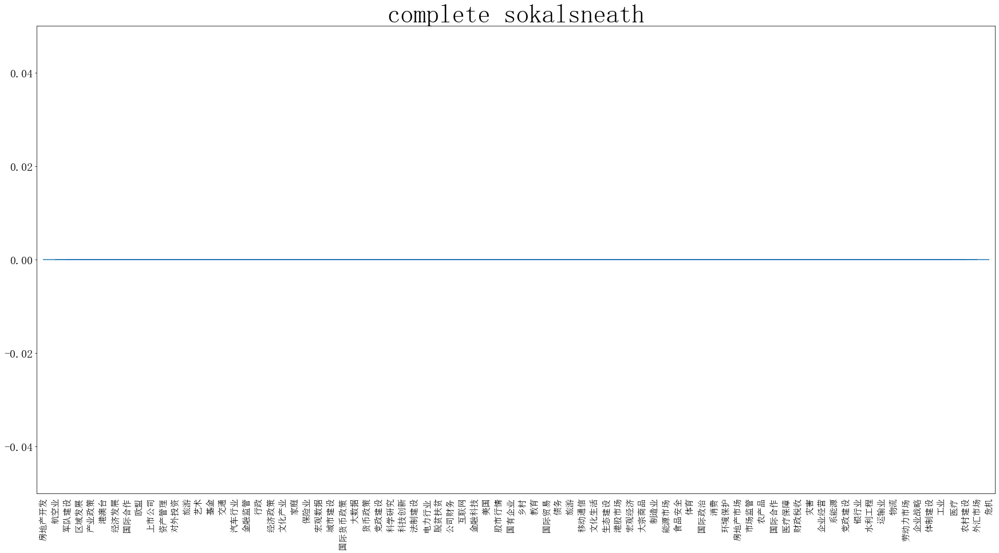

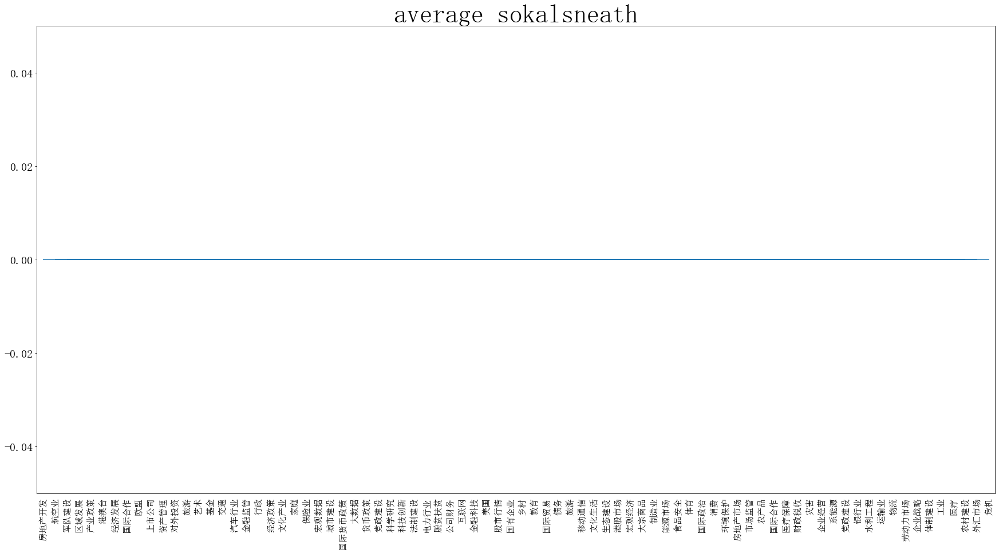

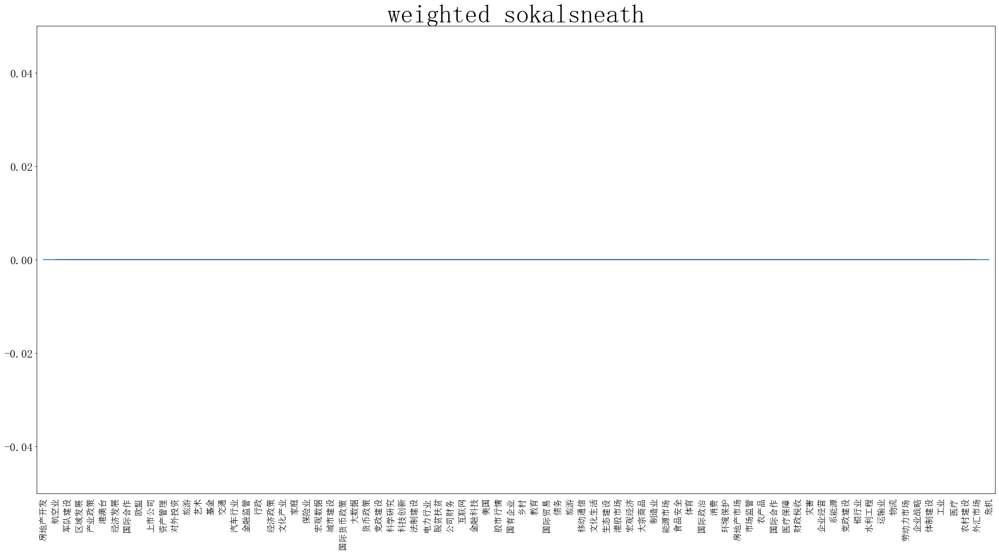

20it [08:26, 24.12s/it]

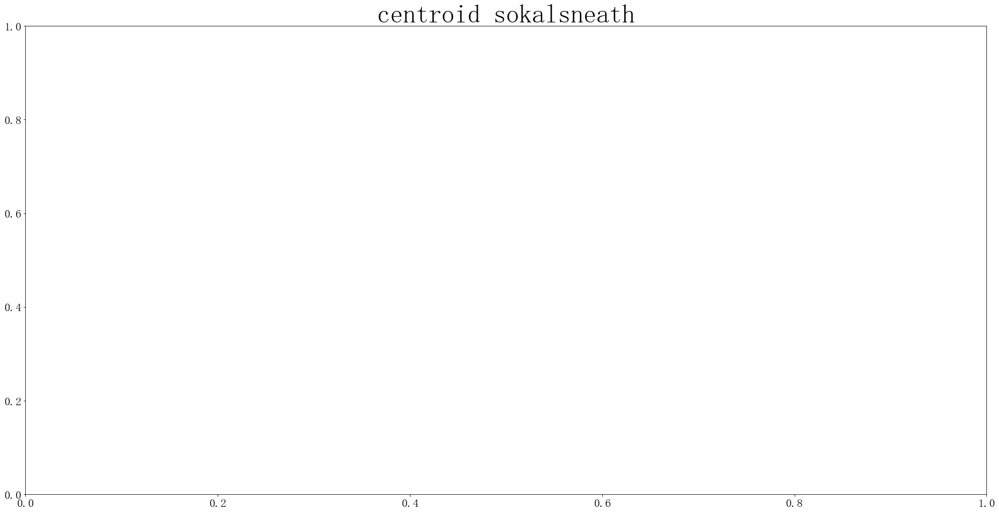

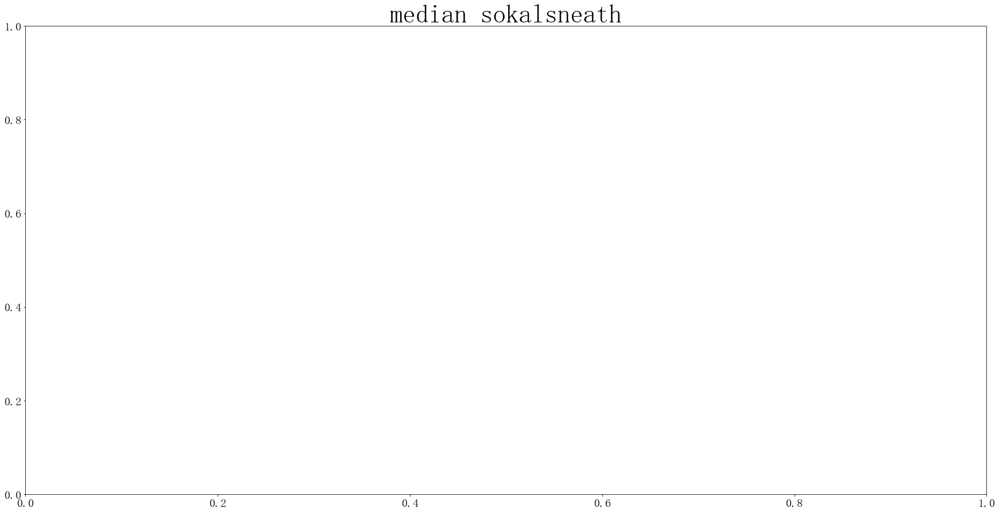

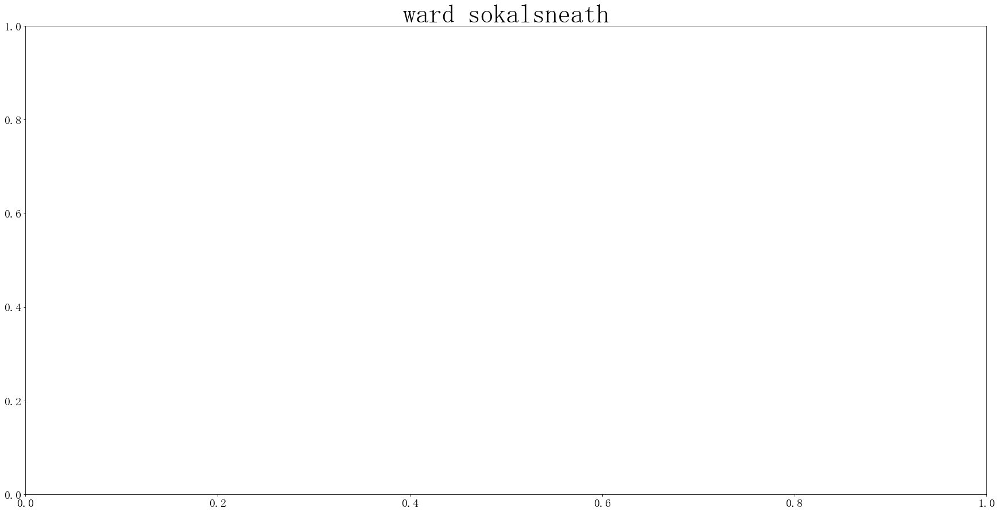

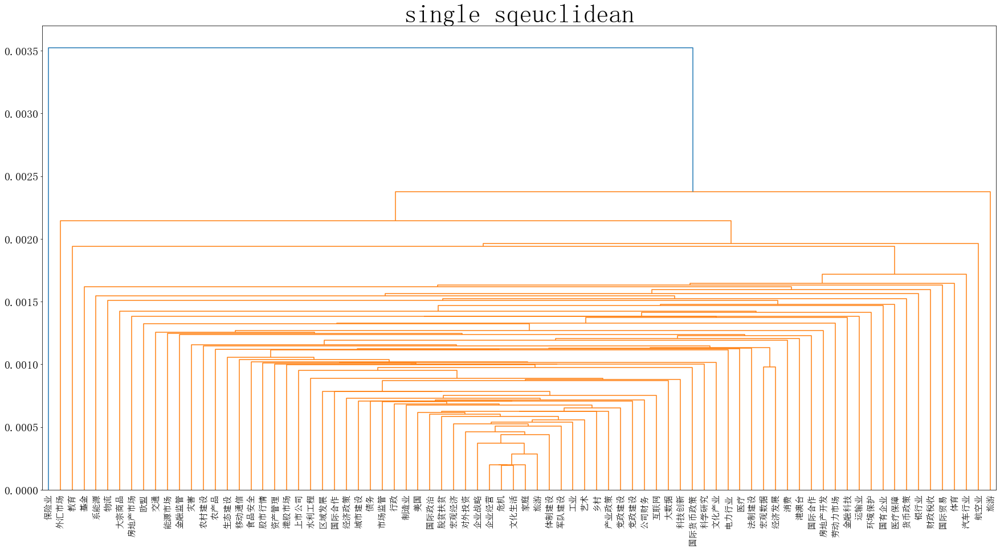

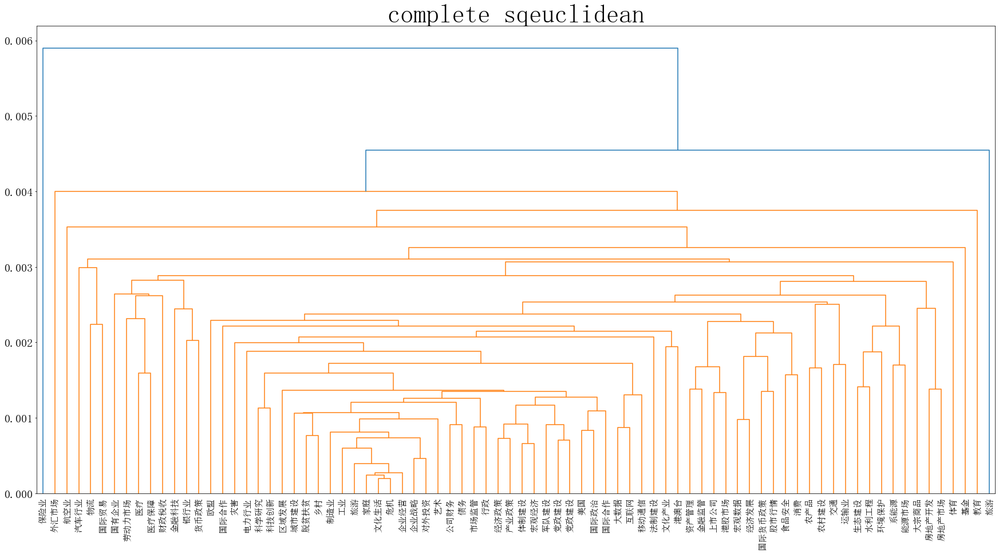

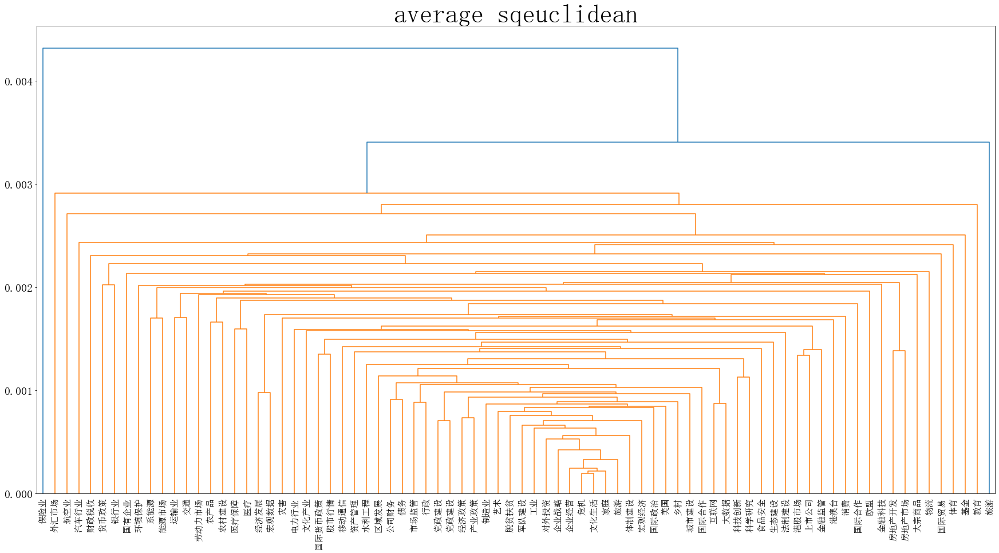

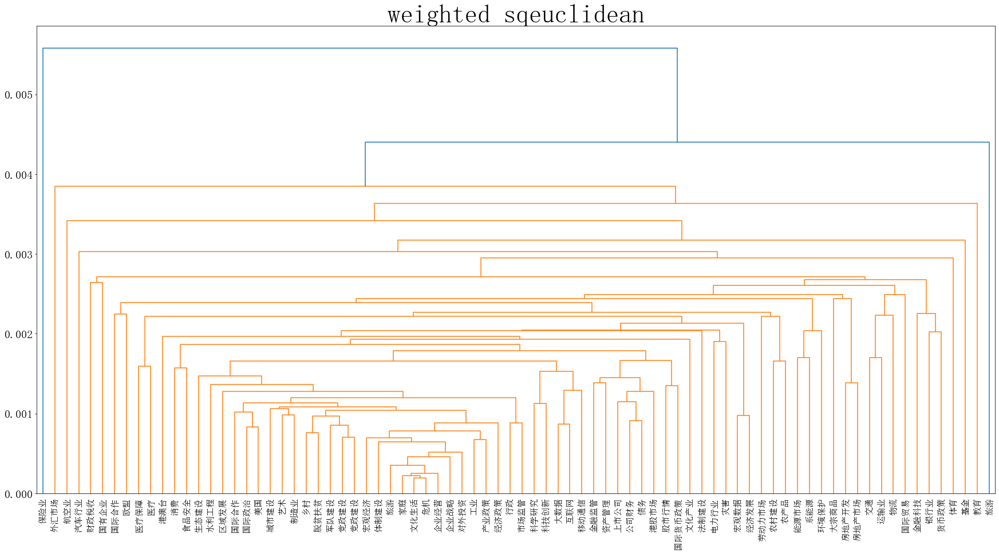

21it [08:48, 23.63s/it]

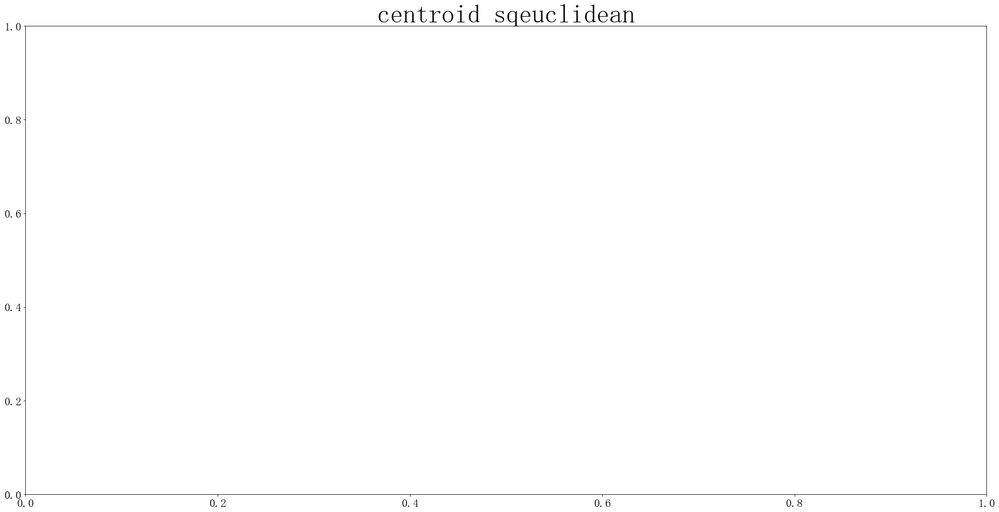

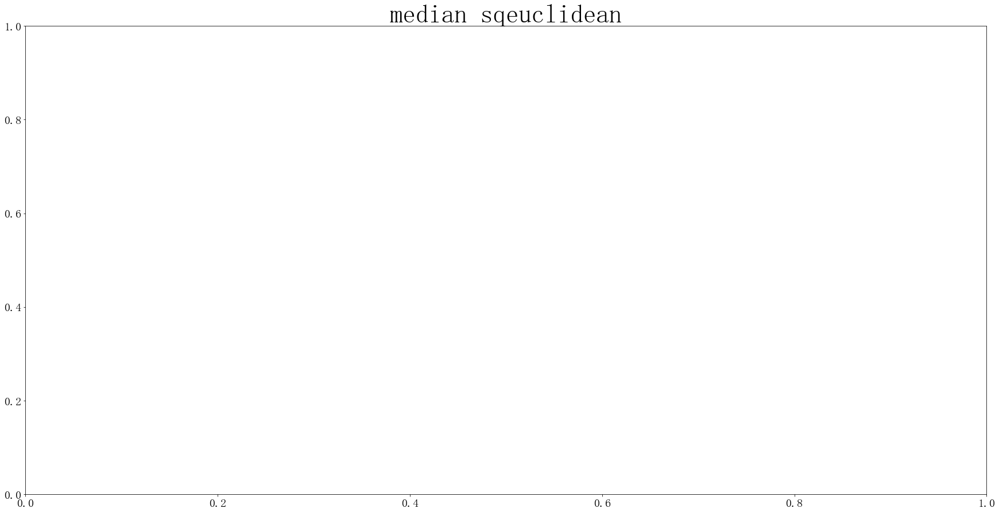

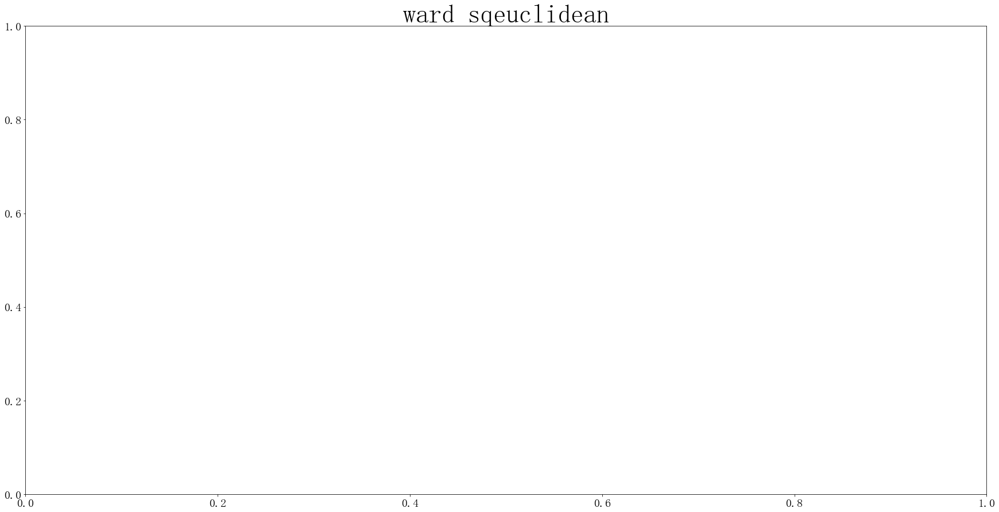

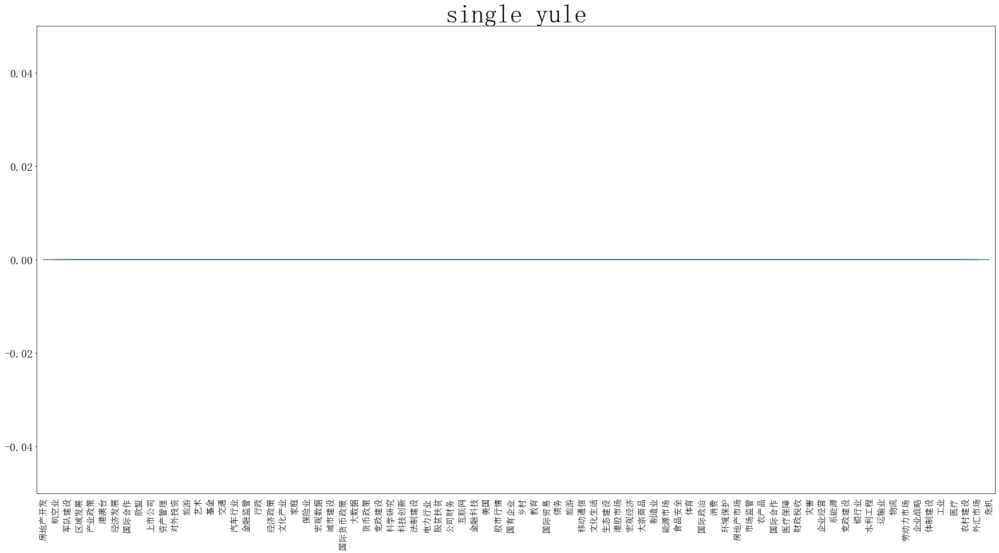

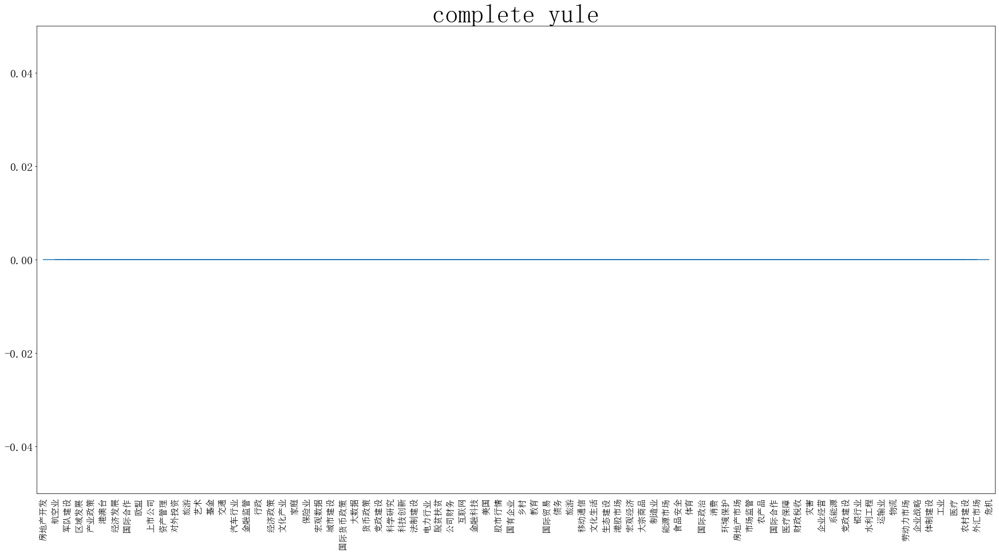

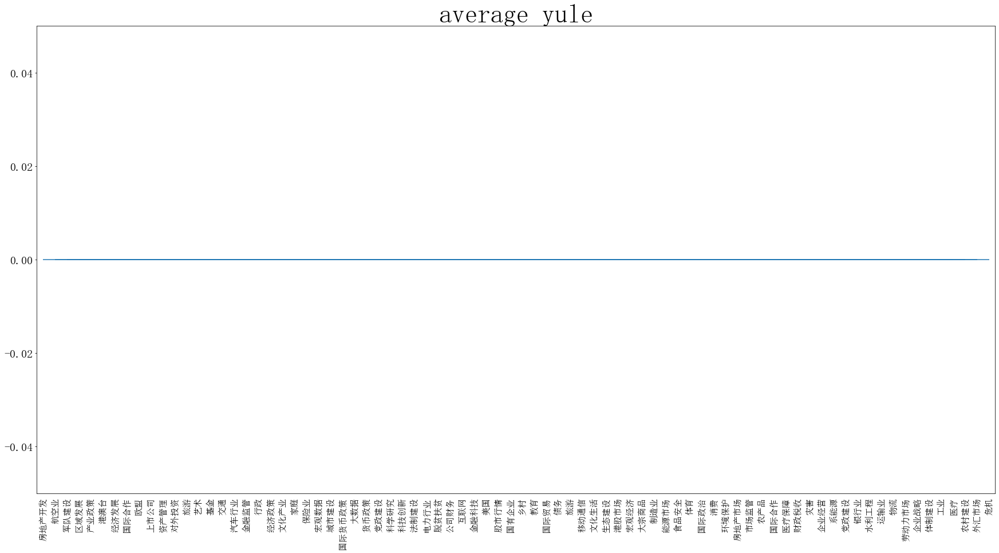

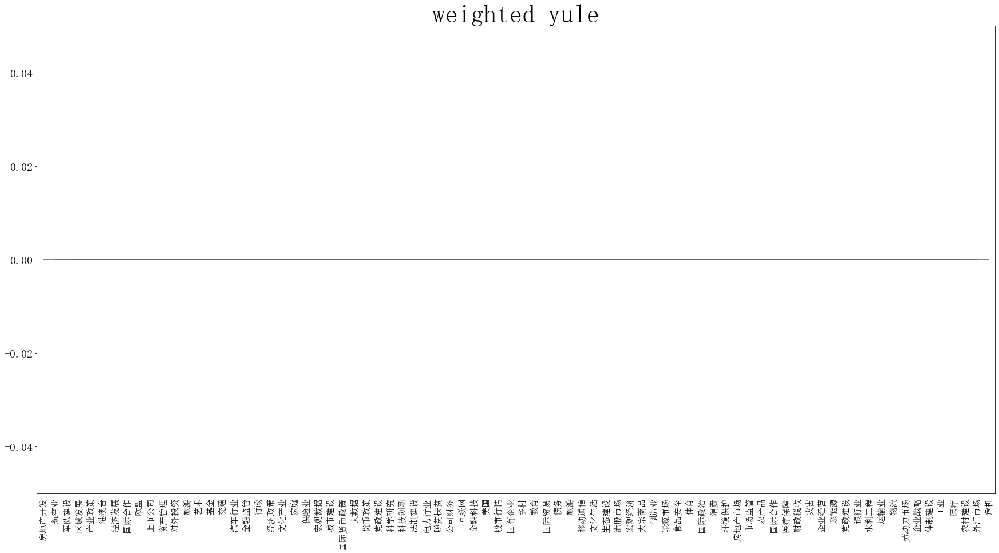

22it [09:13, 25.14s/it]


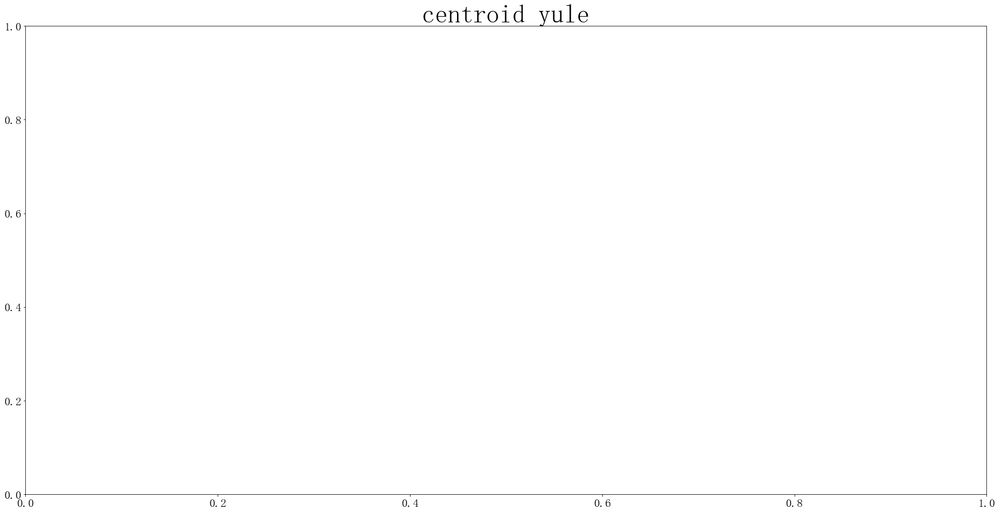

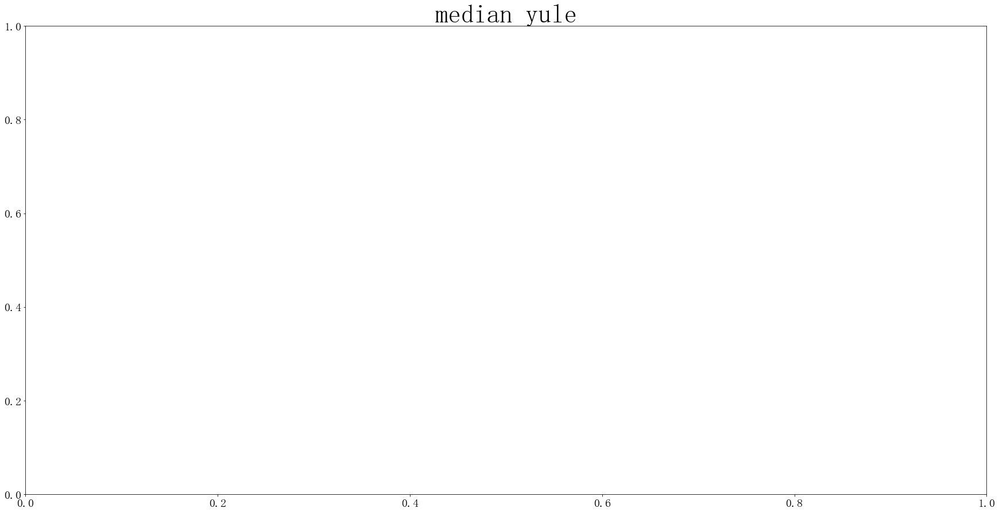

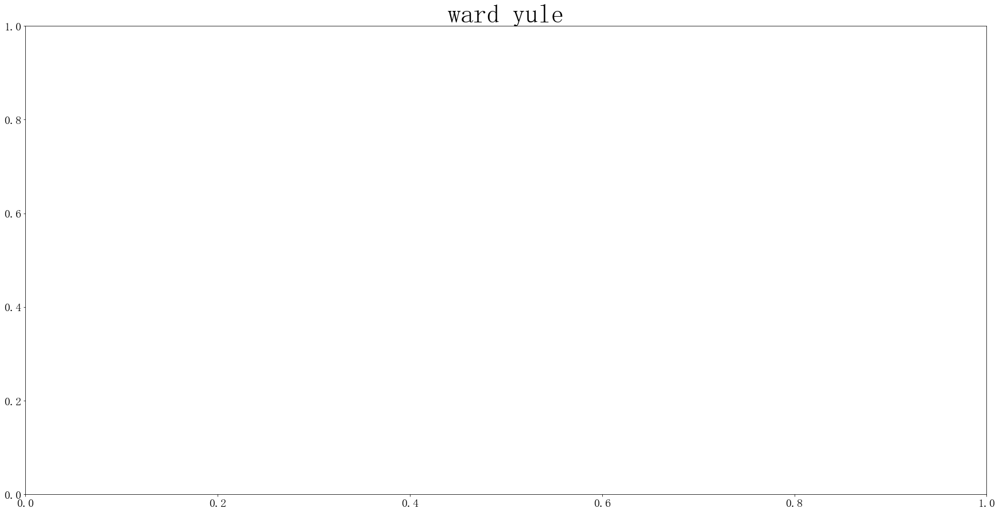

In [66]:
methods = ['single','complete','average','weighted','centroid','median','ward']
# metrics = ['braycurtis','canberra','chebyshev','cityblock','correlation','cosine','dice','euclidean','hamming','jaccard','jensenshannon','kulsinski','mahalanobis','matching','minkowski','rogerstanimoto','russellrao','seuclidean','sokalmichener','sokalsneath','sqeuclidean','yule']
metrics = ['braycurtis','canberra','chebyshev','cityblock','correlation','cosine','euclidean','jensenshannon','mahalanobis','minkowski','seuclidean','sqeuclidean',]
fig_size = 15
num_wordused = len(mdl.used_vocabs)
dir_fig = '../result/papers+juling_tp/fig'
label = list(labels['Label'])
# figure,axes = plt.subplots(row_max,col_max,figsize=(fig_size*col_max*2,fig_size*row_max),tight_layout=True)
plt.subplots_adjust(left  = 0.125,right = 0.9,bottom = 0.1,top = 0.9,wspace = 0.2,hspace = 0.2)
plt.margins(0,0)
#设置字体为楷体
font_path = '../files/fonts/SimSun.ttf'
myfont = matplotlib.font_manager.FontProperties(fname=font_path)  
mpl.rcParams['axes.unicode_minus'] = False  
for i,metric in tqdm(enumerate(metrics)):
    for j,method in enumerate(methods):
        plt.figure(figsize = (fig_size*2,fig_size))
        title = method + ' ' + metric
        plt.title(title,fontsize=fig_size*3)
        try:
            Z=sch.linkage(all_terms_pd, method=method, metric=metric, optimal_ordering=True) 
        except ValueError:
            continue
        dm = sch.dendrogram(Z,labels=label,leaf_font_size = fig_size)
        cluster_folder = f'news_cluster_filter_sw+res+{ex}ex+{quantile}tfidf_{num_topics}topics_{num_wordused}wordused'
        cluster_path = os.path.join(dir_fig,cluster_folder)
        if not os.path.exists(cluster_path):
            os.makedirs(cluster_path)
        cluster_name = f'{metric}_metric_{method}_method.png'
        plt.savefig(os.path.join(cluster_path,cluster_name),bbox_inches = 'tight',transparent=True,pad_inches=0)
        plt.show()
        plt.close()



# 日度时序

In [7]:
import pymysql

In [8]:
%%time
conn = pymysql.connect(host='localhost',
                     port=3306,
                     user='root',
                     password='Datascience2021',
                     db='text',
                     charset='utf8')  #连接对象
cur = conn.cursor()   #游标对象，采用默认的数据格式

sql = 'SELECT * FROM papers4lda'
cur.execute(sql)
papers = cur.fetchall()
conn.commit() 

cur.close()  #关闭游标
conn.close()  #关闭连接

data = pd.DataFrame(papers,columns = ['date','press','num_id','origin','title','subtitle1','subtitle2','text','segmentation','senti_count_pos','senti_count_neg','senti_cal_pos','senti_cal_neg','author','paper_id'])
data['date'] = pd.to_datetime(data['date'])
data = data.set_index(['date'])
data = data.sort_index()

print(data.shape)
data.dropna(axis=0, how='any', thresh=None, subset=['text','segmentation'], inplace=True)
print(data.shape)

(981606, 14)
(960773, 14)
Wall time: 2min 37s


In [10]:
def get_doc_ts(data, day_list):
    ts = pd.DataFrame(columns=['doc_day'])
    for day in day_list:
        doc_day = []
        try:
            data_day = data.loc[day,'document_tfidf']
        except KeyError:
            print(day,'\t 缺失')
        for doc in data_day:
            doc_day.extend(doc)
        ts.loc[day] = [doc_day]
    return ts

def get_topic_series(ts,dictionary_tfidf,lda):
#     infer(self, doc, iter=100, tolerance=-1, workers=0, parallel=0, together=False, transform=None)
    result = lda.get_document_topics(bow = bow,minimum_probability=0)
    num_topics = len(result) 
    res = pd.DataFrame(columns = [i for i in range(num_topics)])
    for idx, doc in tqdm(ts.iterrows()):
        bow = dictionary_tfidf.doc2bow(doc.item())
        result = lda.get_document_topics(bow = bow,minimum_probability=0)
        res.loc[idx] = np.array(result)[:,1]
    return res


In [ ]:
data['document_tfidf'] = document_tfidf
day_list = pd.date_range(data.index[0],data.index[-1],freq='D').strftime("%Y-%m-%d").tolist()
doc_ts = get_doc_ts(data, day_list)
tmp = mdl.make_doc(words=doc_ts.iloc[0])

2000-02-04 	 缺失
2000-02-06 	 缺失
2000-02-07 	 缺失
2000-02-08 	 缺失
2000-02-09 	 缺失
2000-02-27 	 缺失
2000-04-09 	 缺失
2000-05-04 	 缺失
2000-05-14 	 缺失
2000-10-05 	 缺失
2000-10-06 	 缺失
2000-10-07 	 缺失
2000-12-21 	 缺失
2000-12-22 	 缺失
2000-12-30 	 缺失
2001-01-14 	 缺失
2001-01-24 	 缺失
2001-01-26 	 缺失
2001-01-27 	 缺失
2001-01-28 	 缺失
2001-01-29 	 缺失
2001-05-03 	 缺失
2001-05-04 	 缺失
2001-05-06 	 缺失
2002-01-03 	 缺失
2002-02-13 	 缺失
2002-02-14 	 缺失
2002-02-15 	 缺失
2002-02-16 	 缺失
2002-02-17 	 缺失
2002-05-02 	 缺失
2002-05-04 	 缺失
2002-05-07 	 缺失
2002-10-03 	 缺失
2002-10-05 	 缺失
2002-10-13 	 缺失
2003-02-02 	 缺失
2003-02-05 	 缺失
2003-10-03 	 缺失
2003-10-05 	 缺失
2003-10-07 	 缺失
2004-01-23 	 缺失
2004-01-24 	 缺失
2004-01-26 	 缺失
2004-01-27 	 缺失
2004-04-18 	 缺失
2004-05-04 	 缺失
2004-05-06 	 缺失
2004-05-07 	 缺失
2004-10-01 	 缺失
2004-10-03 	 缺失
2004-10-06 	 缺失
2004-10-07 	 缺失
2004-10-24 	 缺失
2004-11-21 	 缺失
2005-02-10 	 缺失
2005-02-11 	 缺失
2005-02-13 	 缺失
2005-02-14 	 缺失
2005-04-05 	 缺失
2005-05-01 	 缺失
2005-05-04 	 缺失
2005-05-

--- Logging error ---
--- Logging error ---
--- Logging error ---
--- Logging error ---
--- Logging error ---
Error in sys.excepthook:
Traceback (most recent call last):
  File "C:\Users\linhw\AppData\Roaming\Python\Python38\site-packages\IPython\core\interactiveshell.py", line 2061, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'AttributeError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\linhw\AppData\Roaming\Python\Python38\site-packages\IPython\core\interactiveshell.py", line 2063, in showtraceback
    stb = self.InteractiveTB.structured_traceback(etype,
  File "C:\Users\linhw\AppData\Roaming\Python\Python38\site-packages\IPython\core\ultratb.py", line 1367, in structured_traceback
    return FormattedTB.structured_traceback(
  File "C:\Users\linhw\AppData\Roaming\Python\Python38\site-packages\IPython\core\ultratb.py", line 1267, in struc

In [ ]:
topic_series = get_topic_series(doc_ts,dictionary_tfidf,mdl) 


In [ ]:
dirs_csv = '../result/papers+juling_tp/csv'
topic_series_filename = 'news_kw_filter_sw+res+ex+tfidf_{}topics_{}quantitle.csv'.format(num_topics,quantile)
topic_series_path = os.path.join(dirs_csv,topic_series_filename)
topic_series.to_csv(topic_series_path, sep=',',header=True, index=True,mode='w', encoding=None)
print('\t主题时序已存入 {}'.format(topic_series_filename))


In [ ]:
doc_ts

In [76]:
mdl.infer(doc=doc_ts, iter=100, tolerance=-1, workers=0, parallel=0, together=False, transform=None)

ValueError: `doc` must be tomotopy.Document type or list of tomotopy.Document

In [ ]:
from tomotopy.utils import Corpus
corpus_day = Corpus()
for doc in tqdm(doc_ts['doc_day']):
    corpus_day.add_doc(doc)